# Import

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

# warning, 선 고화질

warnings.filterwarnings(action='ignore')
%config InlineBackend.figure_format = 'retina'

# 한글 폰트, 마이너스 부호
plt.rc('font', family='Malgun Gothic')
sns.set(rc={"axes.unicode_minus":False})
palette = sns.color_palette("bright")

# Data Load

In [ ]:
# 파일불러오기
train = pd.read_csv('/content/drive/MyDrive/collab/기임/공기압축기이상판단/train_data.csv')
test = pd.read_csv('/content/drive/MyDrive/collab/기임/공기압축기이상판단/test_data.csv')

In [ ]:
train.shape

(2463, 8)

In [ ]:
test.shape

(7389, 8)

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2463 entries, 0 to 2462
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   air_inflow     2463 non-null   float64
 1   air_end_temp   2463 non-null   float64
 2   out_pressure   2463 non-null   float64
 3   motor_current  2463 non-null   float64
 4   motor_rpm      2463 non-null   float64
 5   motor_temp     2463 non-null   float64
 6   motor_vibe     2463 non-null   float64
 7   type           2463 non-null   int64  
dtypes: float64(7), int64(1)
memory usage: 154.1 KB


## hp columns 추가

In [ ]:
for data in [train,test] :
    data.loc[data['type'].isin([0,4,5,6,7]),'hp'] = 30
    data.loc[data['type'] == 1,'hp'] = 20
    data.loc[data['type'] == 2,'hp'] = 10
    data.loc[data['type'] == 3,'hp'] = 50

In [ ]:
train.head()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,hp
0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0,30.0
1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0,30.0
2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0,30.0
3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0,30.0
4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0,30.0


In [ ]:
test.head()

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,hp
0,2.51,53.28,0.7,32.54,2662.0,69.58,3.48,0,30.0
1,2.66,55.24,0.7,34.45,2819.0,71.32,3.57,0,30.0
2,1.72,42.74,0.7,22.23,1819.0,60.21,3.01,0,30.0
3,2.20,49.15,0.7,28.50,2332.0,65.91,3.30,0,30.0
4,2.06,47.28,0.7,26.67,2182.0,64.24,3.21,0,30.0


## data 병합

In [ ]:
data = pd.concat([train,test],axis = 0)

In [ ]:
data.shape

(9852, 9)

# EDA

## 단변량 분석

### 컬럼별 데이터 분포 확인

In [ ]:
train.nunique()

air_inflow        463
air_end_temp     1573
out_pressure        1
motor_current    1609
motor_rpm        1537
motor_temp       1589
motor_vibe        324
type                8
hp                  4
dtype: int64

In [ ]:
test.nunique()

air_inflow        561
air_end_temp     2374
out_pressure        5
motor_current    2913
motor_rpm        2243
motor_temp       2423
motor_vibe        340
type                8
hp                  4
dtype: int64

out_pressure, type, hp를 제외한 모든 컬럼이 연속형, 수치형 변수이다.<br>
hp는 type를 그룹화시킨 컬럼이므로, hp가 온전히 type을 대체할 수 있을지<br>
다변량 분석에서 확인해보자

### 1) air_inflow_style1

In [ ]:
def make_hist(col):
    plt.figure(figsize=(15,12))
    plt.subplot(221)
    sns.histplot(x=col, data=train, kde=True, palette = palette)
    plt.title(f'(train) {col} histplot')
    plt.subplot(222)
    sns.histplot(x=col, data=train, kde=True, hue='hp', palette = palette)
    plt.title(f'(train) {col} histplot')

    plt.subplot(223)
    sns.histplot(x=col, data=test, kde=True, palette = palette)
    plt.title(f'(test) {col} histplot')
    plt.subplot(224)
    sns.histplot(x=col, data=test, kde=True, hue='hp', palette = palette)
    plt.title(f'(test) {col} histplot')
    plt.show();

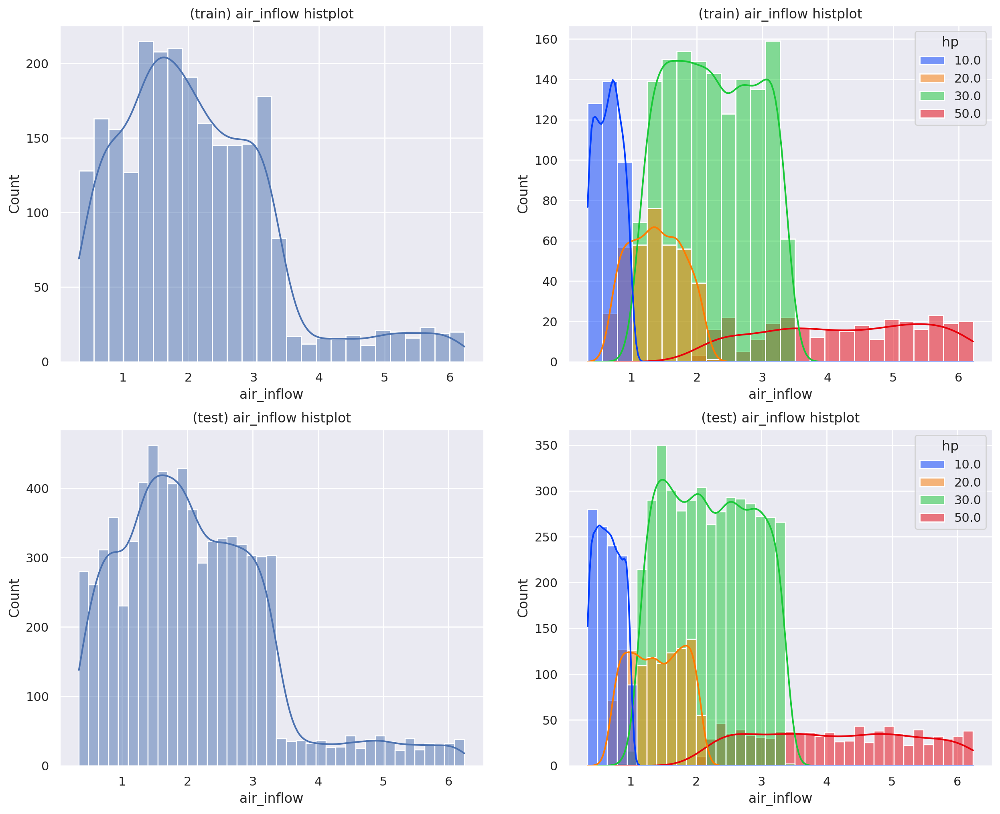

In [ ]:
make_hist('air_inflow')

마력에 따라 분포가 다르게 나타나고(마력이 커질 수록 air_inflow도 상승), train과 test의 분포가 거의 동일하다.

### 2) air_end_temp_style2

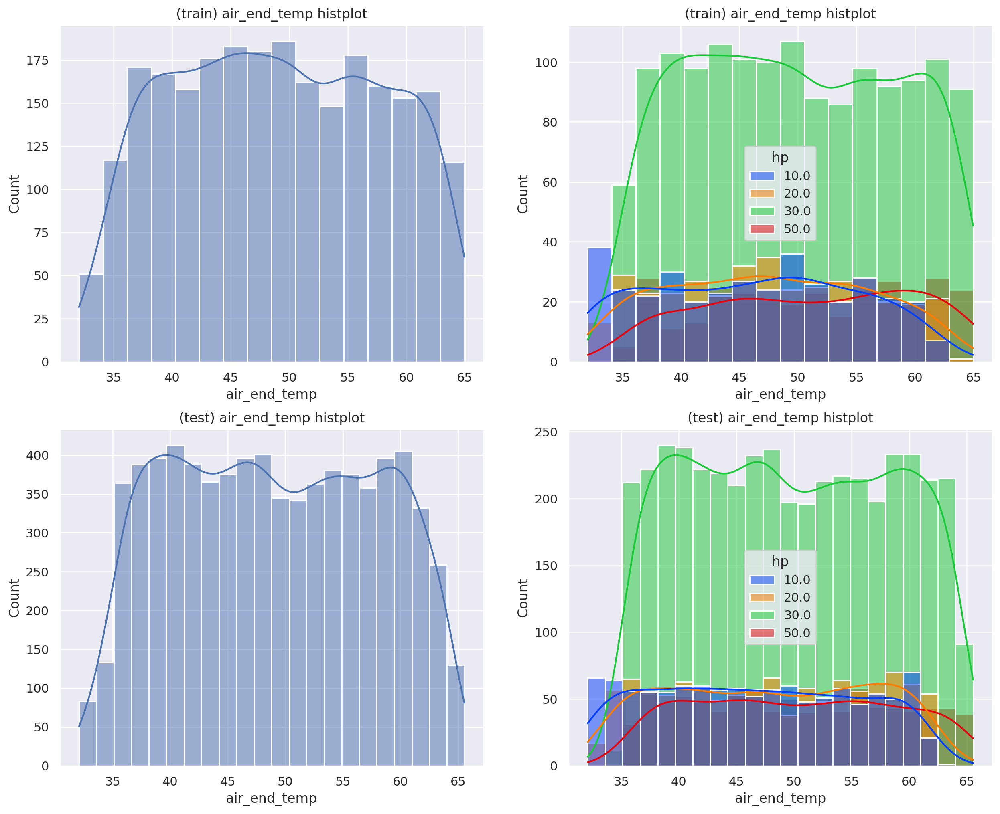

In [ ]:
make_hist('air_end_temp')

마력과 상관없이 고르게 분포하고, train과 test의 분포가 거의 동일하다.

### 3) out_pressure_style3


In [ ]:
col = 'out_pressure'
print(train[col].nunique())
print(test[col].nunique())

1
5


In [ ]:
test[col].unique()

array([0.7 , 0.6 , 0.54, 0.5 , 0.49])

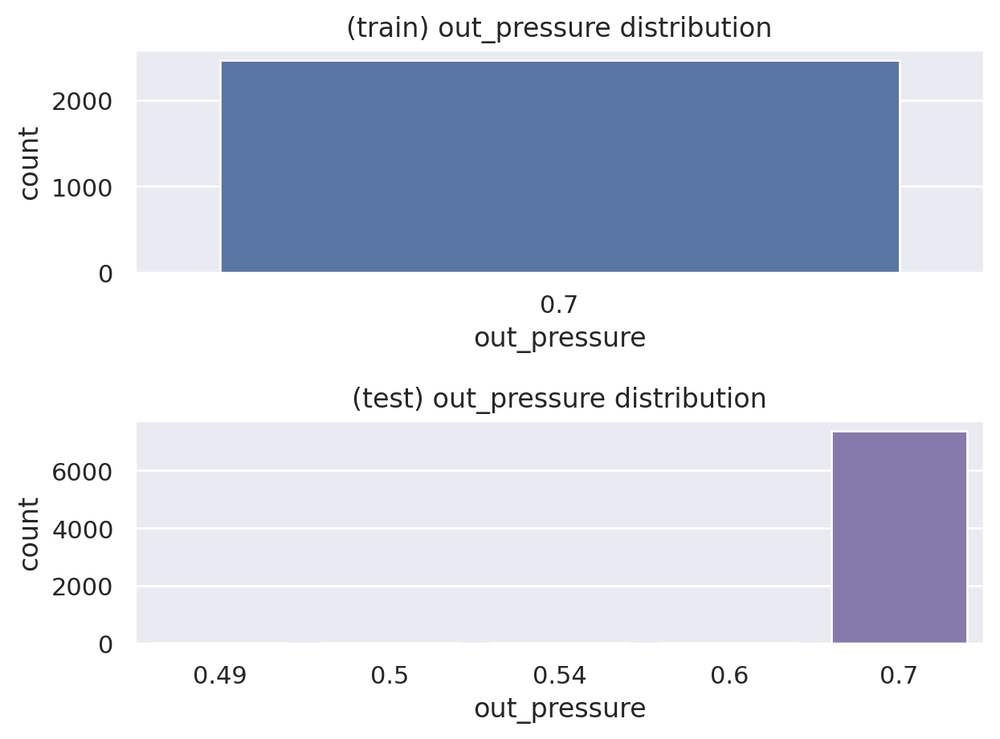

In [ ]:
plt.subplot(211)
sns.countplot(x='out_pressure', data=train)
plt.title('(train) out_pressure distribution')
plt.subplot(212)
sns.countplot(x='out_pressure', data=test)
plt.title('(test) out_pressure distribution')
plt.tight_layout();

In [ ]:
test[col].value_counts()

0.70    7382
0.60       2
0.50       2
0.49       2
0.54       1
Name: out_pressure, dtype: int64

In [ ]:
test.loc[test['out_pressure']!=0.7,'hp'].value_counts()

30.0    7
Name: hp, dtype: int64

out_pressure가 0.7이 아닌 데이터포인트들은 모두 hp가 30이다.<br>
이 데이터 포인트들은 고장일 수 있으니 저장해둔다.

In [ ]:
op_anorm = test.loc[test[col]!=0.7].index
op_anorm

Int64Index([4917, 4918, 4919, 4920, 4921, 4922, 4923], dtype='int64')

### 4) motor_current_style1

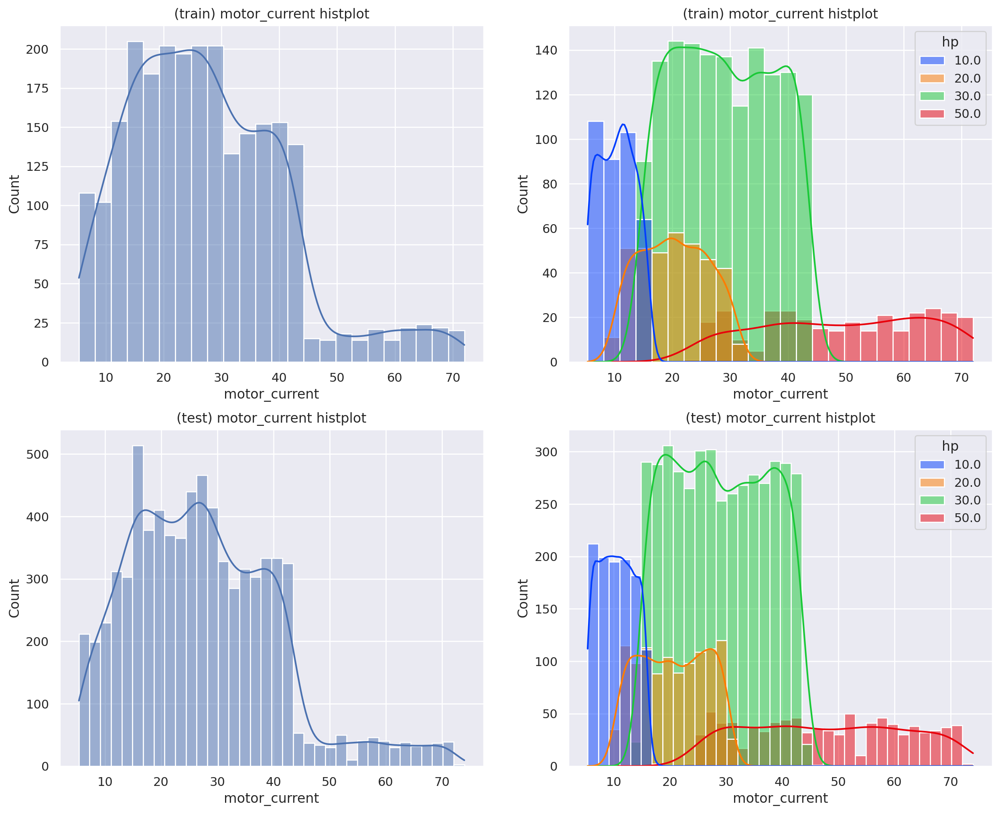

In [ ]:
make_hist('motor_current')

마력에 따라 분포가 다르게 나타나고(마력이 커질수록 morto_current도 상승), train과 test의 분포가 거의 동일하다.<br>
air_inflow와 비슷한 분포를 보이기에 다변량 분석에서 두 컬럼 간의 상관관계 확인 필요

### 5) motor_rpm_style2

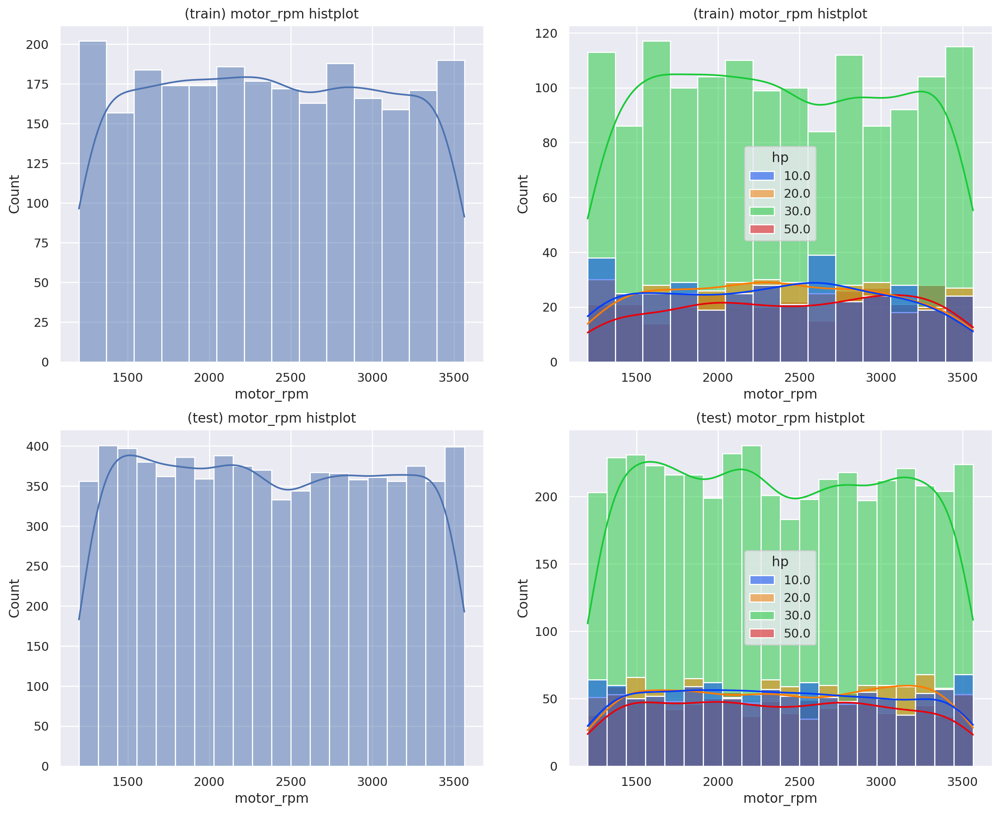

In [ ]:
make_hist('motor_rpm')

마력과 상관없이 고르게 분포하고, train과 test의 분포가 거의 동일하다.<br>
air_end_temp와 상관관계 확인

### 6) motor_temp_style2

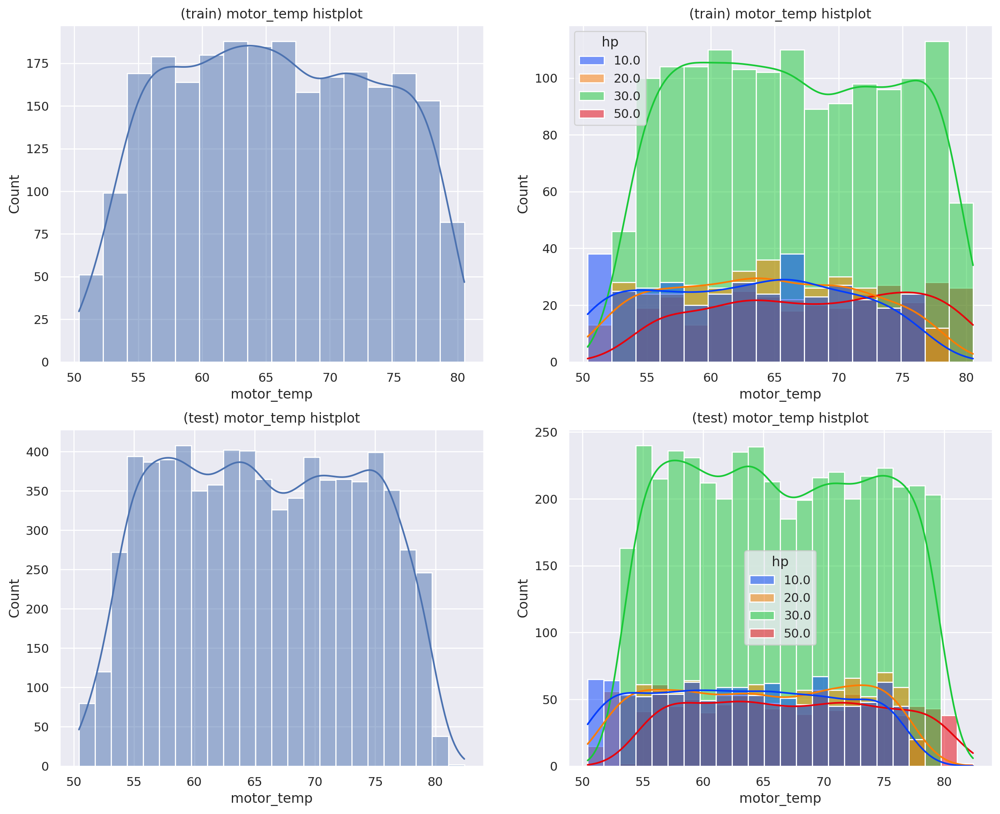

In [ ]:
make_hist('motor_temp')

마력과 상관없이 고르게 분포하고, train과 test의 분포가 거의 동일하다.<br>
air_end_temp, motor_rpm, motor_temp 상관관계 확인

### 7) motor_vibe_style1

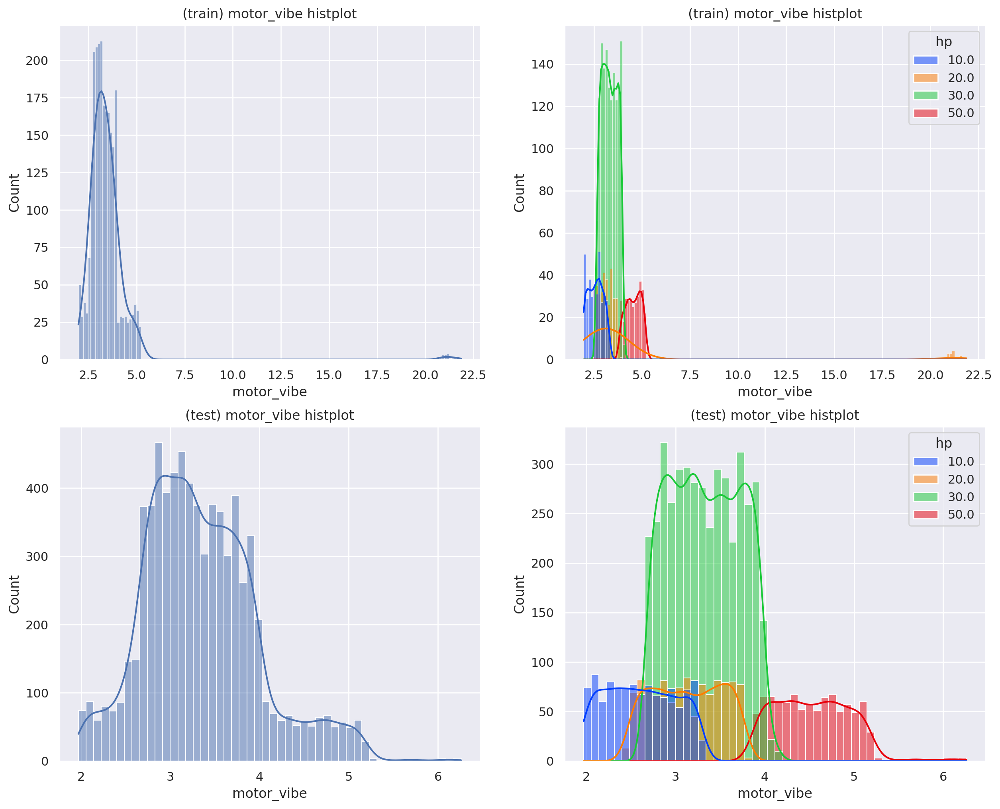

In [ ]:
make_hist('motor_vibe')

In [ ]:
train.loc[train['motor_vibe'] >= 7, 'hp'].value_counts()

20.0    16
Name: hp, dtype: int64

motor_vibe가 특별히 크게 나타난 구간(motor_vibe > 20은 모두 hp==20이다.<br>
해당 구간을 제외 하고는 다른 style1 column과 같이<br>
마력에 따라 분포가 다르게 나타나고(마력이 커질수록 motor_current도 상승), train과 test의 분포가 거의 동일하다.<br>
air_inflow, motor_current, motor_vibe 상관관계 확인 필요<br>
motor_vibe가 다른 기준에 비해 높으나 이것도 고장이 아닌 것으로 보아서, motor_vibe는 고장 증상을 반영하지 못한다.<br>
상관관계가 높은 다른 값으로 대체하는 것도 하나의 방법이다.

### 8) type

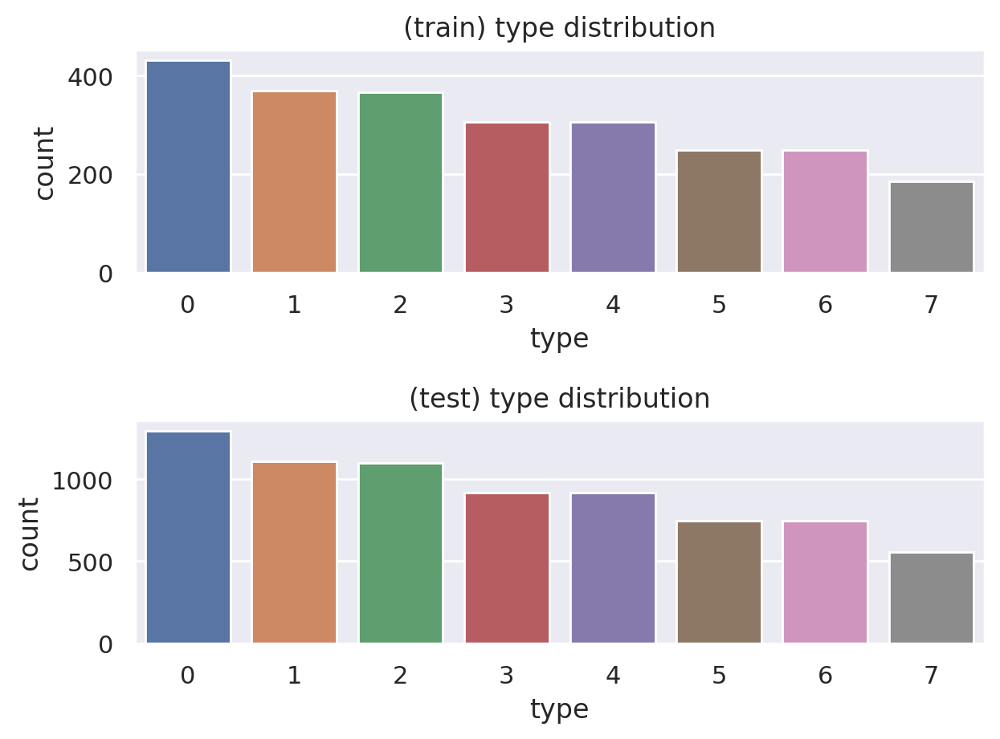

In [ ]:
plt.subplot(211)
sns.countplot(x='type', data=train)
plt.title('(train) type distribution')
plt.subplot(212)
sns.countplot(x='type', data=test)
plt.title('(test) type distribution')
plt.tight_layout();

train과 test에서 비슷한 분포를 보인다.

### 9) hp

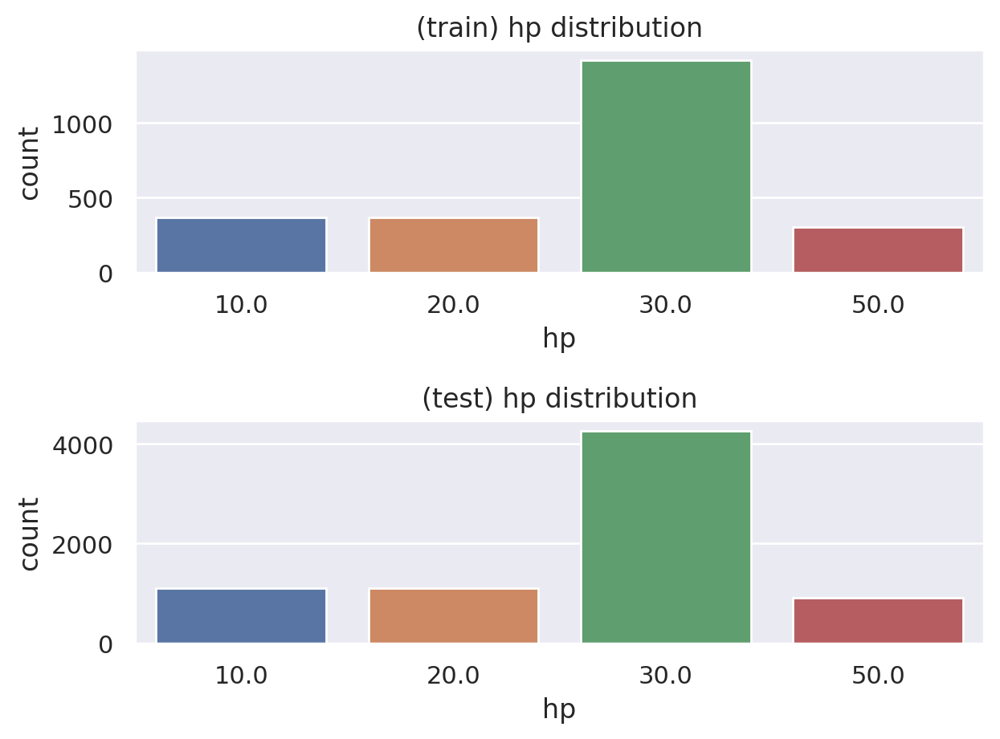

In [ ]:
plt.subplot(211)
sns.countplot(x='hp', data=train)
plt.title('(train) hp distribution')
plt.subplot(212)
sns.countplot(x='hp', data=test)
plt.title('(test) hp distribution')
plt.tight_layout();

train과 test에서 비슷한 분포를 보인다. data imbalance를 고려해줄 필요가 있다.

## 이변량 분석

### correlation

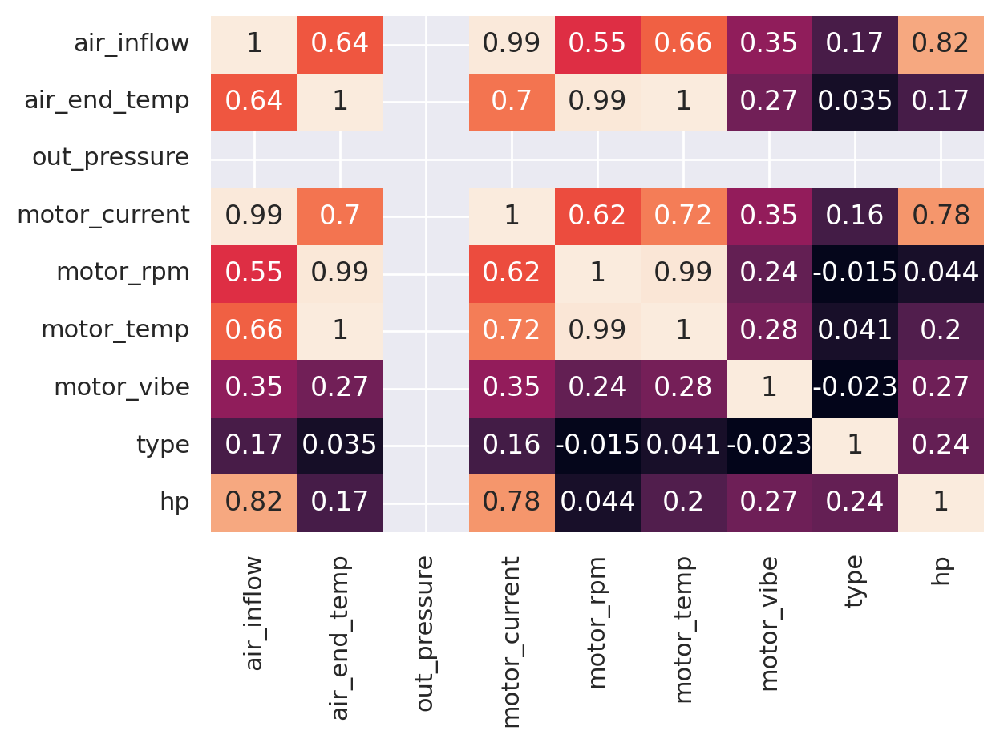

In [ ]:
sns.heatmap(train.corr(), annot=True, cbar=False)
plt.tight_layout()

type을 제외하고 모든 열이 유의미한 상관관계를 가진다.

### (train) correlation by style

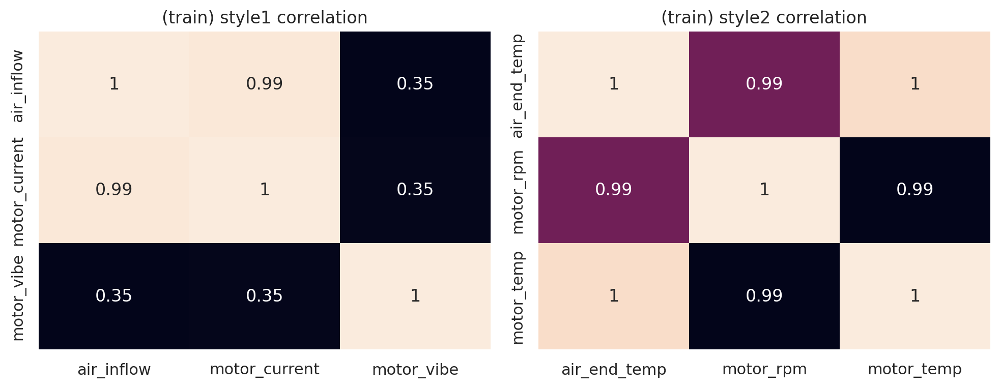

In [ ]:
plt.figure(figsize=(10,4))
plt.subplot(121)
style1 = ['air_inflow','motor_current','motor_vibe']
sns.heatmap(train[style1].corr(), annot=True, cbar=False)
plt.title('(train) style1 correlation')
plt.subplot(122)
style2 = ['air_end_temp','motor_rpm','motor_temp']
sns.heatmap(train[style2].corr(), annot=True, cbar=False)
plt.title('(train) style2 correlation')
plt.tight_layout()

style1 - air_inflow와 motor_current는 완전히 선형관계이며, motor_vibe와는 약한 상관관계를 지닌다.<br>
style2 - 세 개의 column 모두 완전한 선형관계를 가진다.<br>
style1은 hp에 따라 다른 분포를 가졌으므로, 같은 hp에 대해 상관관계를 비교해보자

In [ ]:
train['hp'].unique()

array([30., 20., 10., 50.])

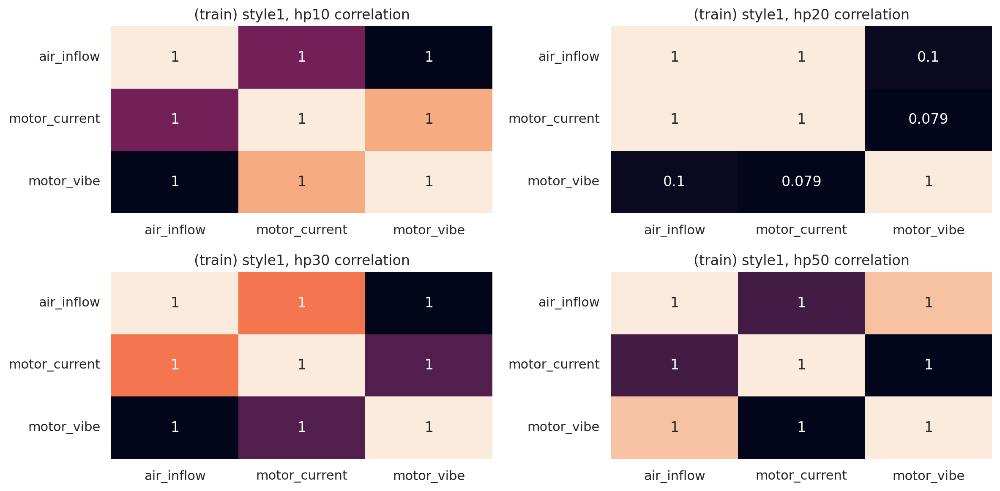

In [ ]:
style1 = ['air_inflow','motor_current','motor_vibe']
plt.figure(figsize=(12,6))
plt.subplot(221)
sns.heatmap(train.loc[train['hp']==10,style1].corr(), annot=True, cbar=False)
plt.title('(train) style1, hp10 correlation')
plt.subplot(222)
sns.heatmap(train.loc[train['hp']==20,style1].corr(), annot=True, cbar=False)
plt.title('(train) style1, hp20 correlation')
plt.subplot(223)
sns.heatmap(train.loc[train['hp']==30,style1].corr(), annot=True, cbar=False)
plt.title('(train) style1, hp30 correlation')
plt.subplot(224)
sns.heatmap(train.loc[train['hp']==50,style1].corr(), annot=True, cbar=False)
plt.title('(train) style1, hp50 correlation')
plt.tight_layout()

hp==20 일때를 제외하고 style1의 세개 컬럼은 모두 완전한 선형관계이다.<br>
hp의 수치가 중요한 것이 아니라 hp가 20인지 아닌지가 중요하다<br>
그런데 hp==20 일 때 motor_vibe에서 이상치가 섞여있으므로 해당 데이터를 제외하고 다시 확인해보자

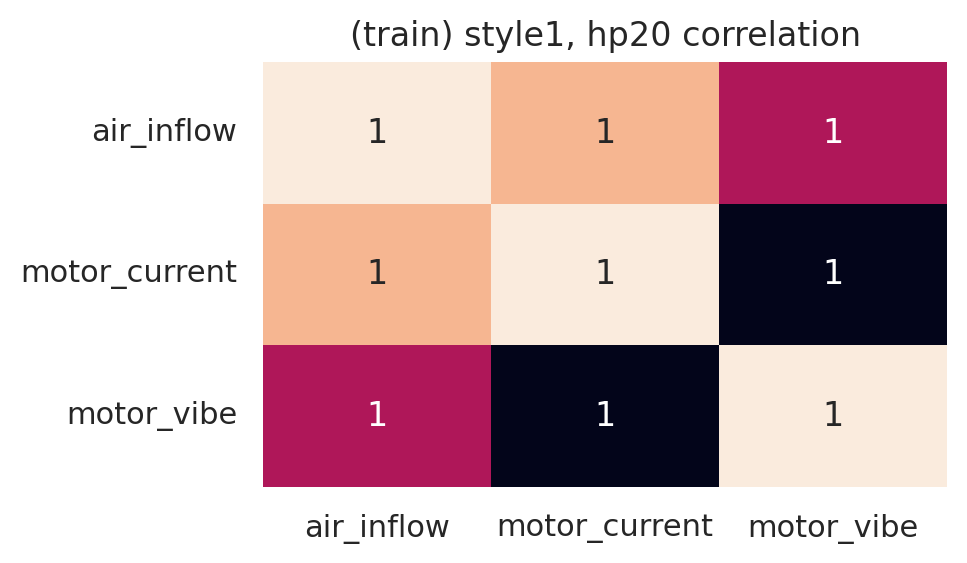

In [ ]:
plt.figure(figsize=(5,3))
sns.heatmap(train.loc[(train['hp']==20) & (train['motor_vibe']<20),style1].corr(), annot=True, cbar=False)
plt.title('(train) style1, hp20 correlation')
plt.tight_layout()

hp==20이더라도 이상치를 제외하고는 모두 완전한 선형관계이다.<br>
따라서 style1과 style2에서 대표적인 column 1개씩을 feature로 삼을 수 있겠다.

### (test) correlation by style

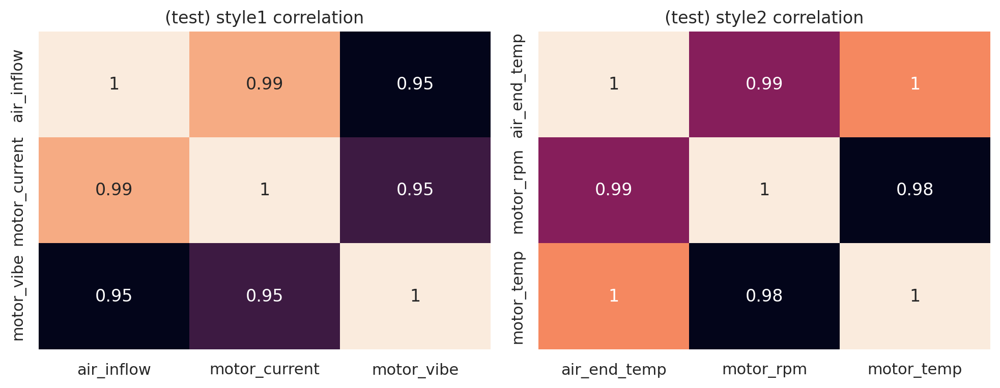

In [ ]:
plt.figure(figsize=(10,4))
plt.subplot(121)
style1 = ['air_inflow','motor_current','motor_vibe']
sns.heatmap(test[style1].corr(), annot=True, cbar=False)
plt.title('(test) style1 correlation')
plt.subplot(122)
style2 = ['air_end_temp','motor_rpm','motor_temp']
sns.heatmap(test[style2].corr(), annot=True, cbar=False)
plt.title('(test) style2 correlation')
plt.tight_layout()

test set에서는 상관관계가 다른 것들과 크게 차이나는 것이 없는 것으로 보아<br>이상치가 몇개 존재할뿐 대세를 거르는 data분포는 없는 것으로 추측해보자

### (train) type에 따른 분포 확인

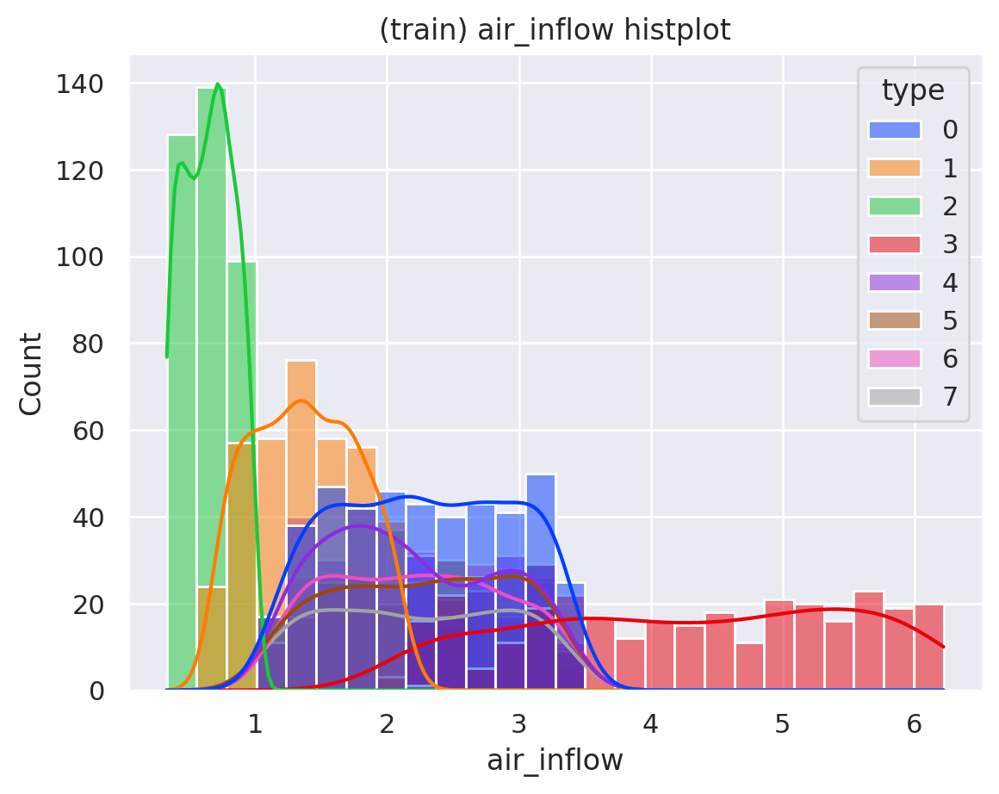

In [ ]:
col = 'air_inflow'
sns.histplot(x=col, data=train, kde=True, hue='type', palette = palette)
plt.title(f'(train) {col} histplot')
plt.show();

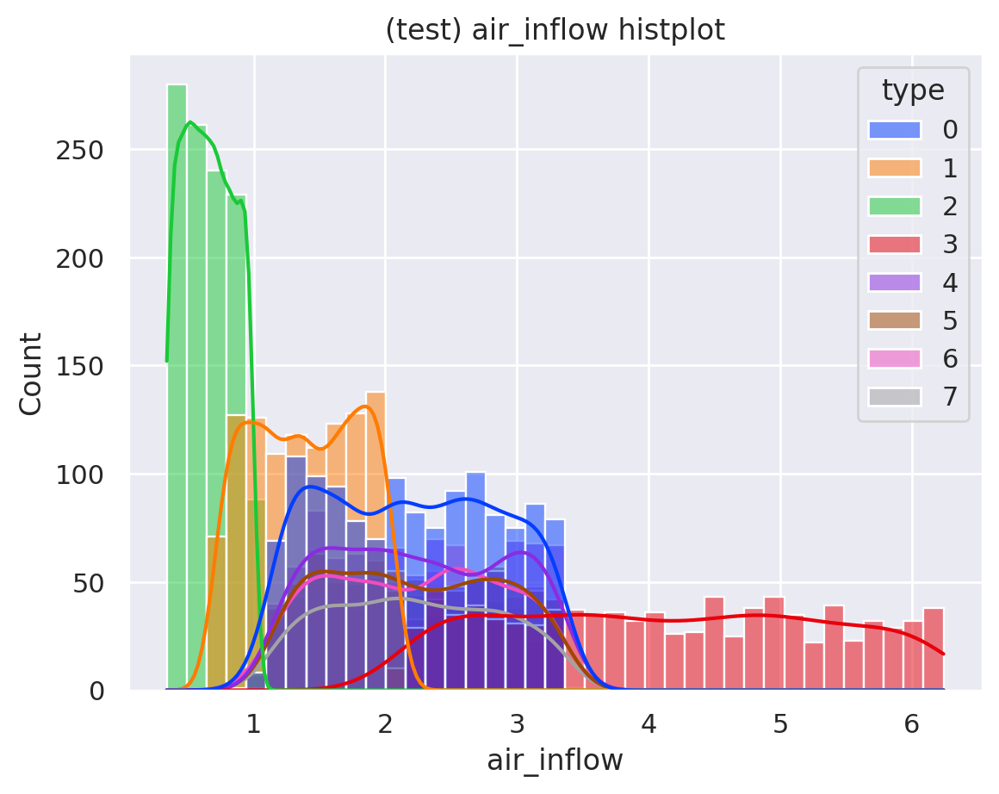

In [ ]:
col = 'air_inflow'
sns.histplot(x=col, data=test, kde=True, hue='type', palette = palette)
plt.title(f'(test) {col} histplot')
plt.show();

hp30 = [0,4,5,6,7], hp20 = [1], hp10 = [2], hp50 = [3] 이므로,<br>
type 별로 나누어도 hp로 그룹지어서 나눈 것과 분포가 동일한 것처럼 보인다. 한번 더 확인해보자

### (train) style1 vs style2

In [ ]:
train

,air_inflow,air_end_temp,out_pressure,motor_current,motor_rpm,motor_temp,motor_vibe,type,hp
0,1.59,41.00,0.7,20.53,1680.0,58.67,2.93,0,30.0
1,2.97,59.28,0.7,38.40,3142.0,74.91,3.75,0,30.0
2,1.91,45.29,0.7,24.73,2023.0,62.48,3.12,0,30.0
3,2.37,51.33,0.7,30.63,2506.0,67.84,3.39,0,30.0
4,1.90,45.21,0.7,24.65,2017.0,62.41,3.12,0,30.0
...,...,...,...,...,...,...,...,...,...
2458,2.28,50.20,0.7,29.53,2416.0,66.84,3.34,7,30.0
2459,2.04,46.94,0.7,26.34,2155.0,63.94,3.20,7,30.0
2460,1.19,35.74,0.7,15.39,1259.0,53.99,2.70,7,30.0
2461,1.21,36.00,0.7,15.64,1280.0,54.22,2.71,7,30.0


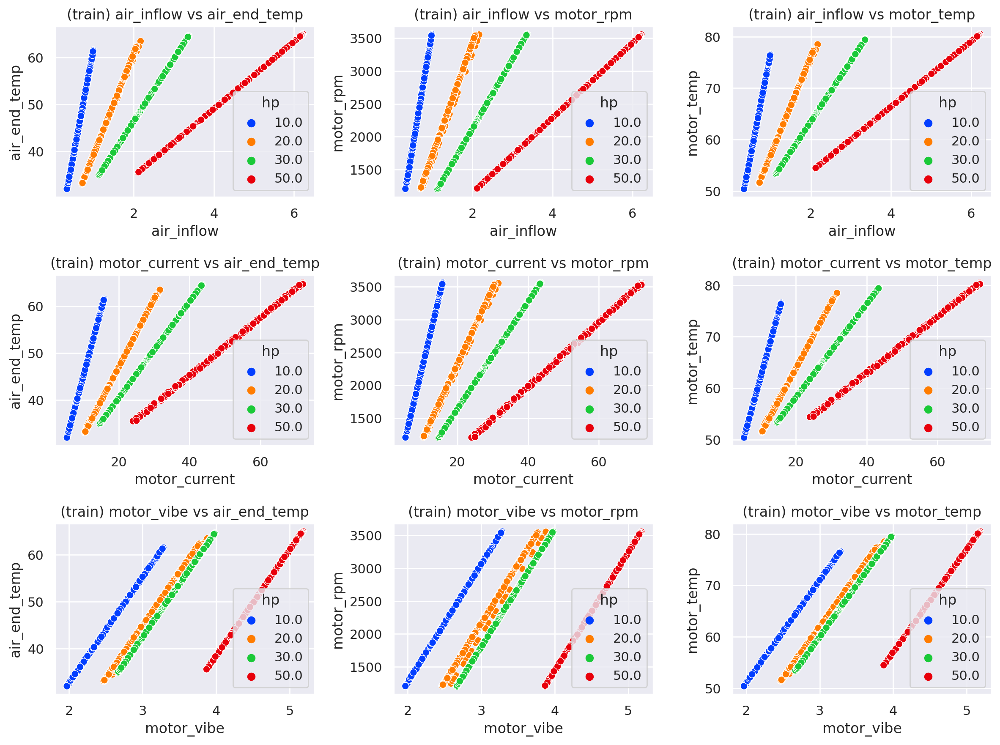

In [ ]:
df = train.loc[train['motor_vibe']<20]
i = 1
plt.figure(figsize=(12,9))
for col1 in style1 :
    for col2 in style2 :
        plt.subplot(3,3,i)
        sns.scatterplot(x=col1, y=col2, data=df, hue = 'hp', palette = palette)
        plt.title(f'(train) {col1} vs {col2}')
        i += 1
plt.tight_layout()

가로 방향으로는 세개가 모두 비슷한 그래프로 나왔다.<br>
style1은 셋 중 아무거나 하나를 써도 대표성을 띤다고 할 수 있다.(공분산)<br>

세로 방향으로는 air_inflow와 motor_current는 비슷한 그래프로 나왔고, motor_vibe가 약간 다른 형태를 띤다.<br>

### (test) style1 vs style2

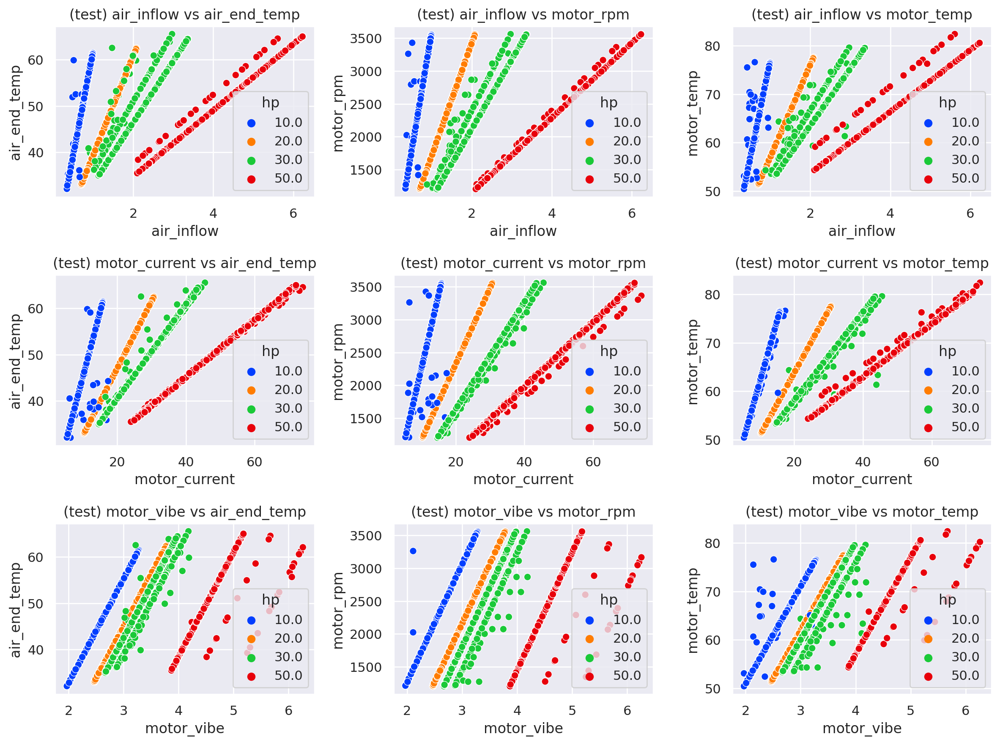

In [ ]:
i = 1
plt.figure(figsize=(12,9))
for col1 in style1 :
    for col2 in style2 :
        plt.subplot(3,3,i)
        sns.scatterplot(x=col1, y=col2, data=test, hue = 'hp', palette = palette)
        plt.title(f'(test) {col1} vs {col2}')
        i += 1
plt.tight_layout()

hp == 30에서 주된 선형관계가 두가지 보인다.<br>
hp == 30인 애들을 type 별로 나눠서 확인해보자

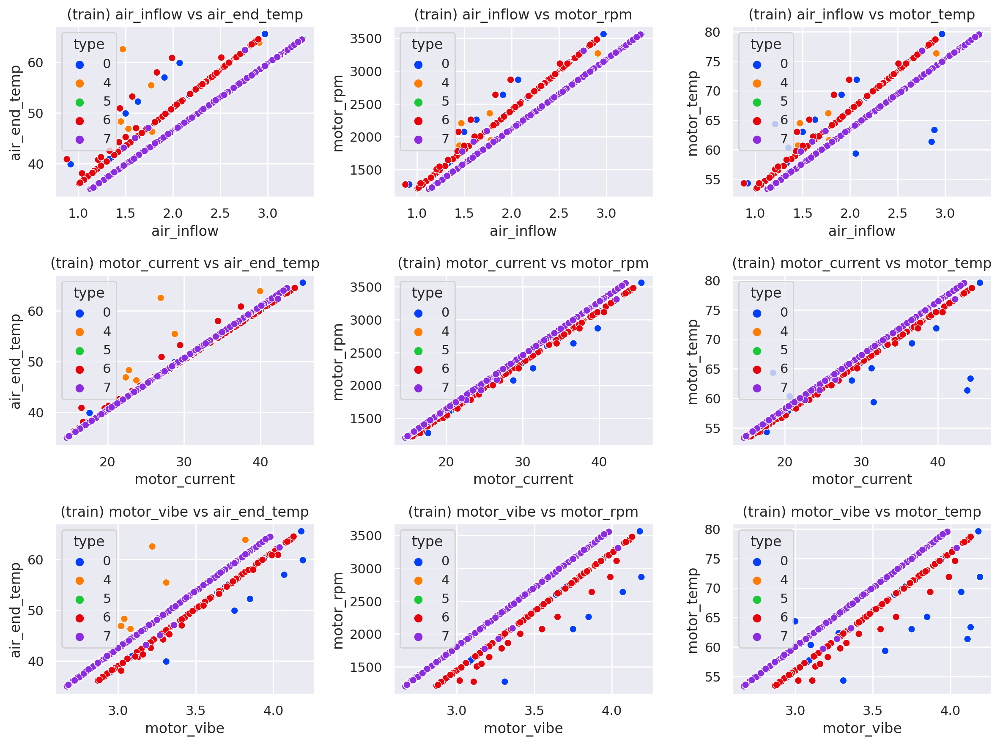

In [ ]:
df = test.loc[test['hp']==30]
i = 1
plt.figure(figsize=(12,9))
for col1 in style1 :
    for col2 in style2 :
        plt.subplot(3,3,i)
        sns.scatterplot(x=col1, y=col2, data=df, hue = 'type', palette = palette)
        plt.title(f'(train) {col1} vs {col2}')
        i += 1
plt.tight_layout()

구분이 잘 안되니 구분 잘되는 6,7을 제외하고 하나의 표만 크게 보자

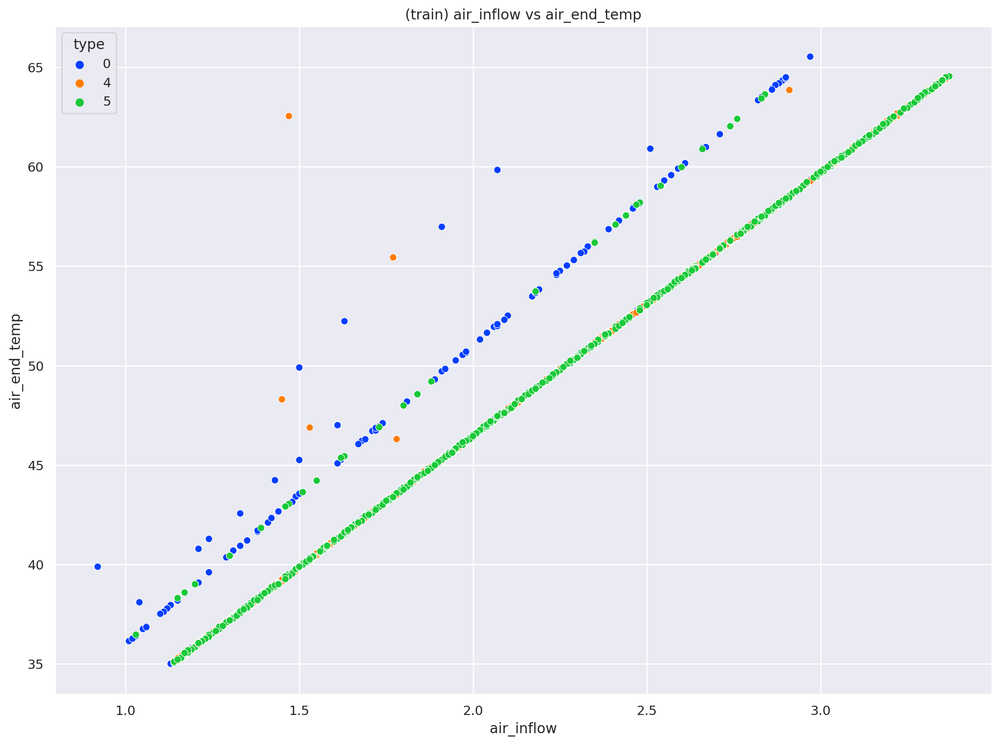

In [ ]:
col1,col2 = 'air_inflow', 'air_end_temp'
df_tmp = df.loc[(df['type'] != 6)&(df['type'] != 7)]
plt.figure(figsize=(12,9))
sns.scatterplot(x=col1, y=col2, data=df_tmp, hue = 'type', palette = palette)
plt.title(f'(train) {col1} vs {col2}')
plt.tight_layout()

hp = 30에서도 두그룹 (0,6), (4,5,7)로 나뉜다.
새롭게 그룹핑한 feature를 넣어보자,

In [ ]:
# 아래 컬럼들만 사용해서 다시 한번 분포를 살펴보자
col = ['air_inflow','air_end_temp','out_pressure','type']
tmp_train = train[col]
tmp_test = test[col]

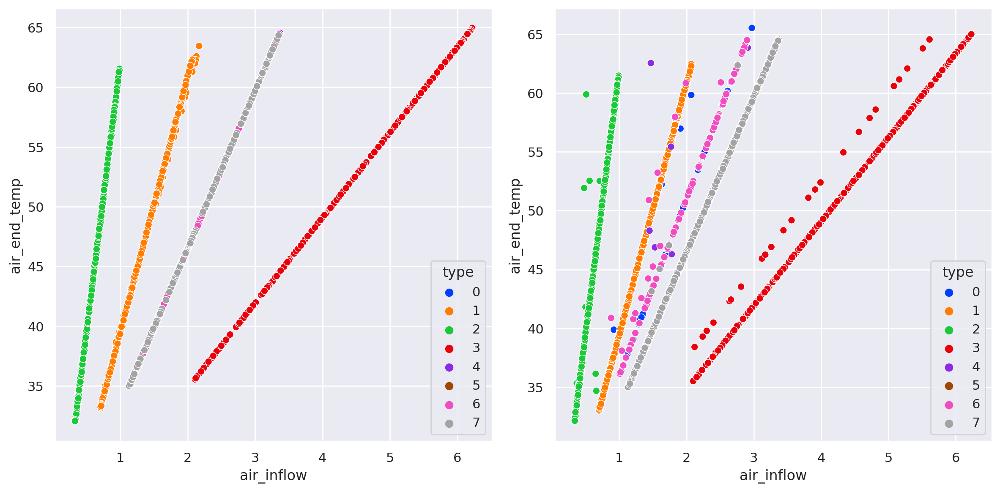

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=tmp_train, hue = 'type', palette = palette)
plt.subplot(1,2,2)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=tmp_test, hue = 'type', palette = palette)
plt.tight_layout()

type==6의 경우에 train과 test의 분포가 확 다르다.<br>
type==6만 살펴보자

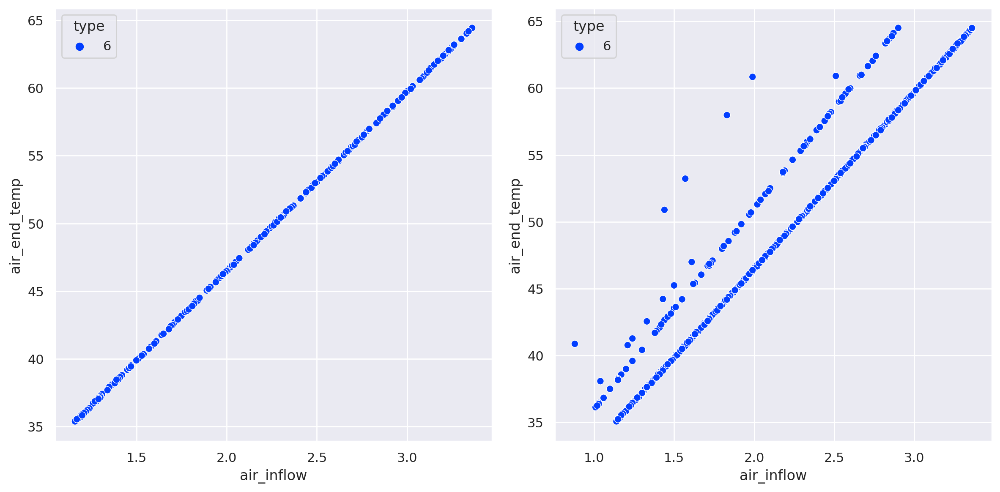

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=tmp_train.loc[tmp_train['type']==6], hue = 'type', palette = palette)
plt.subplot(1,2,2)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=tmp_test.loc[tmp_test['type']==6], hue = 'type', palette = palette)
plt.tight_layout()

train에 비해서 일부의 지점들이 이동하였다. 이를 고장이라고 본다면,<br>
type을 위에서 처럼 5가지로 줄여서 구분할 수 있겠다.

In [ ]:
type_map = {0:0,1:1,2:2,3:3,4:4,5:4,6:0,7:4}

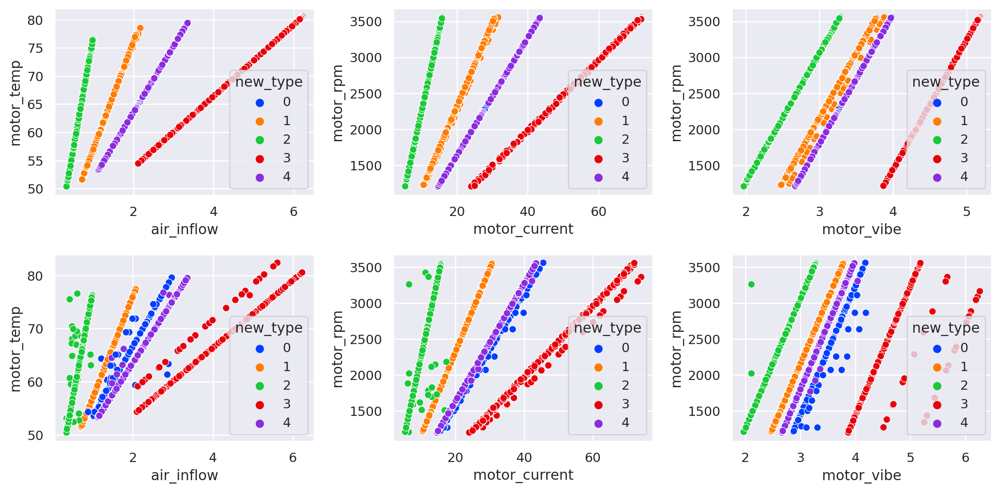

In [ ]:
df1 = train.loc[train['motor_vibe']<20]
df2 = test.copy()
df1['new_type'] = df1['type'].map(type_map)
df2['new_type'] = df2['type'].map(type_map)
plt.figure(figsize = (12,6))
plt.subplot(2,3,1)
sns.scatterplot(x='air_inflow', y = 'motor_temp', data=df1, hue='new_type', palette=palette)
plt.subplot(2,3,2)
sns.scatterplot(x='motor_current', y = 'motor_rpm', data=df1, hue='new_type', palette=palette)
plt.subplot(2,3,3)
sns.scatterplot(x='motor_vibe', y = 'motor_rpm', data=df1, hue='new_type', palette=palette)
plt.subplot(2,3,4)
sns.scatterplot(x='air_inflow', y = 'motor_temp', data=df2, hue='new_type', palette=palette)
plt.subplot(2,3,5)
sns.scatterplot(x='motor_current', y = 'motor_rpm', data=df2, hue='new_type', palette=palette)
plt.subplot(2,3,6)
sns.scatterplot(x='motor_vibe', y = 'motor_rpm', data=df2, hue='new_type', palette=palette)
plt.tight_layout()

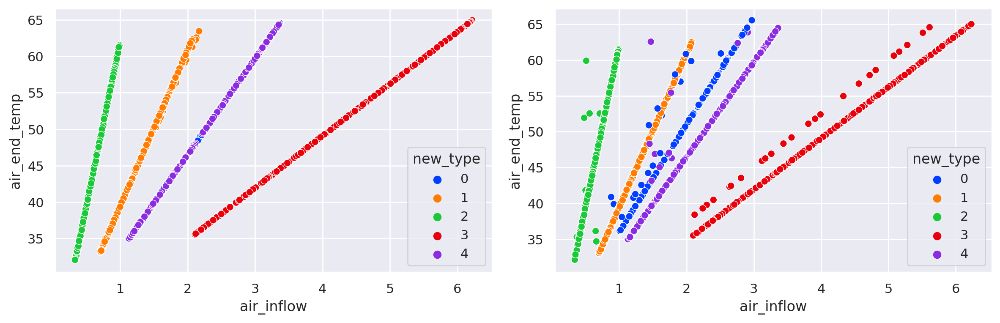

In [ ]:
plt.figure(figsize = (12,4))
plt.subplot(1,2,1)
sns.scatterplot(x='air_inflow', y = 'air_end_temp', data=df1, hue='new_type', palette=palette)
plt.subplot(1,2,2)
sns.scatterplot(x='air_inflow', y = 'air_end_temp', data=df2, hue='new_type', palette=palette)
plt.tight_layout()

# Feature Engineering & EDA

## feature selection
feature로 이용할 column은 다음과 같다
- air_inflow: style1 column 중 data가 고르게 분포한 column 중 하나
- air_end_temp: style2 column 중 data가 고르게 분포한 column 중 하나
- out_pressure: 0.7이 아니면 이상치로 판단할 것이기에 feature에서는 제외한다.
- new_type: 7가지 type을 5가지로 그룹화

In [ ]:
col = ['air_inflow','air_end_temp','out_pressure','type']
x_train = train[col]
x_test = test[col]
x_data = data[col]

In [ ]:
x_train['new_type'] = x_train['type'].map(type_map)
x_test['new_type'] = x_test['type'].map(type_map)
x_data['new_type'] = x_data['type'].map(type_map)

In [ ]:
x_train.shape, x_test.shape, x_data.shape

((2447, 5), (7389, 5), (9852, 5))

In [ ]:
x_data['new_type'].nunique()

5

feature가 줄어들었기에 시각화가 쉬워졌다.<br>
전체 data를 시각화하여 이상치가 발생한 곳을 확인해보자.

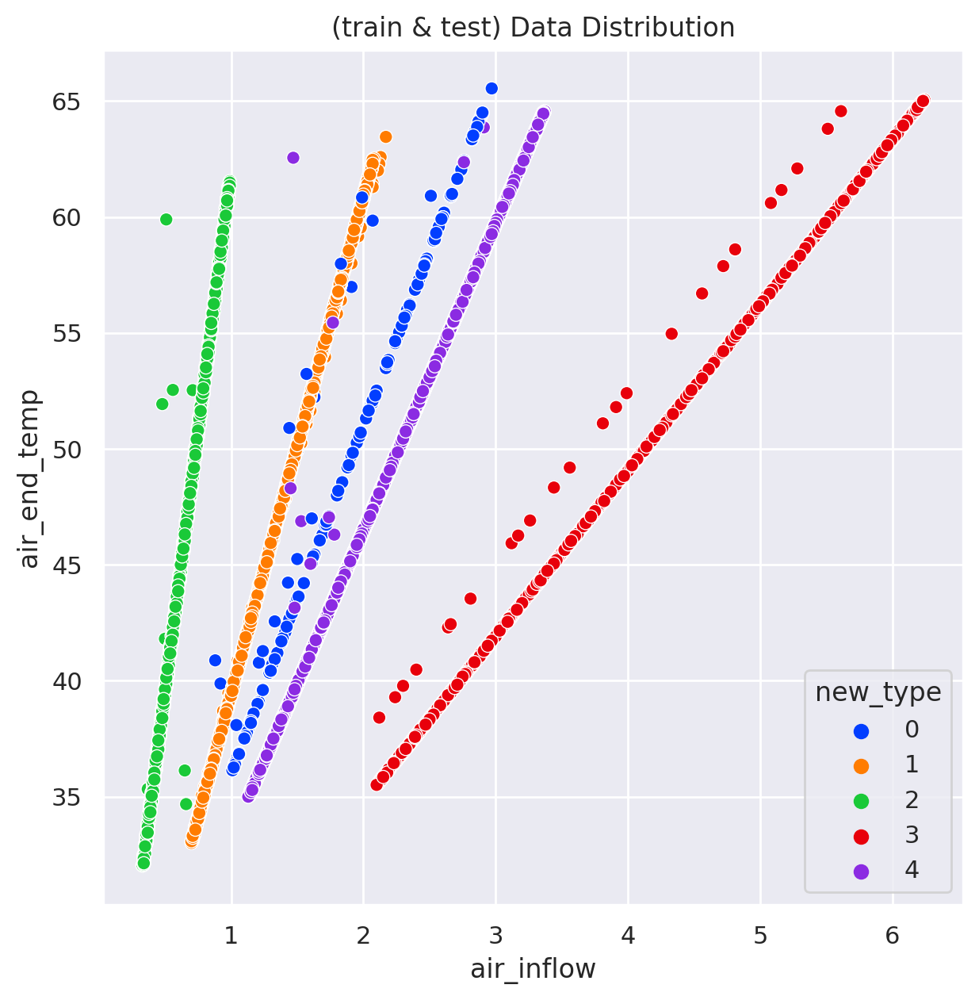

In [ ]:
# 전체 데이터 시각화
plt.figure(figsize=(7,7))
sns.scatterplot(x='air_inflow', y='air_end_temp', data=x_data, hue = 'new_type', palette = palette)
plt.title('(train & test) Data Distribution')
plt.show();

x='air_inflow', y='air_end_temp' 그래프에서 대부분 hp에 따른 각각의 주된 선형관계가 있으나<br>
눈에 띄게 선형관계에서 벗어난 지점들이 보인다.<br>
out_pressure != 0.7인 데이터포인트들도 예상과 달리 해당 type의 주된 선형관계에 포함되어 있다.<br>따라서 해당 column은 feature에서 제외하겠다.

In [ ]:
drop_cols = ['type', 'out_pressure']
x_train = x_train.drop(drop_cols,axis=1)
x_test = x_test.drop(drop_cols,axis=1)
x_data = x_data.drop(drop_cols,axis=1)

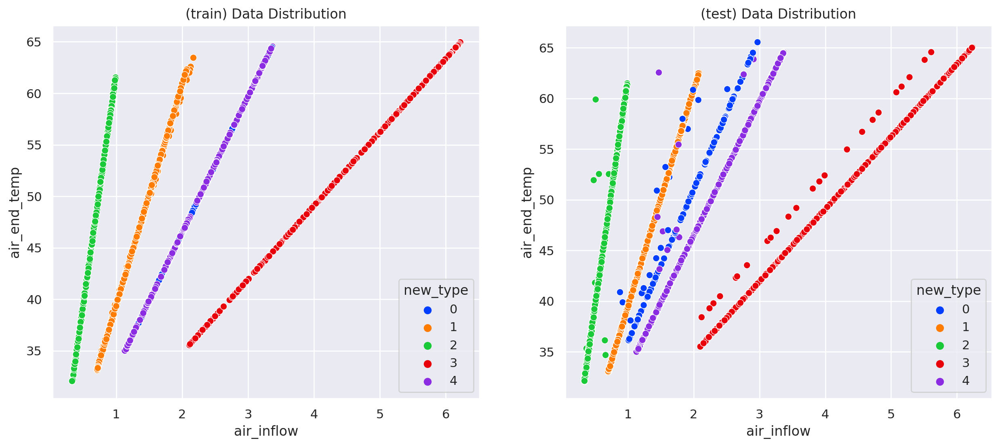

In [ ]:
# train, test set 시각화
plt.figure(figsize=(15,6))
plt.subplot(121)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=x_train, hue = 'new_type', palette = palette)
plt.title('(train) Data Distribution')
plt.subplot(122)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=x_test, hue = 'new_type', palette = palette)
plt.title('(test) Data Distribution')
plt.show();

train에선 new_type이 0인 애들이 4랑 같은 맥락이다가 test에서는 새로운 주선형관계를 보인다.(전부 옮겨진 것이 아니라 일부만 옮겨진 것이다.)

새롭게 정의한 feature간의 상관관계를 살펴보자.

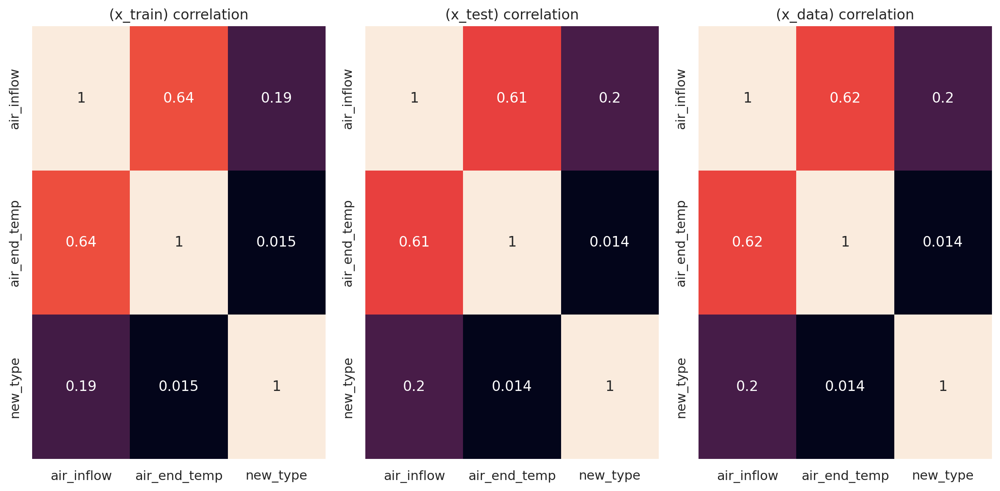

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,3,1)
sns.heatmap(x_train.corr(), annot=True, cbar=False)
plt.title(f'(x_train) correlation')
plt.subplot(1,3,2)
sns.heatmap(x_test.corr(), annot=True, cbar=False)
plt.title(f'(x_test) correlation')
plt.subplot(1,3,3)
sns.heatmap(x_data.corr(), annot=True, cbar=False)
plt.title(f'(x_data) correlation')
plt.tight_layout()

new_type 별로 나누어 확인해보자

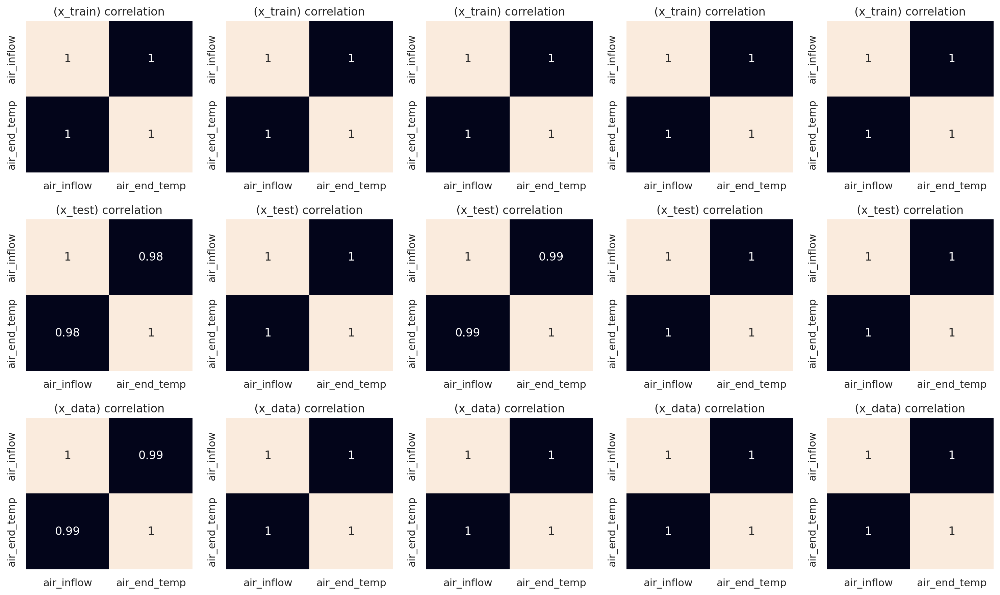

In [ ]:
plt.figure(figsize=(15,9))
for i in range(5):
    plt.subplot(3,5,i+1)
    sns.heatmap(x_train.loc[x_train['new_type']==i,['air_inflow','air_end_temp']].corr(), annot=True, cbar=False)
    plt.title(f'(x_train) correlation')
    plt.subplot(3,5,i+6)
    sns.heatmap(x_test.loc[x_test['new_type']==i,['air_inflow','air_end_temp']].corr(), annot=True, cbar=False)
    plt.title(f'(x_test) correlation')
    plt.subplot(3,5,i+11)
    sns.heatmap(x_data.loc[x_data['new_type']==i,['air_inflow','air_end_temp']].corr(), annot=True, cbar=False)
    plt.title(f'(x_data) correlation')
plt.tight_layout()

모든 경우에서 같은 new_type일때 air_inflow와 air_end_temp는 거의 완벽히 종속되어 있다.(약간의 차이가 이상치인 것으로 추정)<br>
두개의 선형관계인 feature를 통해 새로운 feature를 만들어보자.<br>
모든 데이터가 정상인 train set에서 x축과 y축의 선형관계를 나타내는 방정식을 구해보자.

In [ ]:
x_train_0 = x_train.loc[x_train['new_type']==0]
x_train_1 = x_train.loc[x_train['new_type']==1]
x_train_2 = x_train.loc[x_train['new_type']==2]
x_train_3 = x_train.loc[x_train['new_type']==3]
x_train_4 = x_train.loc[x_train['new_type']==4]

x_test_0 = x_test.loc[x_test['new_type']==0]
x_test_1 = x_test.loc[x_test['new_type']==1]
x_test_2 = x_test.loc[x_test['new_type']==2]
x_test_3 = x_test.loc[x_test['new_type']==3]
x_test_4 = x_test.loc[x_test['new_type']==4]

In [ ]:
datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4]
df_linear = pd.DataFrame(columns=['new_type','coef','intercept'])
nt,coefs,incpts=[],[],[]
for i,df in enumerate(datas):
    coef, intercept = np.polyfit(df['air_inflow'], df['air_end_temp'], 1)
    df['linear'] = df['air_end_temp'] - coef*df['air_inflow'] - intercept
    print(f'x_train_{i}의 선형관계: y = {coef}x + {intercept}')
    nt.append(i)
    coefs.append(coef)
    incpts.append(intercept)
df_linear['new_type'] = nt
df_linear['coef'] = coefs
df_linear['intercept'] = incpts
df_linear.head()

x_train_0의 선형관계: y = 13.233119248102218x + 20.00578335310425
x_train_1의 선형관계: y = 21.239654863000947x + 18.22124764646483
x_train_2의 선형관계: y = 45.072493839690196x + 16.952347292707586
x_train_3의 선형관계: y = 7.142935204608351x + 20.50105318502551
x_train_4의 선형관계: y = 13.231713386568524x + 20.006650198228257


,new_type,coef,intercept
0,0,13.233119,20.005783
1,1,21.239655,18.221248
2,2,45.072494,16.952347
3,3,7.142935,20.501053
4,4,13.231713,20.006650


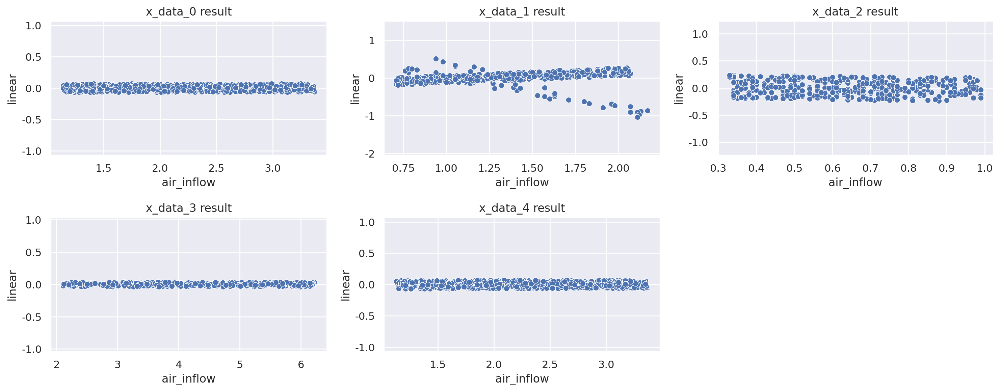

In [ ]:
datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4]
plt.figure(figsize=(15,6))
for i,df in enumerate(datas):
    plt.subplot(2,3,i+1)
    sns.scatterplot(y='linear', x='air_inflow', data=df)
    plt.title(f'x_data_{i} result')
    plt.ylim(df['linear'].min()-1,df['linear'].max()+1)
plt.tight_layout()

위의 new_type별 scatterplot과 비슷하게 new_type이 1일때만 조금의 차이만 있고 나머지는 일정한 값 근처에 분포해있다.<br>
이상치의 threshold값을 구하기 쉽게 각각의 min,max값을 확인해두자.

In [ ]:
datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4]
nt,min_,max_=[],[],[]
for i,df in enumerate(datas):
    linear = df['linear']
    print(f'x_train_{i}의 linear 최대최소: {linear.max()}, {linear.min()}')
    nt.append(i)
    min_.append(linear.min())
    max_.append(linear.max())
df_linear['min'] = min_
df_linear['max'] = max_
df_linear

x_train_0의 linear 최대최소: 0.0671900950701172, -0.06914387789042209
x_train_1의 linear 최대최소: 0.5034767823142801, -1.0369194073968266
x_train_2의 linear 최대최소: 0.23372974019465076, -0.23614187163495615
x_train_3의 linear 최대최소: 0.035847680688601, -0.037235060629530636
x_train_4의 linear 최대최소: 0.07211244526028082, -0.06860906530459943


,new_type,coef,intercept,min,max
0,0,13.233119,20.005783,-0.069144,0.067190
1,1,21.239655,18.221248,-1.036919,0.503477
2,2,45.072494,16.952347,-0.236142,0.233730
3,3,7.142935,20.501053,-0.037235,0.035848
4,4,13.231713,20.006650,-0.068609,0.072112


새로 만든 feature와 기존 feature와의 상관관계를 확인해보자

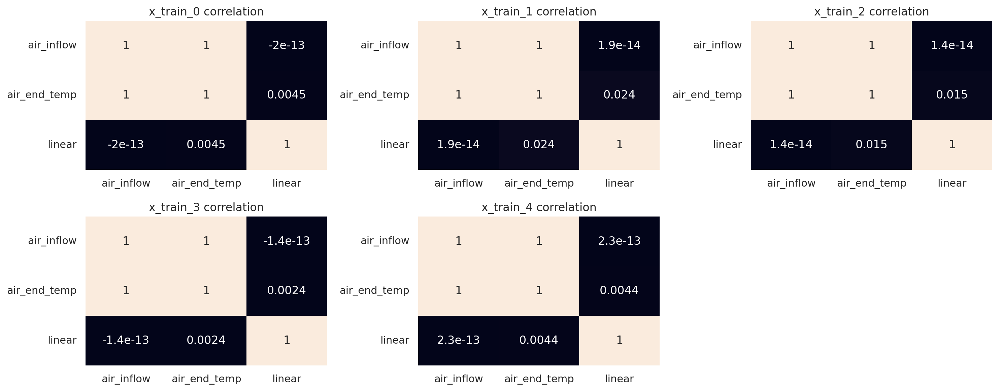

In [ ]:
datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4]
plt.figure(figsize=(15,6))
for i,df in enumerate(datas):
    plt.subplot(2,3,i+1)
    sns.heatmap(df[['air_inflow','air_end_temp','linear']].corr(), annot=True, cbar=False)
    plt.title(f'x_train_{i} correlation')
plt.tight_layout();

기존의 feature들과 상관관계가 작은 새로운 feature를 만들어냈다!! 특히 air_inflow와는 완전히 독립적이다.

test set에도 train set의 선형관계식을 적용하여 값을 구해보자

In [ ]:
datas = [x_test_0,x_test_1,x_test_2,x_test_3,x_test_4]
for i,df in enumerate(datas):
    coef,intercept = df_linear.loc[i,'coef'], df_linear.loc[i,'intercept']
    df['linear'] = df['air_end_temp']-coef*df['air_inflow'] - intercept

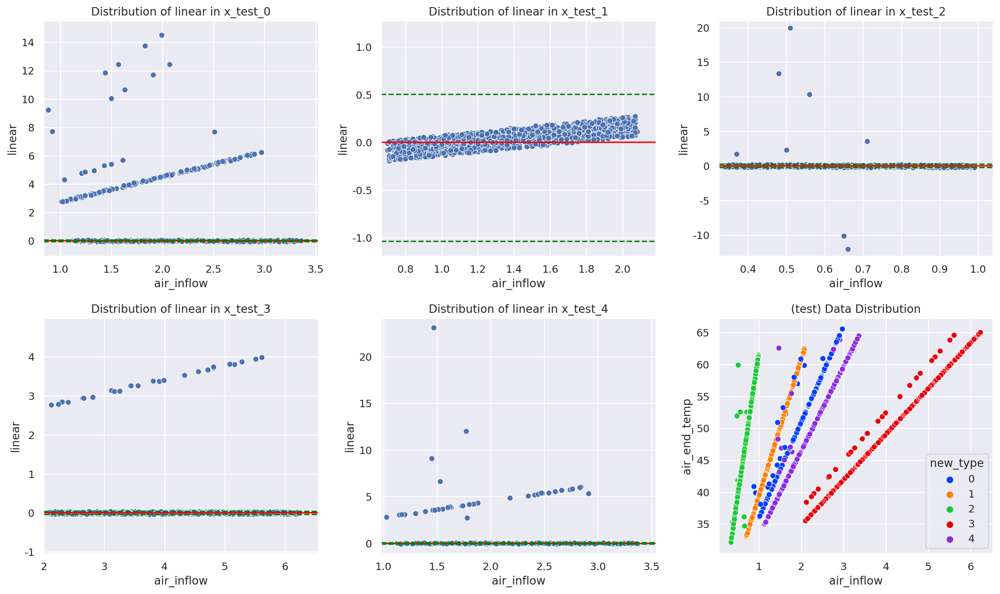

In [ ]:
datas = [x_test_0,x_test_1,x_test_2,x_test_3,x_test_4]
plt.figure(figsize=(15,9))
for i,df in enumerate(datas):
    xmin,xmax = df['air_inflow'].min()*0.95, df['air_inflow'].max()*1.05
    plt.subplot(2,3,i+1)
    sns.scatterplot(x='air_inflow', y='linear', data=df)
    plt.title(f'Distribution of linear in x_test_{i}')
    plt.xlim(xmin,xmax)
    plt.ylim(df['linear'].min()-1,df['linear'].max()+1)
    plt.hlines(xmin=xmin,xmax=xmax,y=0,color='red')
    plt.hlines(xmin=xmin,xmax=xmax,y=df_linear.loc[i,'max'],color='green', linestyle='--')
    plt.hlines(xmin=xmin,xmax=xmax,y=df_linear.loc[i,'min'],color='green', linestyle='--')
plt.subplot(236)
sns.scatterplot(x='air_inflow', y='air_end_temp', data=x_test, hue = 'new_type', palette = palette)
plt.title('(test) Data Distribution')
plt.tight_layout()

In [ ]:
x_train_0.head()

,air_inflow,air_end_temp,new_type,linear
0,1.59,41.00,0,-0.046443
1,2.97,59.28,0,-0.028148
2,1.91,45.29,0,0.008959
3,2.37,51.33,0,-0.038276
4,1.90,45.21,0,0.061290


In [ ]:
x_test_0.head()

,air_inflow,air_end_temp,new_type,linear
0,2.51,53.28,0,0.059087
1,2.66,55.24,0,0.034119
2,1.72,42.74,0,-0.026748
3,2.20,49.15,0,0.031354
4,2.06,47.28,0,0.013991


좀 더 독립적인 새로운 feature를 만들었고, 이들 중 air_inflow와 linear만을 가지고 이상탐지를 진행해보자

In [ ]:
use_col = ['air_inflow','linear']
f_x_train_0 = x_train_0[use_col]
f_x_train_1 = x_train_1[use_col]
f_x_train_2 = x_train_2[use_col]
f_x_train_3 = x_train_3[use_col]
f_x_train_4 = x_train_4[use_col]

f_x_test_0 = x_test_0[use_col]
f_x_test_1 = x_test_1[use_col]
f_x_test_2 = x_test_2[use_col]
f_x_test_3 = x_test_3[use_col]
f_x_test_4 = x_test_4[use_col]

In [ ]:
f_x_train_0.head()

,air_inflow,linear
0,1.59,-0.046443
1,2.97,-0.028148
2,1.91,0.008959
3,2.37,-0.038276
4,1.90,0.061290


In [ ]:
train.columns

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe', 'type', 'hp'],
      dtype='object')

## feature selection 2
1. type 별로 train, test 나누기
2. column은 ['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm', 'motor_temp', 'motor_vibe', 'out_pressure', 'type'] 사용<br>
motor_vibe column을 기준으로 train set의 'out_pressure', 'type'을 제외한 column을 linear로 만들기<br>
* motor_vibe가 6개의 column 중 그나마 가장 독립적인 column이여서 motor_vibe가 기준
3. linear column 끼리 correlation 비교
4. 총 8개의 type set 별로 총 5개의 모델(motor_vibe vs linear) 생성
5. 각 모델 별로 type별 전체 data 학습 후 test set type별로 시각화하며 모델 최적화
6. 최적화된 모델로 이상치 예측값을 앙상블(5개 중 하나라도 이상치면 이상치)
7. out_pressure이 0.7이 아닌 값 이상치로 변경
8. 최종 결과 확인

### 1.type 별로 train, test 나누기

In [ ]:
train.columns

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe', 'type', 'hp'],
      dtype='object')

In [ ]:
data.columns

Index(['air_inflow', 'air_end_temp', 'out_pressure', 'motor_current',
       'motor_rpm', 'motor_temp', 'motor_vibe', 'type', 'hp'],
      dtype='object')

In [ ]:
# train set motor_vibe 이상치 제거
train = train.loc[train['motor_vibe']<10]

In [ ]:
col = ['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm', 'motor_temp', 'motor_vibe', 'type', 'out_pressure']
x_train = train[col]
x_test = test[col]
x_data = data[col]

In [ ]:
x_train_0 = x_train.loc[x_train['type']==0]
x_train_1 = x_train.loc[x_train['type']==1]
x_train_2 = x_train.loc[x_train['type']==2]
x_train_3 = x_train.loc[x_train['type']==3]
x_train_4 = x_train.loc[x_train['type']==4]
x_train_5 = x_train.loc[x_train['type']==5]
x_train_6 = x_train.loc[x_train['type']==6]
x_train_7 = x_train.loc[x_train['type']==7]

In [ ]:
x_test_0 = x_test.loc[x_test['type']==0]
x_test_1 = x_test.loc[x_test['type']==1]
x_test_2 = x_test.loc[x_test['type']==2]
x_test_3 = x_test.loc[x_test['type']==3]
x_test_4 = x_test.loc[x_test['type']==4]
x_test_5 = x_test.loc[x_test['type']==5]
x_test_6 = x_test.loc[x_test['type']==6]
x_test_7 = x_test.loc[x_test['type']==7]

In [ ]:
use_cols = ['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm', 'motor_temp', 'motor_vibe']
lin_cols = ['lin_air_inflow','lin_air_end_temp', 'lin_motor_current', 'lin_motor_rpm','lin_motor_temp', 'lin_motor_vibe']
tr_datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4,x_train_5,x_train_6,x_train_7]
ts_datas = [x_test_0,x_test_1,x_test_2,x_test_3,x_test_4,x_test_5,x_test_6,x_test_7]

In [ ]:
x_train_0.head()

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure
0,1.59,41.00,20.53,1680.0,58.67,2.93,0,0.7
1,2.97,59.28,38.40,3142.0,74.91,3.75,0,0.7
2,1.91,45.29,24.73,2023.0,62.48,3.12,0,0.7
3,2.37,51.33,30.63,2506.0,67.84,3.39,0,0.7
4,1.90,45.21,24.65,2017.0,62.41,3.12,0,0.7


In [ ]:
# # minmax scailing
# def mm_scail(data):
#     global use_cols
#     for col in use_cols:
#         max_,min_ = data[col].max(), data[col].min()
#         data[col] = (data[col] - min_) / (max_ - min_)

In [ ]:
# for tr, ts in zip(tr_datas,ts_datas):
#     mm_scail(tr)
#     mm_scail(ts)

### 2-1. 각 type train set별 linear 함수 생성

In [ ]:
tr_datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4,x_train_5,x_train_6,x_train_7]
use_cols = ['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm', 'motor_temp', 'motor_vibe']
df_linear = pd.DataFrame(columns=['type','coef','intercept'])
nt,cols,coefs,incpts=[],[],[],[]
print('air_inflow 기준')
for i,df in enumerate(tr_datas):
    print('-'*70)
    print(f'type=={i}일 때','-'*50)
    for col in use_cols :
        coef, intercept = np.polyfit(df['motor_rpm'], df[col], 1)
        df[f'lin_{col}'] = df[col] - coef*df['motor_rpm'] - intercept
        print(f'{col:>13}의 선형관계: y = {coef}x + {intercept}')
        nt.append(i)
        cols.append(col)
        coefs.append(coef)
        incpts.append(intercept)
df_linear['type'] = nt
df_linear['column'] = cols
df_linear['coef'] = coefs
df_linear['intercept'] = incpts

air_inflow 기준
----------------------------------------------------------------------
type==0일 때 --------------------------------------------------
   air_inflow의 선형관계: y = 0.0009446096277296185x + -0.00036561756566186153
 air_end_temp의 선형관계: y = 0.012499676426745255x + 20.00187771331835
motor_current의 선형관계: y = 0.012222307028696639x + 3.115375762273173e-05
    motor_rpm의 선형관계: y = 1.0000000000000002x + 1.94237896860665e-13
   motor_temp의 선형관계: y = 0.011111079973069676x + 40.000147458673545
   motor_vibe의 선형관계: y = 0.0005555160840535337x + 2.0000043261950844
----------------------------------------------------------------------
type==1일 때 --------------------------------------------------
   air_inflow의 선형관계: y = 0.0005869598658696588x + -0.0025862652354656755
 air_end_temp의 선형관계: y = 0.012503894793006712x + 18.08301668967026
motor_current의 선형관계: y = 0.008644995471699621x + -0.019775407039725135
    motor_rpm의 선형관계: y = 1.0000000000000002x + 3.259420334872533e-13
   motor_temp의 선형관계: y 

In [ ]:
x_train_0.head()

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe
0,1.59,41.00,20.53,1680.0,58.67,2.93,0,0.7,0.003421,-0.001334,-0.003507,-6.489852e-13,0.003238,-0.003271
1,2.97,59.28,38.40,3142.0,74.91,3.75,0,0.7,0.002402,0.004139,-0.002520,-1.103733e-12,-0.001161,0.004564
2,1.91,45.29,24.73,2023.0,62.48,3.12,0,0.7,-0.000580,0.001277,0.004242,-6.489852e-13,0.002138,-0.003813
3,2.37,51.33,30.63,2506.0,67.84,3.39,0,0.7,0.003174,0.003933,0.000867,-6.489852e-13,-0.004514,-0.002128
4,1.90,45.21,24.65,2017.0,62.41,3.12,0,0.7,-0.004912,-0.003725,-0.002424,-6.489852e-13,-0.001196,-0.000480


In [ ]:
min_,max_ = [],[]
for i,df in enumerate(tr_datas):
    print(f'type=={i}일때')
    for col in use_cols :
        linear = df[f'lin_{col}']
        print(f'lin_{col:}의 linear 최대최소: {linear.max()}, {linear.min()}')
        min_.append(linear.min())
        max_.append(linear.max())
    print('-'*100)
df_linear['min'] = min_
df_linear['max'] = max_

type==0일때
lin_air_inflow의 linear 최대최소: 0.0049939551740203186, -0.005149865495629487
lin_air_end_temp의 linear 최대최소: 0.004268383149955923, -0.003976158909214433
lin_motor_current의 linear 최대최소: 0.004299734817577744, -0.0047764915733001624
lin_motor_rpm의 linear 최대최소: -4.2161157230389704e-13, -1.1037325986335932e-12
lin_motor_temp의 linear 최대최소: 0.004407837198407094, -0.004554226087854829
lin_motor_vibe의 linear 최대최소: 0.0051338635334943206, -0.004395168339783151
----------------------------------------------------------------------------------------------------
type==1일때
lin_air_inflow의 linear 최대최소: 0.09053120959470695, -0.014794793758551864
lin_air_end_temp의 linear 최대최소: 0.9170213440391883, -0.09932373087904978
lin_motor_current의 linear 최대최소: 0.8881715096758724, -0.10434859900333615
lin_motor_rpm의 linear 최대최소: -5.533157089304853e-13, -1.2354367352601815e-12
lin_motor_temp의 linear 최대최소: 0.9184641308586947, -0.09998901099954338
lin_motor_vibe의 linear 최대최소: 0.0961223926542285, -0.01443283761075

In [ ]:
df_linear.head()

,type,coef,intercept,column,min,max
0,0,0.000945,-3.656176e-04,air_inflow,-5.149865e-03,4.993955e-03
1,0,0.012500,2.000188e+01,air_end_temp,-3.976159e-03,4.268383e-03
2,0,0.012222,3.115376e-05,motor_current,-4.776492e-03,4.299735e-03
3,0,1.000000,1.942379e-13,motor_rpm,-1.103733e-12,-4.216116e-13
4,0,0.011111,4.000015e+01,motor_temp,-4.554226e-03,4.407837e-03


### 2-2. 각 type test set별 linear 함수값으로 feature 변경

In [ ]:
x_test_0.head(1)

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure
0,2.51,53.28,32.54,2662.0,69.58,3.48,0,0.7


In [ ]:
df_linear.head(6)

,type,coef,intercept,column,min,max
0,0,0.000945,-3.656176e-04,air_inflow,-5.149865e-03,4.993955e-03
1,0,0.012500,2.000188e+01,air_end_temp,-3.976159e-03,4.268383e-03
2,0,0.012222,3.115376e-05,motor_current,-4.776492e-03,4.299735e-03
3,0,1.000000,1.942379e-13,motor_rpm,-1.103733e-12,-4.216116e-13
4,0,0.011111,4.000015e+01,motor_temp,-4.554226e-03,4.407837e-03
5,0,0.000556,2.000004e+00,motor_vibe,-4.395168e-03,5.133864e-03


In [ ]:
for i,df in enumerate(ts_datas):
    for col in use_cols:
        df_tmp = df_linear.loc[df_linear['column']==col]
        coef,intercept = df_tmp.iloc[i,1], df_tmp.iloc[i,2]
        df[f'lin_{col}'] = df[col]-coef*df['motor_rpm'] - intercept

In [ ]:
x_test_0.head(1)

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe
0,2.51,53.28,32.54,2662.0,69.58,3.48,0,0.7,-0.004185,0.003984,0.004188,-6.489852e-13,0.002158,0.001212


### 3.linear column 끼리 correlation 비교

In [ ]:
x_train_0.columns

Index(['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm',
       'motor_temp', 'motor_vibe', 'type', 'out_pressure', 'lin_air_inflow',
       'lin_air_end_temp', 'lin_motor_current', 'lin_motor_rpm',
       'lin_motor_temp', 'lin_motor_vibe'],
      dtype='object')

In [ ]:
use_cols = ['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm', 'motor_temp', 'motor_vibe']
lin_cols = ['lin_air_inflow','lin_air_end_temp', 'lin_motor_current', 'lin_motor_rpm','lin_motor_temp', 'lin_motor_vibe']
tr_datas = [x_train_0,x_train_1,x_train_2,x_train_3,x_train_4,x_train_5,x_train_6,x_train_7]
ts_datas = [x_test_0,x_test_1,x_test_2,x_test_3,x_test_4,x_test_5,x_test_6,x_test_7]

for i in range(8):
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    sns.heatmap(tr_datas[i][lin_cols].corr(), annot=True, cbar=False, fmt = '.3g')
    plt.title(f'(train) type=={i}')
    plt.subplot(1,2,2)
    sns.heatmap(ts_datas[i][lin_cols].corr(), annot=True, cbar=False, fmt = '.3g')
    plt.title(f'(test) type=={i}')
    plt.tight_layout();

Output hidden; open in https://colab.research.google.com to view.

lin_col끼리 상관관계가 높은 것도, 낮은 것도 있어보인다.

In [ ]:
x_data_0 = pd.concat([x_train_0,x_test_0], axis=0)
x_data_1 = pd.concat([x_train_1,x_test_1], axis=0)
x_data_2 = pd.concat([x_train_2,x_test_2], axis=0)
x_data_3 = pd.concat([x_train_3,x_test_3], axis=0)
x_data_4 = pd.concat([x_train_4,x_test_4], axis=0)
x_data_5 = pd.concat([x_train_5,x_test_5], axis=0)
x_data_6 = pd.concat([x_train_6,x_test_6], axis=0)
x_data_7 = pd.concat([x_train_7,x_test_7], axis=0)

### 4.type set 별로 총 6개의 모델(기준 column vs linear) 생성

In [ ]:
df_linear.head()

,type,coef,intercept,column,min,max
0,0,0.000945,-3.656176e-04,air_inflow,-5.149865e-03,4.993955e-03
1,0,0.012500,2.000188e+01,air_end_temp,-3.976159e-03,4.268383e-03
2,0,0.012222,3.115376e-05,motor_current,-4.776492e-03,4.299735e-03
3,0,1.000000,1.942379e-13,motor_rpm,-1.103733e-12,-4.216116e-13
4,0,0.011111,4.000015e+01,motor_temp,-4.554226e-03,4.407837e-03


In [ ]:
x_train_0.head(1)

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe
0,1.59,41.0,20.53,1680.0,58.67,2.93,0,0.7,0.003421,-0.001334,-0.003507,-6.489852e-13,0.003238,-0.003271


In [ ]:
x_test_0.head(1)

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe
0,2.51,53.28,32.54,2662.0,69.58,3.48,0,0.7,-0.004185,0.003984,0.004188,-6.489852e-13,0.002158,0.001212


In [ ]:
x_data_0.head(1)

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe
0,1.59,41.0,20.53,1680.0,58.67,2.93,0,0.7,0.003421,-0.001334,-0.003507,-6.489852e-13,0.003238,-0.003271


In [ ]:
def isabnormal(n_type,col,only_abnormal=True,threshold=None):
    lin_col = f'lin_{col}'
    train = tr_datas[n_type][['motor_rpm',lin_col]]
    test = ts_datas[n_type][['motor_rpm',lin_col]]
    tmp = test.copy()

    # 임계값 설정
    thres_max = df_linear.loc[(df_linear['type']==n_type)&(df_linear['column']==col),'max'].values[0]
    thres_min = df_linear.loc[(df_linear['type']==n_type)&(df_linear['column']==col),'min'].values[0]
    # 예측
    if not threshold :
        pred = tmp[lin_col].apply(lambda x : 1 if (x > thres_max*1.1)|(x < thres_min*1.1) else 0).tolist()
    else :
        pred = tmp[lin_col].apply(lambda x : 1 if abs(x) > threshold else 0).tolist()
    print('전체 데이터 수:', len(pred))
    print('고장 데이터 수: ', pred.count(1))
    print('고장 데이터 비율: ', round(pred.count(1)/len(pred),4))
    tmp['abnorm'] = pred

    # 시각화
    xmin,xmax = tmp['motor_rpm'].min()-0.5, tmp['motor_rpm'].max()+0.5
    if only_abnormal :
        sns.scatterplot(x='motor_rpm', y=lin_col, data=tmp.loc[tmp['abnorm']==1])
    else :
        sns.scatterplot(x='motor_rpm', y=lin_col, data=tmp, hue = 'abnorm')
    plt.title(f'Distribution of abnorm in test set')
    plt.xlim(xmin,xmax)
    plt.ylim(thres_min,thres_max)
    plt.hlines(xmin=xmin,xmax=xmax,y=0,color='red')
    plt.hlines(xmin=xmin,xmax=xmax,y=thres_max+0.2,color='green', linestyle='--')
    plt.hlines(xmin=xmin,xmax=xmax,y=thres_min-0.2,color='green', linestyle='--')
    plt.show();
    return pred

In [ ]:
x_train.columns

Index(['air_inflow', 'air_end_temp', 'motor_current', 'motor_rpm',
       'motor_temp', 'motor_vibe', 'type', 'out_pressure'],
      dtype='object')

#### type == 0

In [ ]:
df_pred_0 = pd.DataFrame()

전체 데이터 수: 1296
고장 데이터 수:  143
고장 데이터 비율:  0.1103


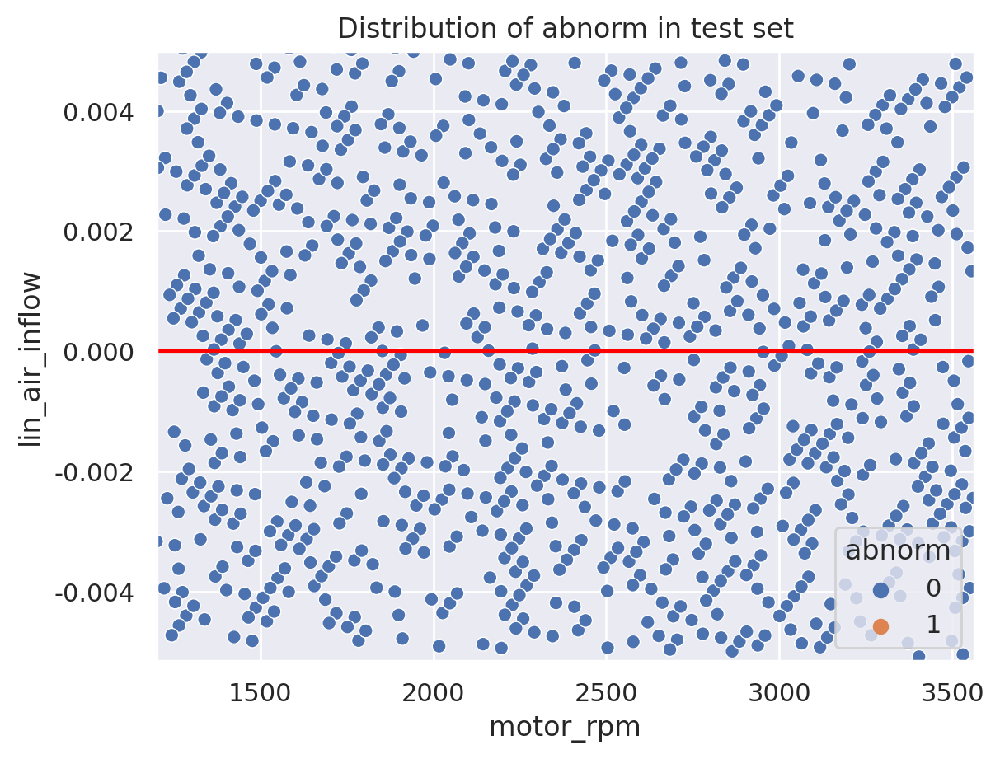

In [ ]:
# air_inflow
n_type = 0
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False)
df_pred_0['air_inflow'] = pred_tmp

전체 데이터 수: 1296
고장 데이터 수:  1296
고장 데이터 비율:  1.0


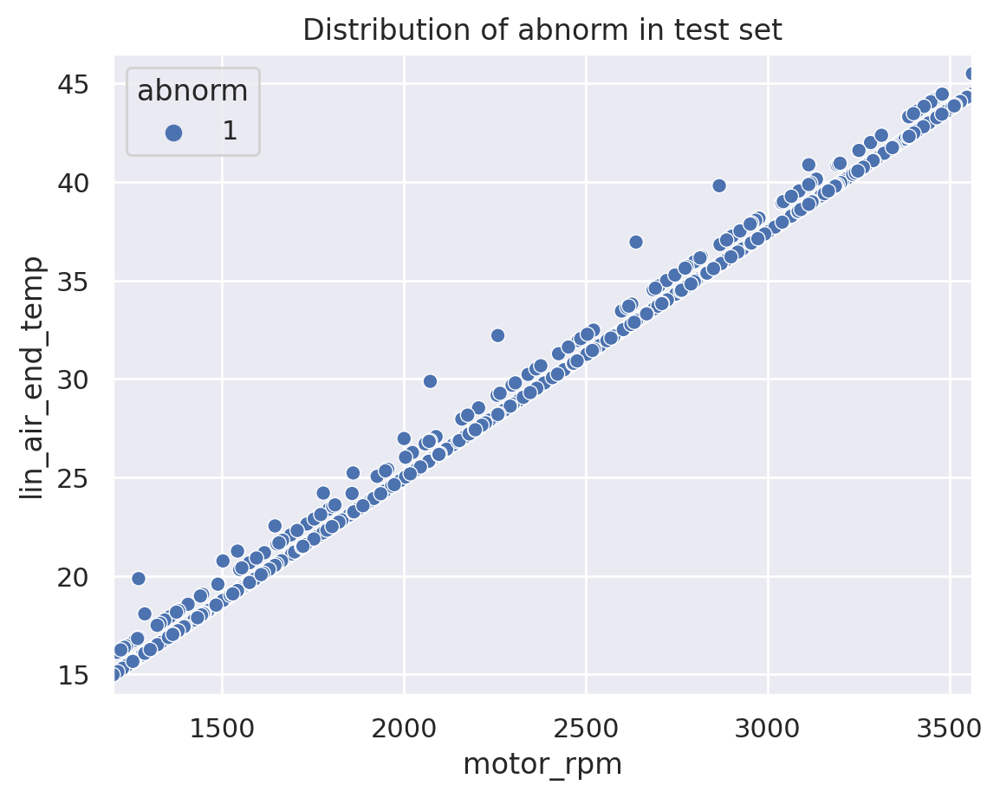

In [ ]:
# air_end_temp
n_type = 0
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=2)
df_pred_0['air_end_temp'] = pred_tmp

전체 데이터 수: 1296
고장 데이터 수:  0
고장 데이터 비율:  0.0


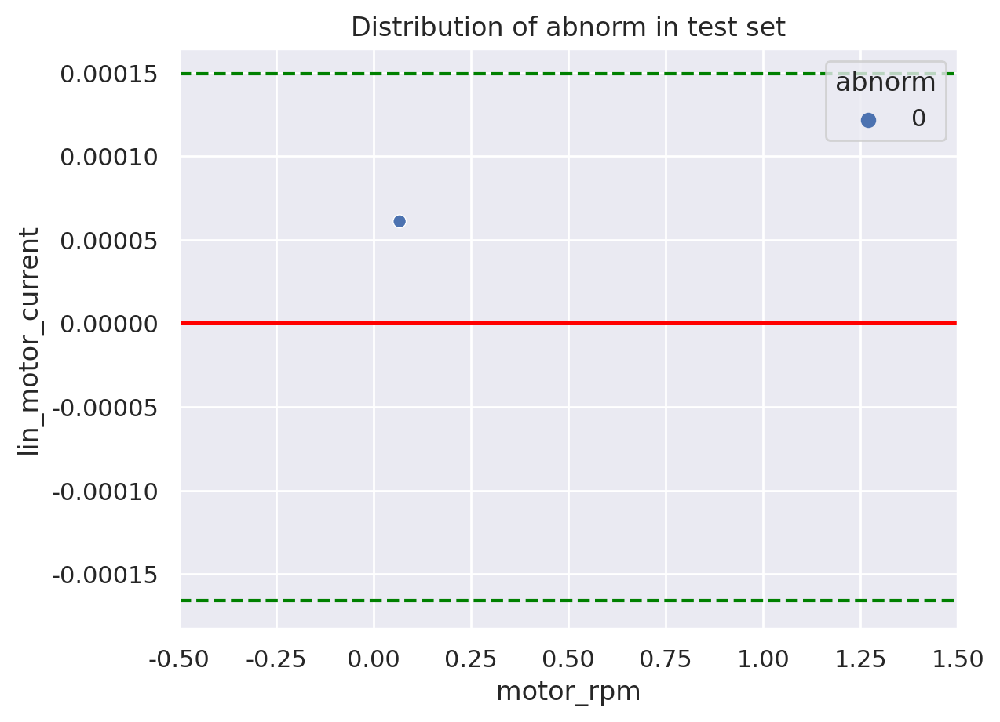

In [ ]:
# motor_current
n_type = 0
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_0['motor_current'] = pred_tmp

전체 데이터 수: 1296
고장 데이터 수:  0
고장 데이터 비율:  0.0


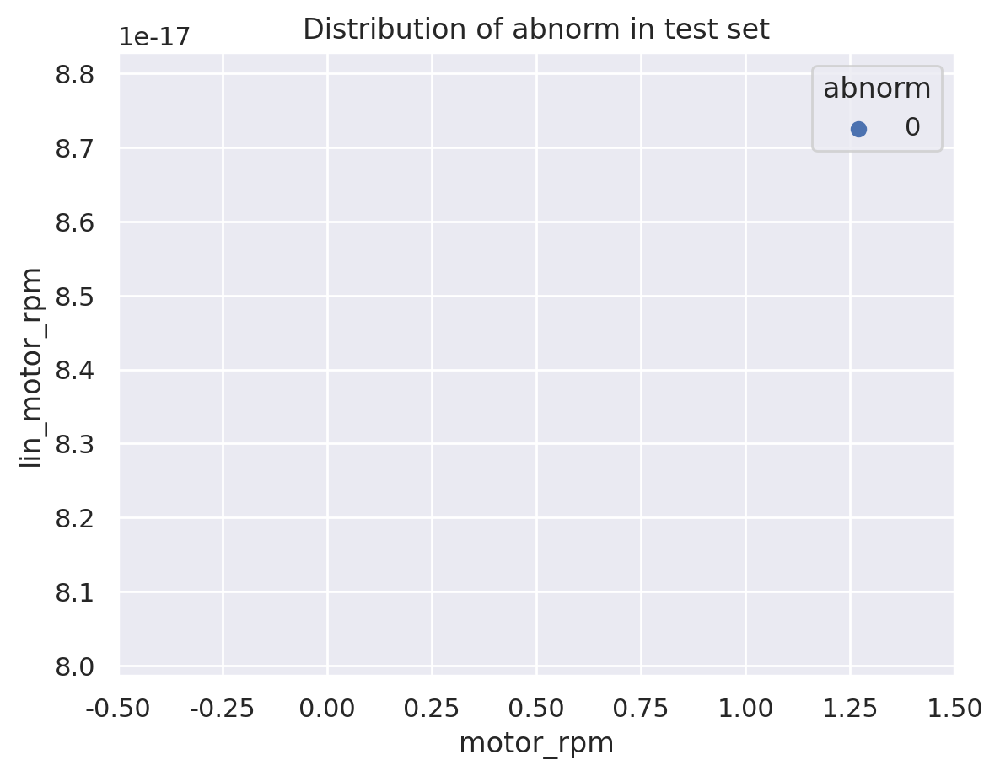

In [ ]:
# motor_rpm
n_type = 0
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=100)
df_pred_0['motor_rpm'] = pred_tmp

전체 데이터 수: 1296
고장 데이터 수:  143
고장 데이터 비율:  0.1103


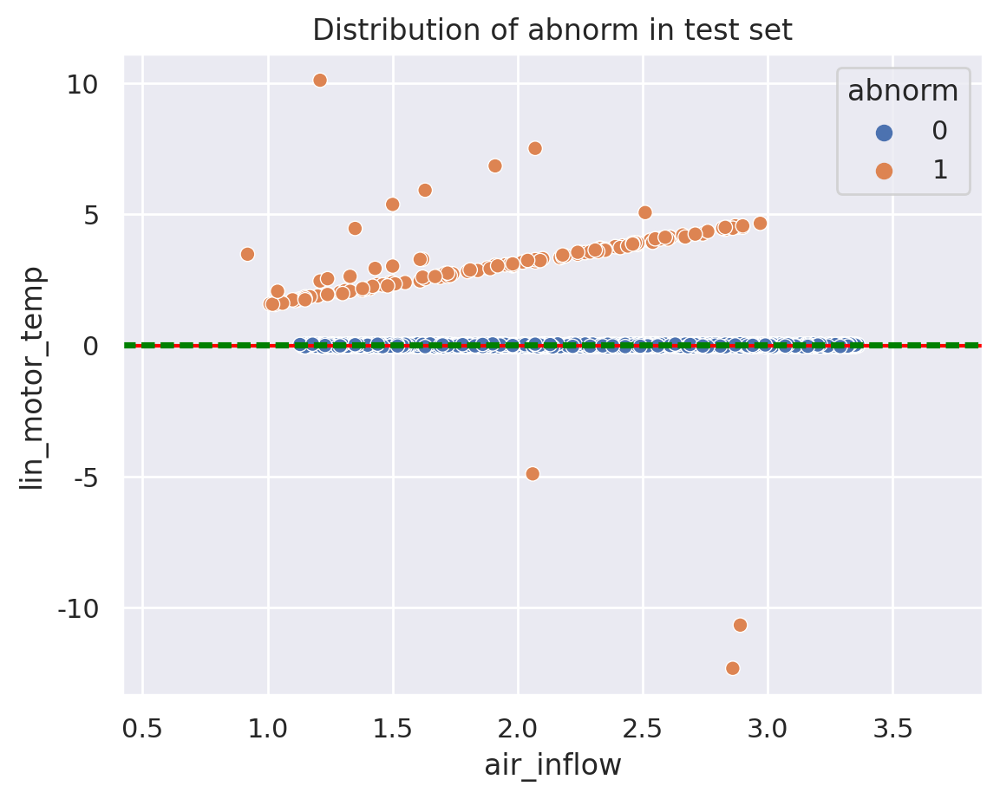

In [ ]:
# motor_temp
n_type = 0
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_0['motor_temp'] = pred_tmp

전체 데이터 수: 1296
고장 데이터 수:  143
고장 데이터 비율:  0.1103


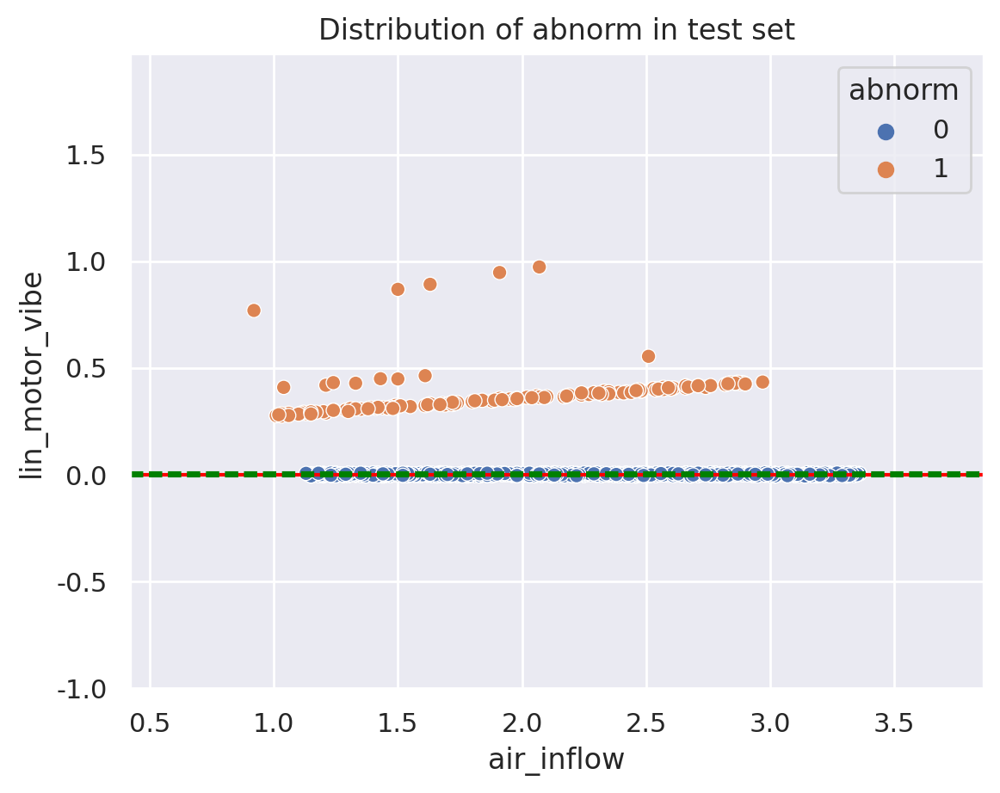

In [ ]:
# motor_vibe
n_type = 0
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_0['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_0['pred'] = df_pred_0.sum(axis=1)
pred_0 = df_pred_0['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_0))
print('고장 데이터 수: ', sum(pred_0))
print('고장 데이터 비율: ', round(sum(pred_0)/len(pred_0),4))

전체 데이터 수: 1296
고장 데이터 수:  143
고장 데이터 비율:  0.1103


In [ ]:
x_test_0['pred'] = pred_0

In [ ]:
df_pred_0['pred'].value_counts()

0    1153
6     143
Name: pred, dtype: int64

#### type == 1

In [ ]:
df_pred_1 = pd.DataFrame()

전체 데이터 수: 1107
고장 데이터 수:  0
고장 데이터 비율:  0.0


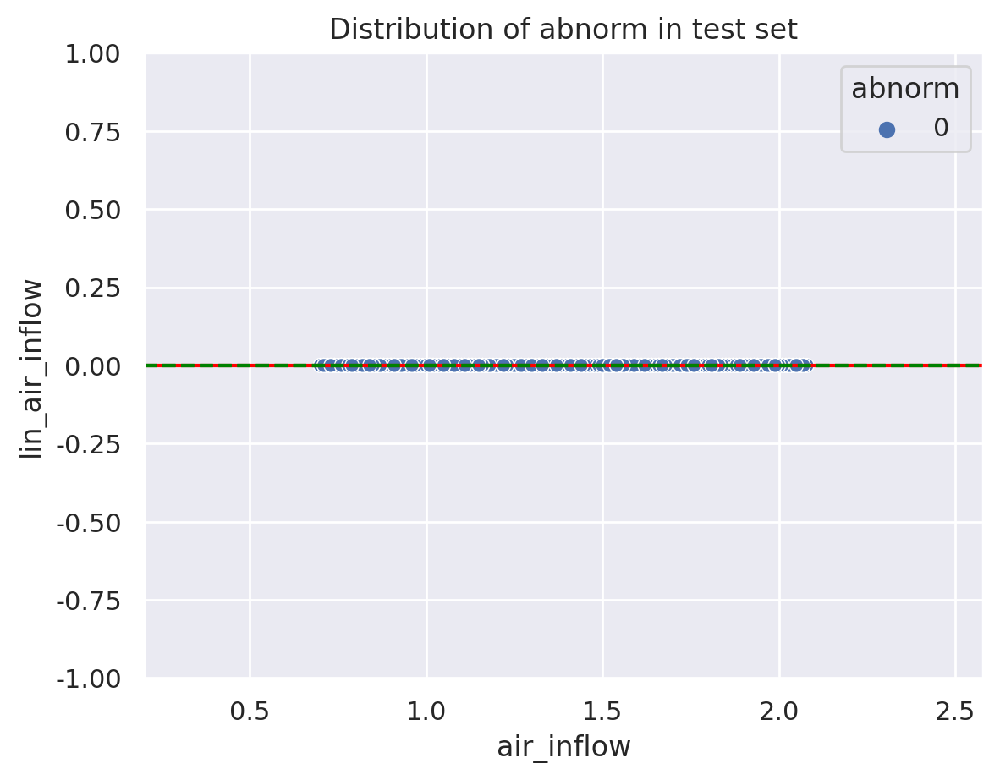

In [ ]:
# air_inflow
n_type = 1
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_1['air_inflow'] = pred_tmp

전체 데이터 수: 1107
고장 데이터 수:  0
고장 데이터 비율:  0.0


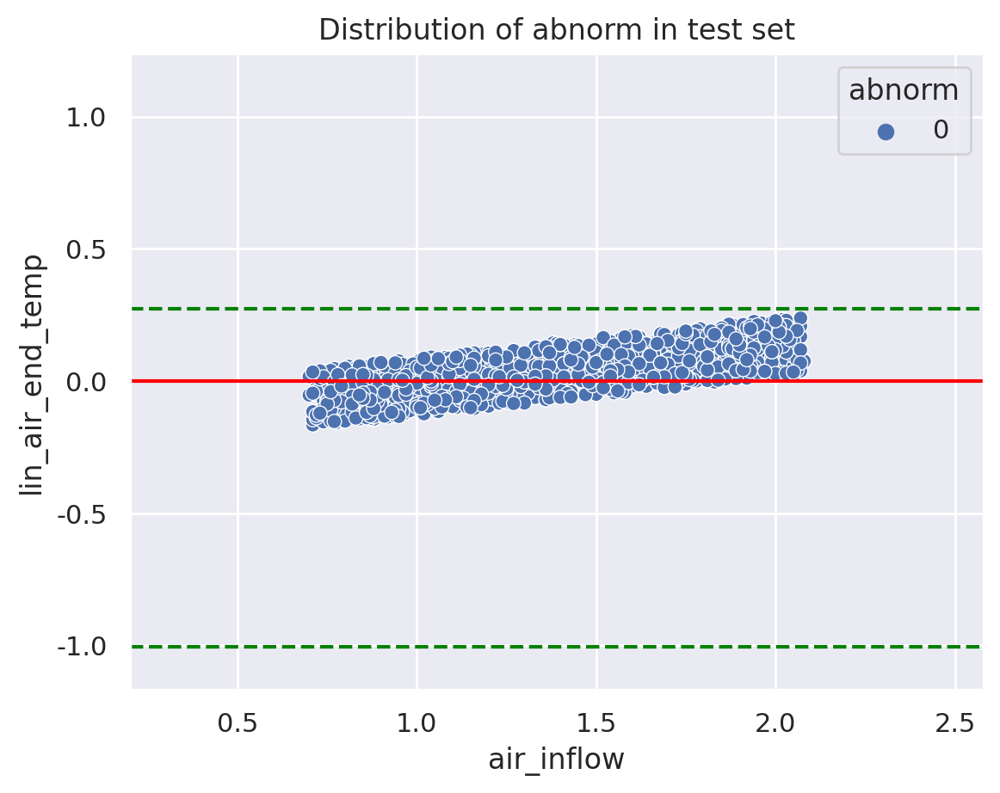

In [ ]:
# air_end_temp
n_type = 1
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_1['air_end_temp'] = pred_tmp

전체 데이터 수: 1107
고장 데이터 수:  0
고장 데이터 비율:  0.0


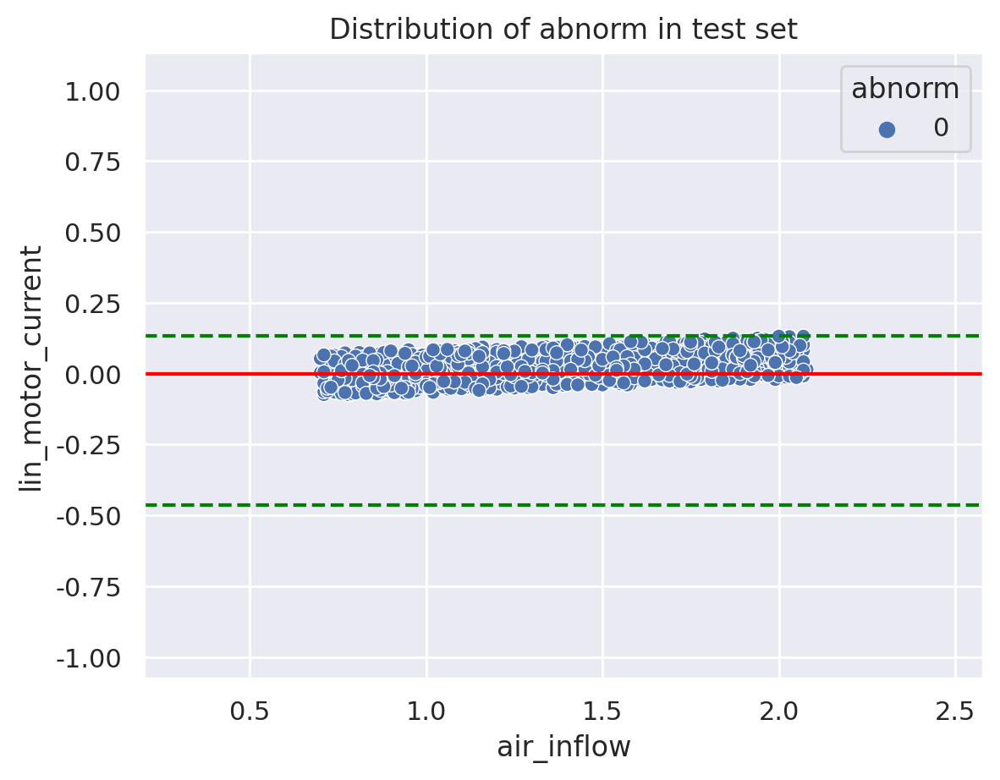

In [ ]:
# motor_current
n_type = 1
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_1['motor_current'] = pred_tmp

전체 데이터 수: 1107
고장 데이터 수:  2
고장 데이터 비율:  0.0018


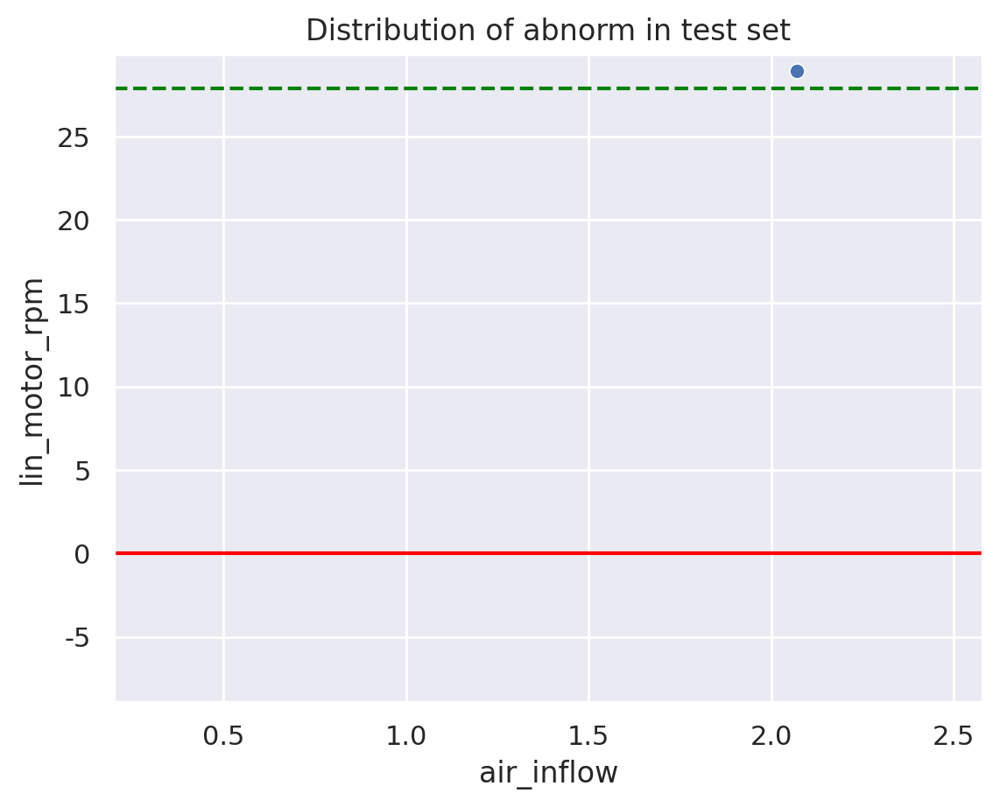

In [ ]:
# motor_rpm
n_type = 1
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=True,threshold=28)
df_pred_1['motor_rpm'] = pred_tmp

전체 데이터 수: 1107
고장 데이터 수:  0
고장 데이터 비율:  0.0


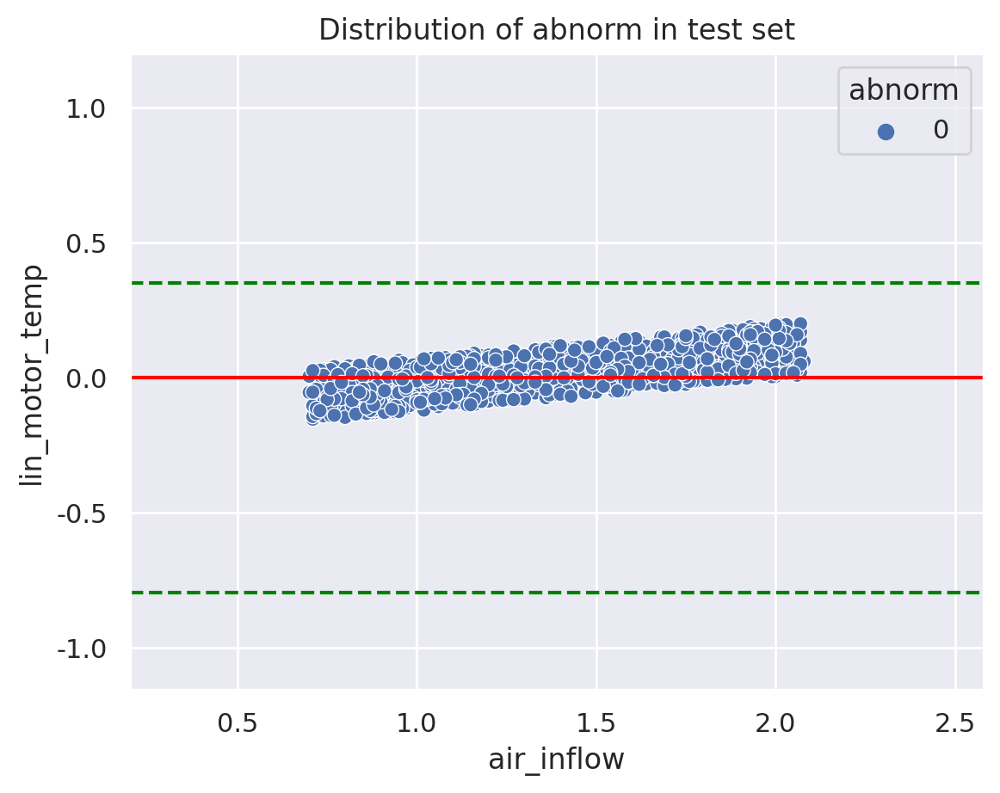

In [ ]:
# motor_temp
n_type = 1
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_1['motor_temp'] = pred_tmp

전체 데이터 수: 1107
고장 데이터 수:  0
고장 데이터 비율:  0.0


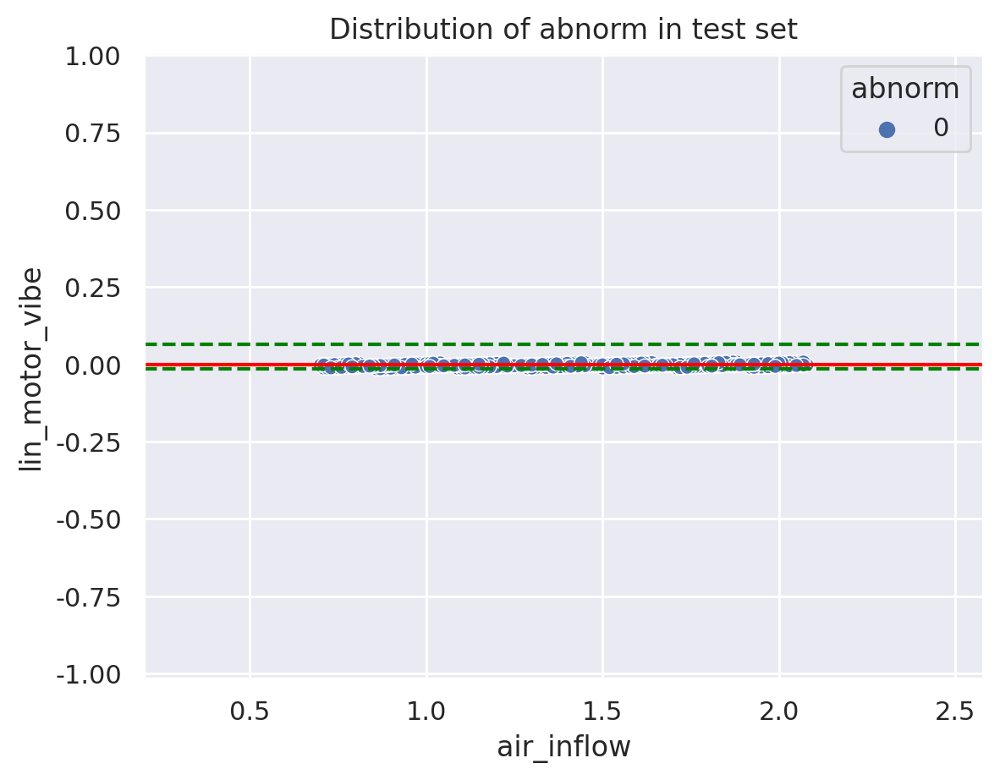

In [ ]:
# motor_vibe
n_type = 1
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_1['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_1['pred'] = df_pred_1.sum(axis=1)
pred_1 = df_pred_1['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_1))
print('고장 데이터 수: ', sum(pred_1))
print('고장 데이터 비율: ', round(sum(pred_1)/len(pred_1),4))

전체 데이터 수: 1107
고장 데이터 수:  2
고장 데이터 비율:  0.0018


In [ ]:
x_test_1['pred'] = pred_1

In [ ]:
df_pred_1['pred'].value_counts()

0    1105
1       2
Name: pred, dtype: int64

#### type == 2

In [ ]:
df_pred_2 = pd.DataFrame()

전체 데이터 수: 1098
고장 데이터 수:  0
고장 데이터 비율:  0.0


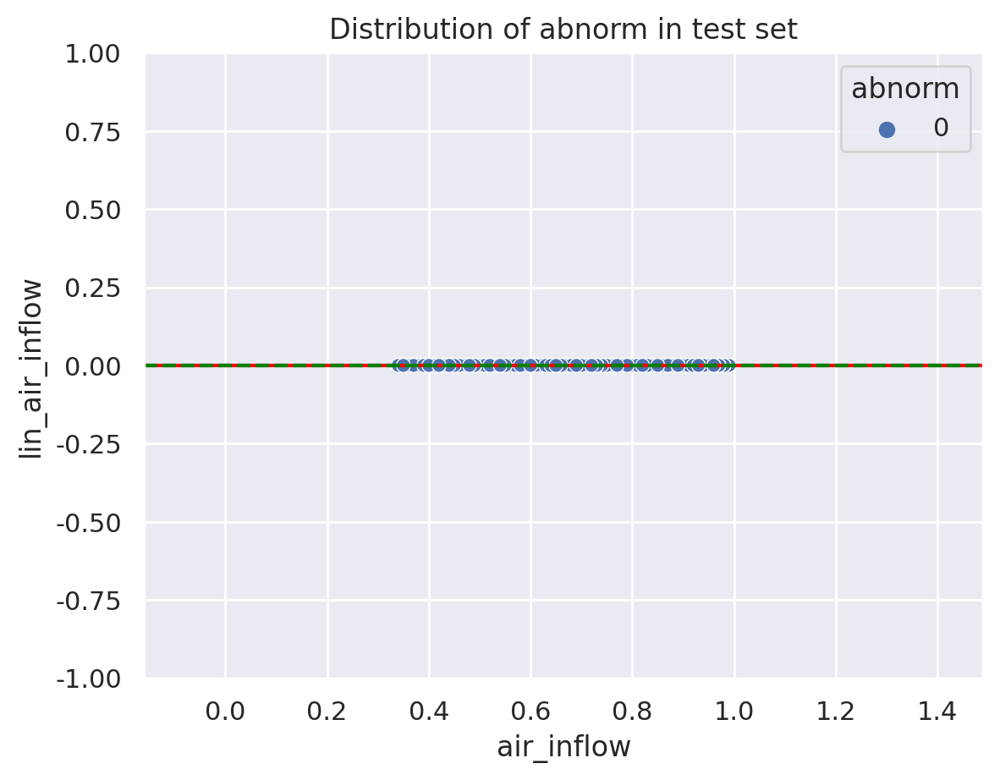

In [ ]:
# air_inflow
n_type = 2
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.01)
df_pred_2['air_inflow'] = pred_tmp

전체 데이터 수: 1098
고장 데이터 수:  8
고장 데이터 비율:  0.0073


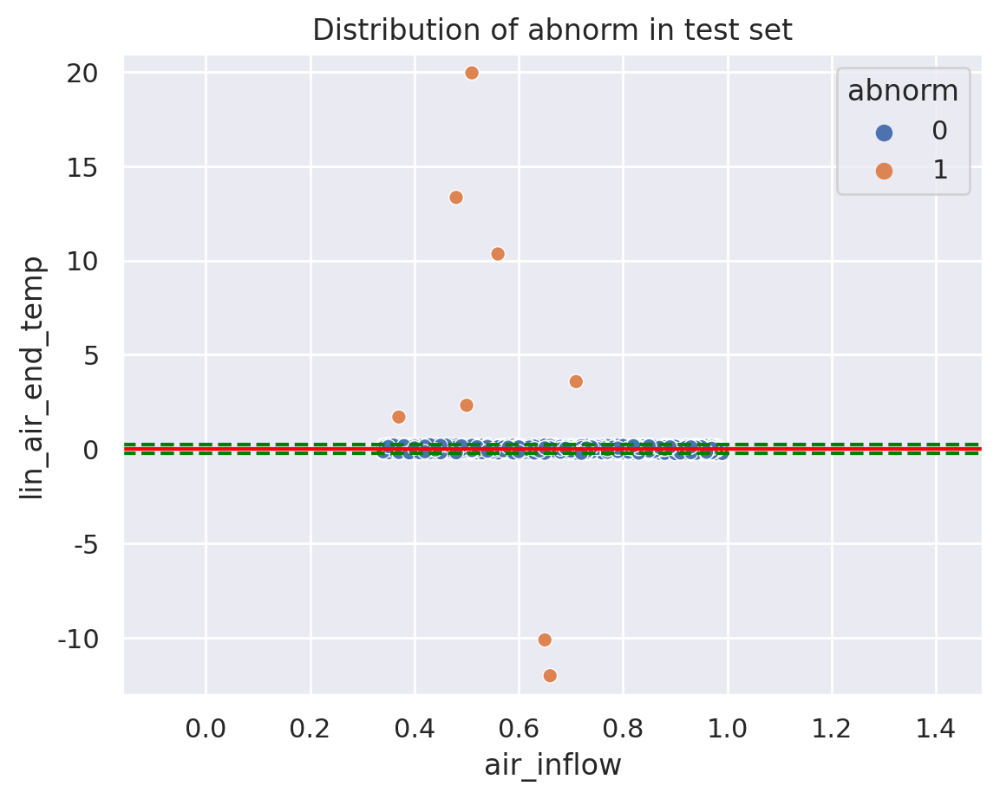

In [ ]:
# air_end_temp
n_type = 2
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_2['air_end_temp'] = pred_tmp

전체 데이터 수: 1098
고장 데이터 수:  26
고장 데이터 비율:  0.0237


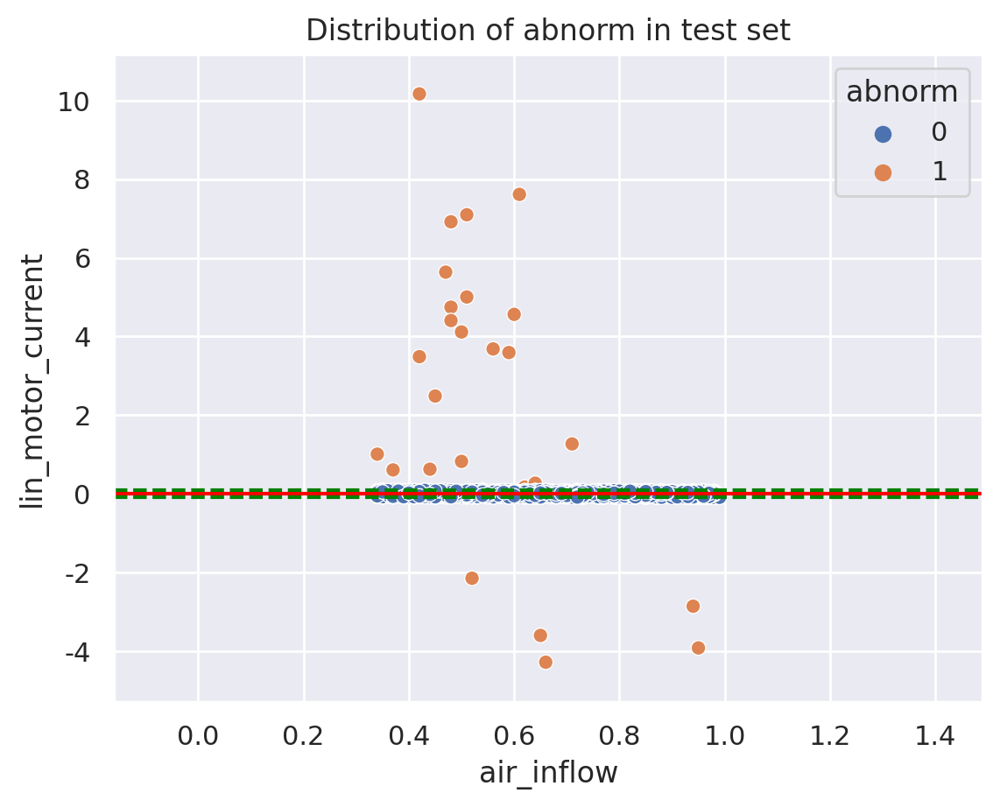

In [ ]:
# motor_current
n_type = 2
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_2['motor_current'] = pred_tmp

전체 데이터 수: 1098
고장 데이터 수:  9
고장 데이터 비율:  0.0082


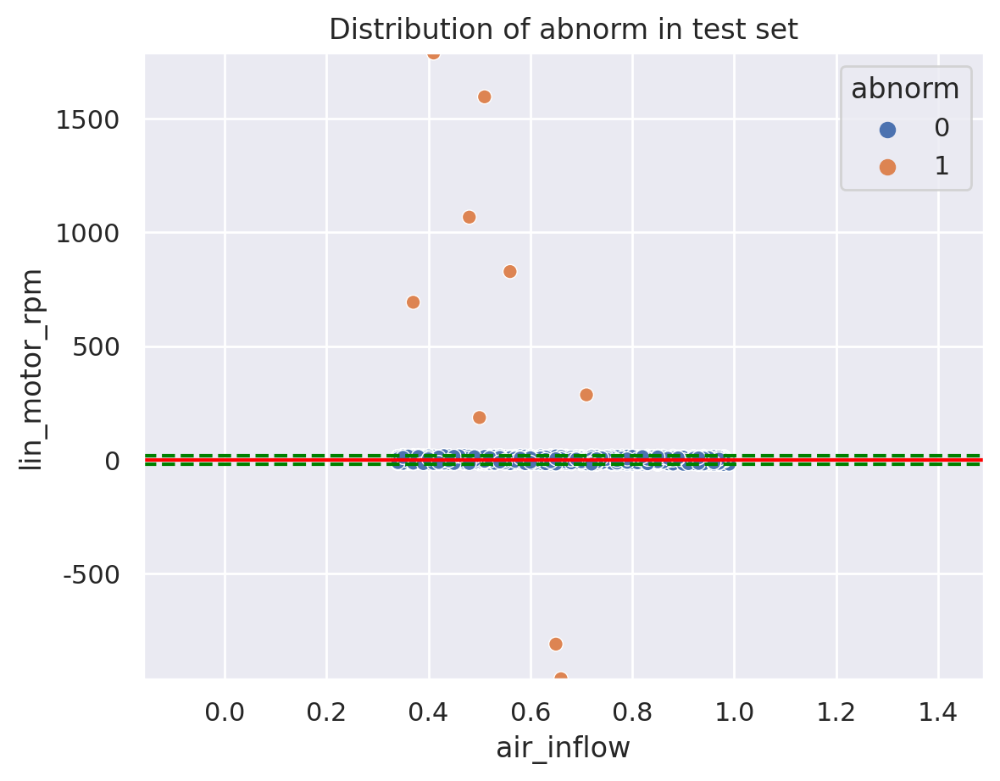

In [ ]:
# motor_rpm
n_type = 2
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=100)
df_pred_2['motor_rpm'] = pred_tmp

전체 데이터 수: 1098
고장 데이터 수:  26
고장 데이터 비율:  0.0237


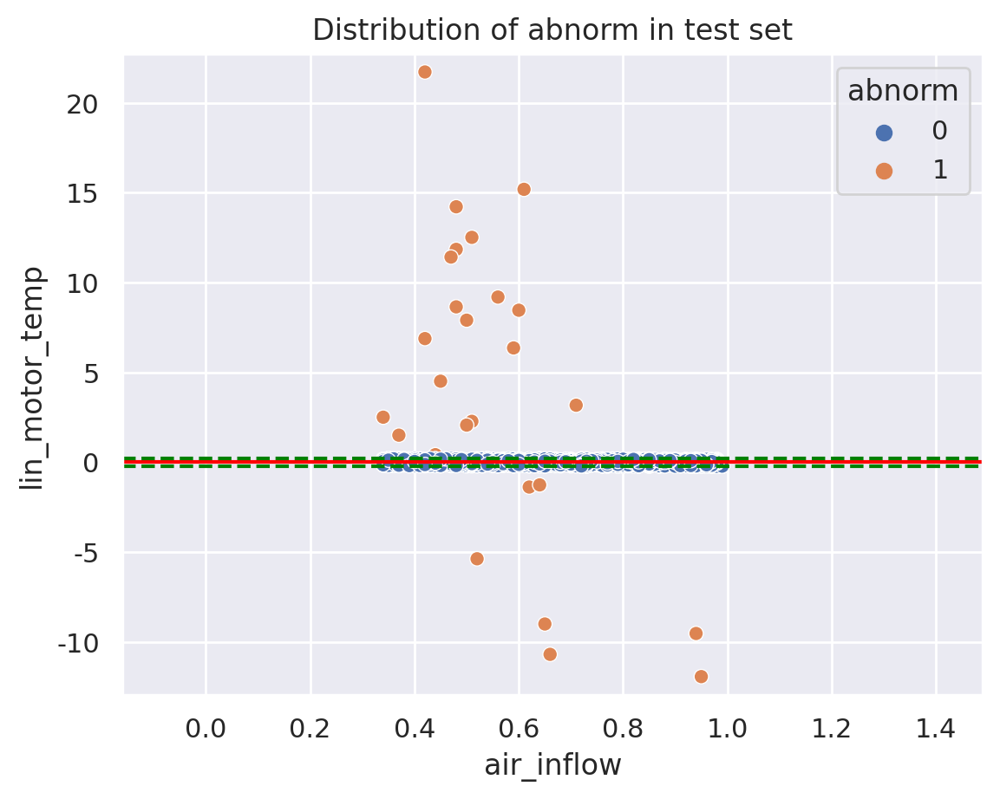

In [ ]:
# motor_temp
n_type = 2
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.3)
df_pred_2['motor_temp'] = pred_tmp

전체 데이터 수: 1098
고장 데이터 수:  8
고장 데이터 비율:  0.0073


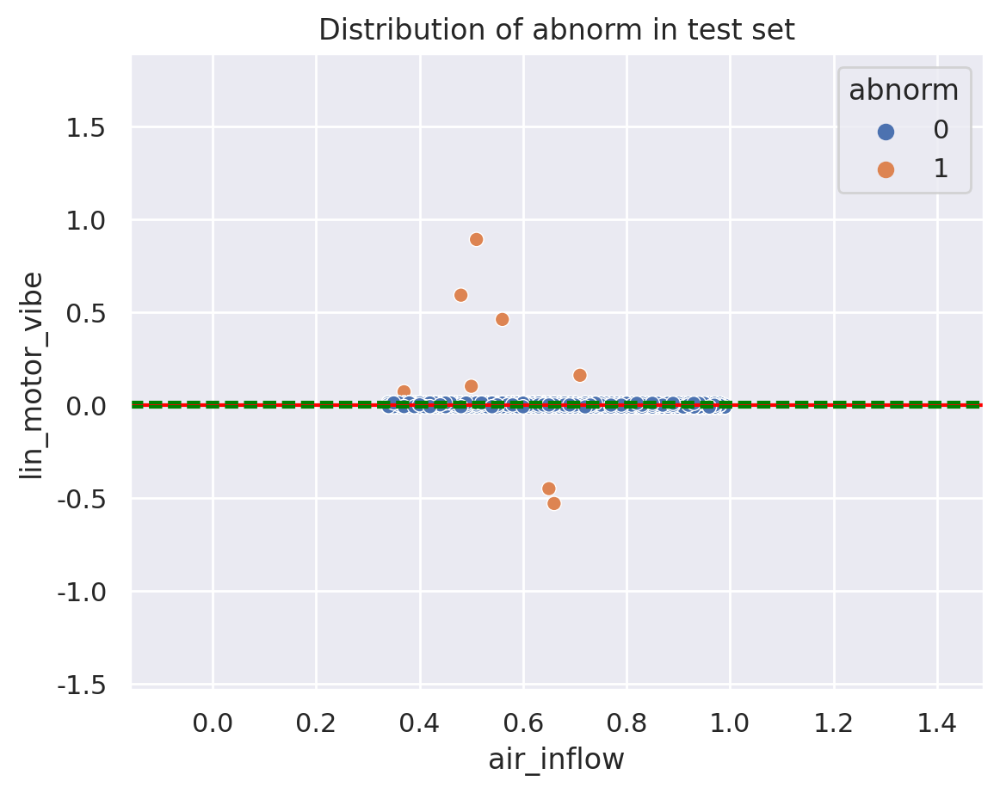

In [ ]:
# motor_vibe
n_type = 2
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.06)
df_pred_2['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_2['pred'] = df_pred_2.sum(axis=1)
pred_2 = df_pred_2['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_2))
print('고장 데이터 수: ', sum(pred_2))
print('고장 데이터 비율: ', round(sum(pred_2)/len(pred_2),4))

전체 데이터 수: 1098
고장 데이터 수:  27
고장 데이터 비율:  0.0246


In [ ]:
x_test_2['pred'] = pred_2

In [ ]:
df_pred_2['pred'].value_counts()

0    1071
2      18
5       8
1       1
Name: pred, dtype: int64

#### type == 3

In [ ]:
df_pred_3 = pd.DataFrame()

전체 데이터 수: 918
고장 데이터 수:  0
고장 데이터 비율:  0.0


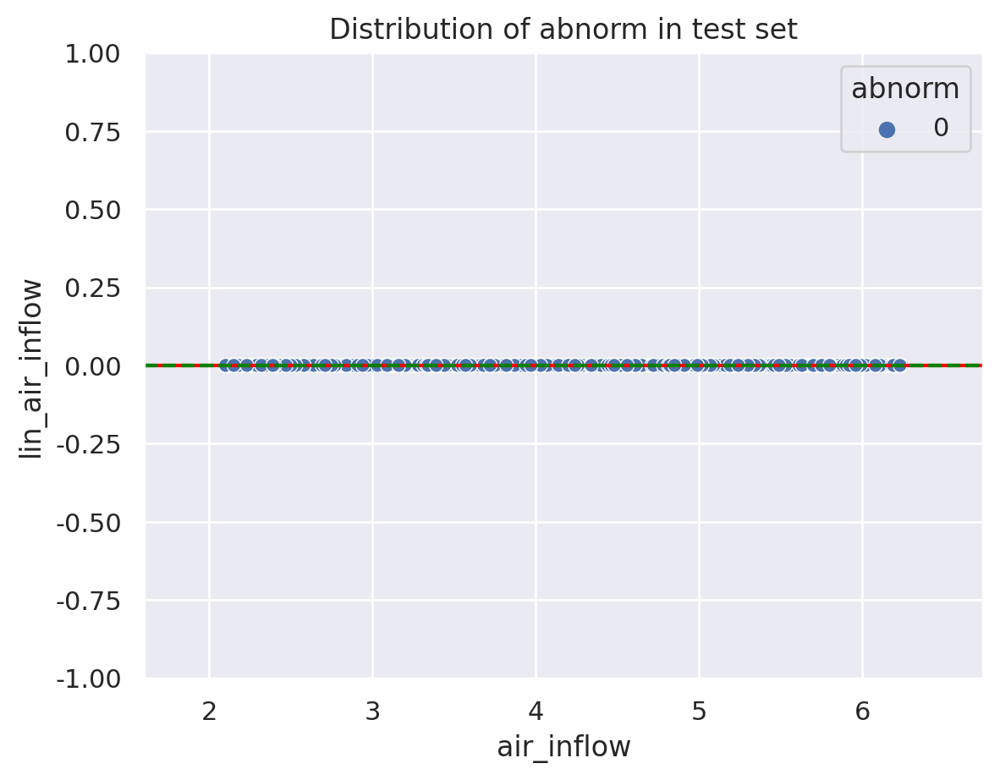

In [ ]:
# air_inflow
n_type = 3
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_3['air_inflow'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  25
고장 데이터 비율:  0.0272


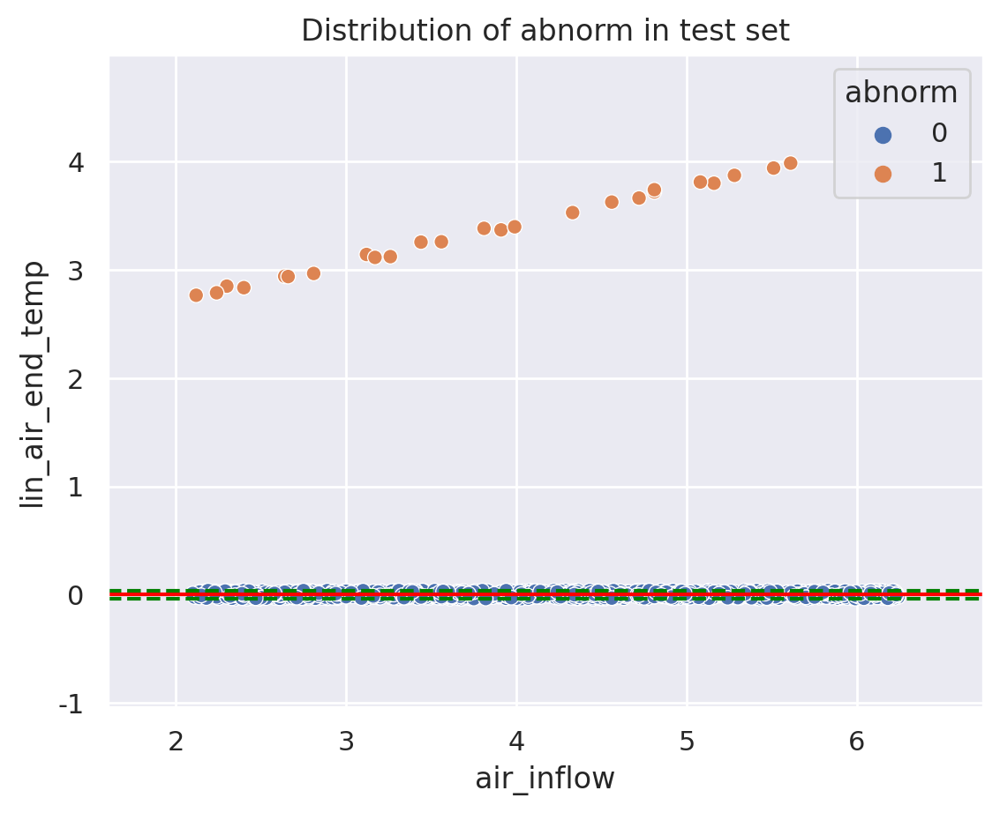

In [ ]:
# air_end_temp
n_type = 3
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_3['air_end_temp'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  25
고장 데이터 비율:  0.0272


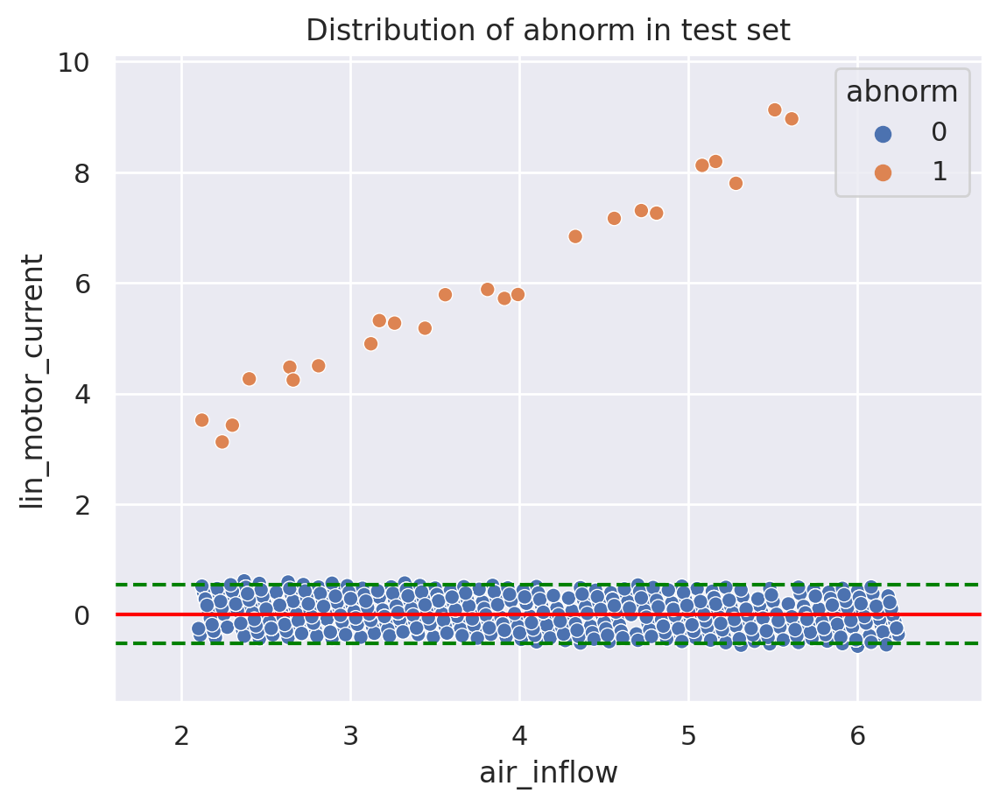

In [ ]:
# motor_current
n_type = 3
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_3['motor_current'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  25
고장 데이터 비율:  0.0272


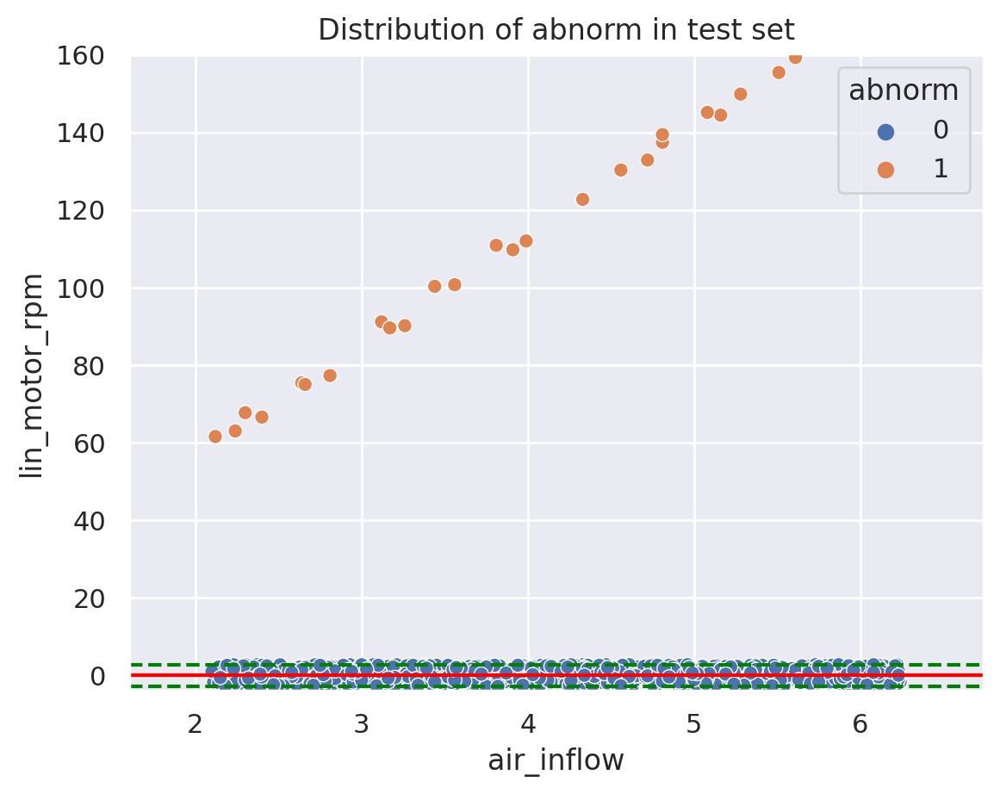

In [ ]:
# motor_rpm
n_type = 3
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=60)
df_pred_3['motor_rpm'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  26
고장 데이터 비율:  0.0283


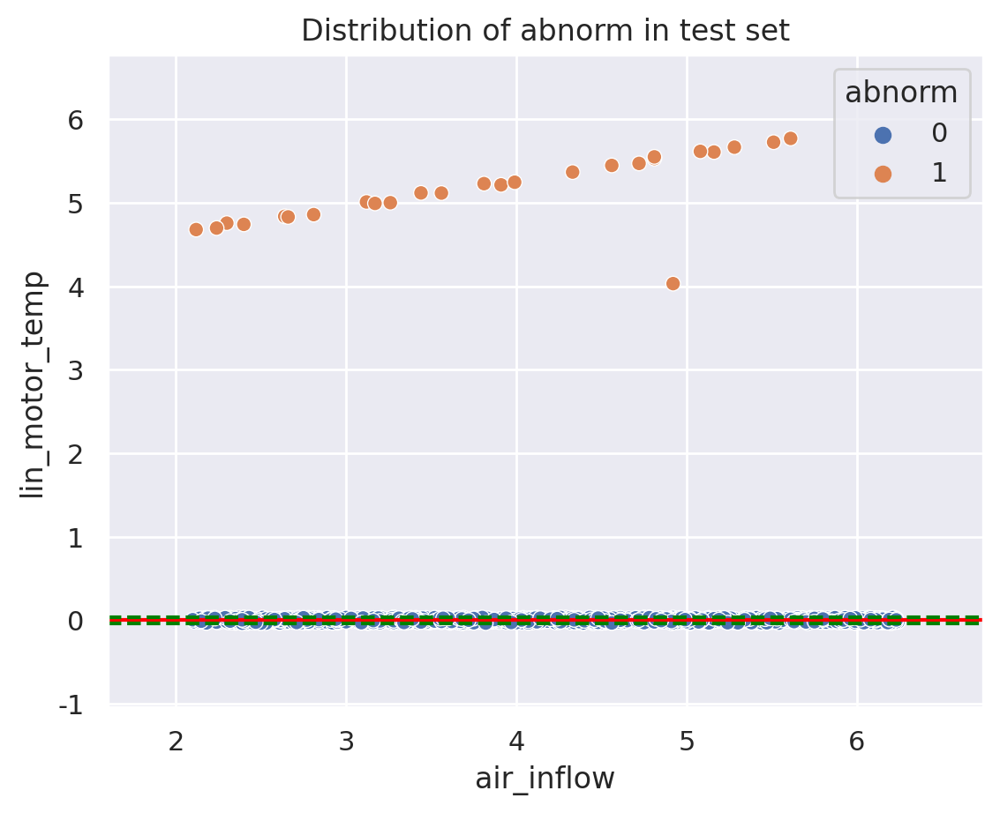

In [ ]:
# motor_temp
n_type = 3
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_3['motor_temp'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  26
고장 데이터 비율:  0.0283


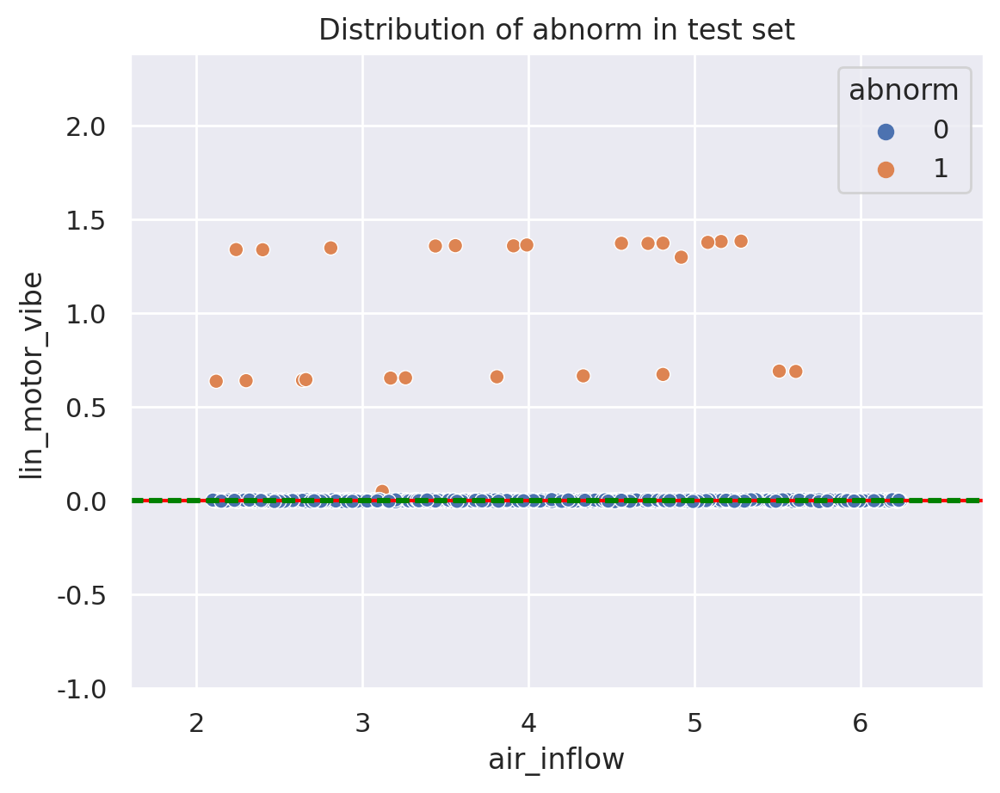

In [ ]:
# motor_vibe
n_type = 3
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.04)
df_pred_3['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_3['pred'] = df_pred_3.sum(axis=1)
pred_3 = df_pred_3['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_3))
print('고장 데이터 수: ', sum(pred_3))
print('고장 데이터 비율: ', round(sum(pred_3)/len(pred_3),4))

전체 데이터 수: 918
고장 데이터 수:  26
고장 데이터 비율:  0.0283


In [ ]:
x_test_3['pred'] = pred_3

In [ ]:
df_pred_3['pred'].value_counts()

0    892
5     25
2      1
Name: pred, dtype: int64

#### type == 4

In [ ]:
df_pred_4 = pd.DataFrame()

전체 데이터 수: 918
고장 데이터 수:  0
고장 데이터 비율:  0.0


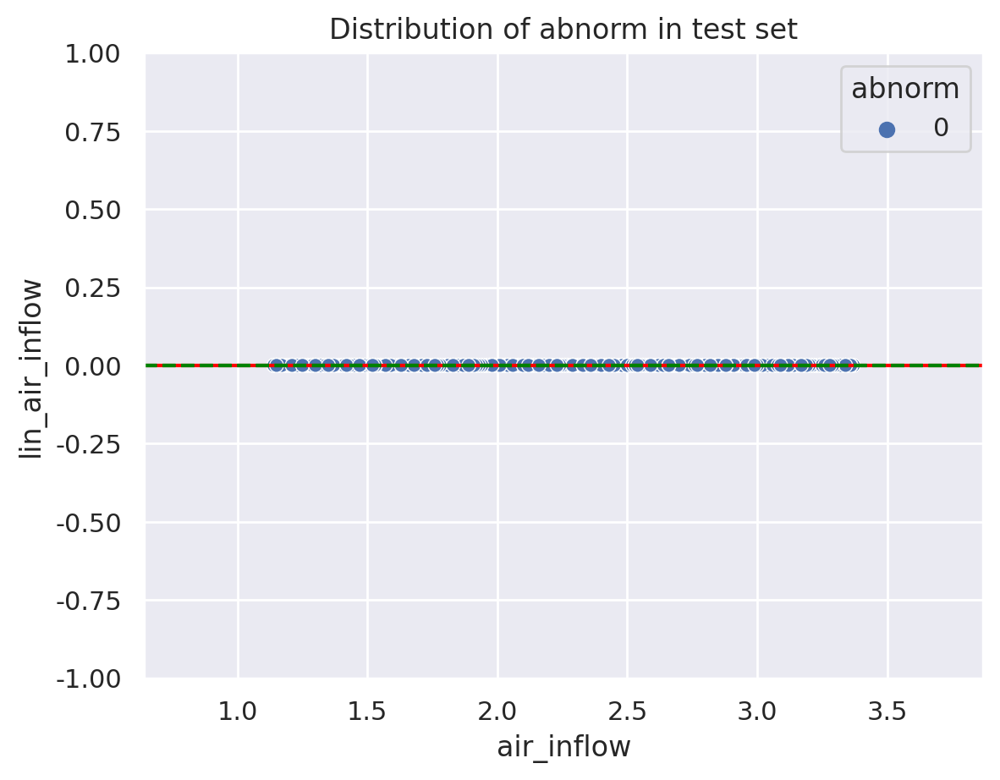

In [ ]:
# air_inflow
n_type = 4
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.05)
df_pred_4['air_inflow'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


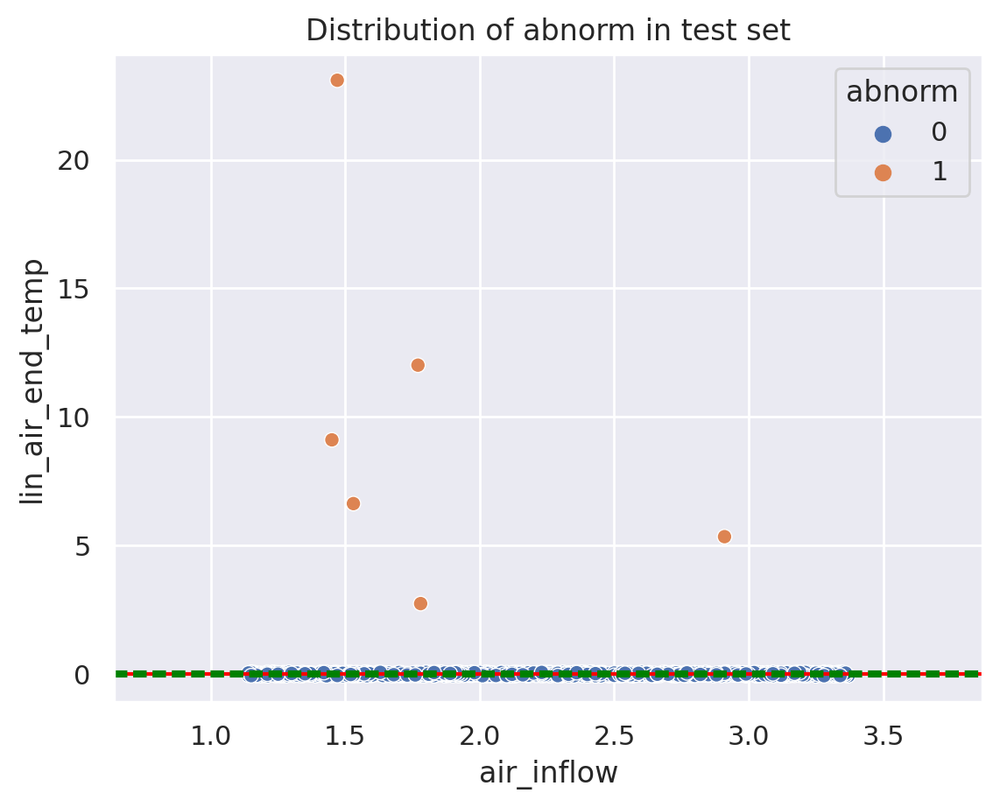

In [ ]:
# air_end_temp
n_type = 4
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_4['air_end_temp'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


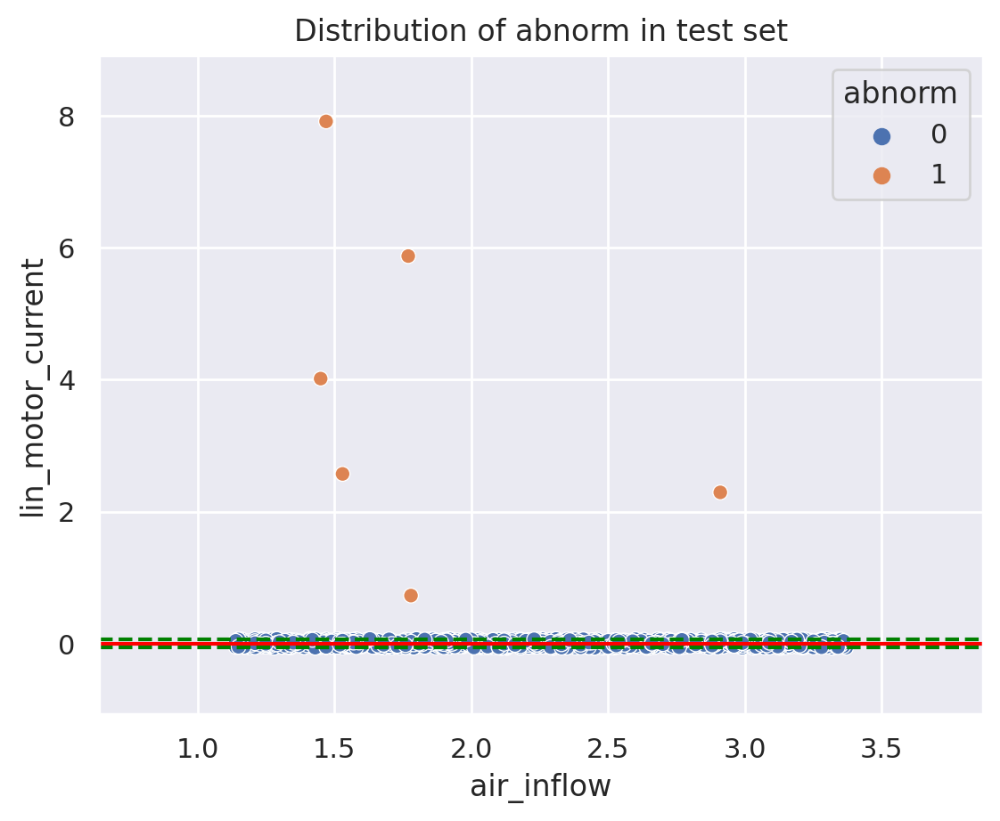

In [ ]:
# motor_current
n_type = 4
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_4['motor_current'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


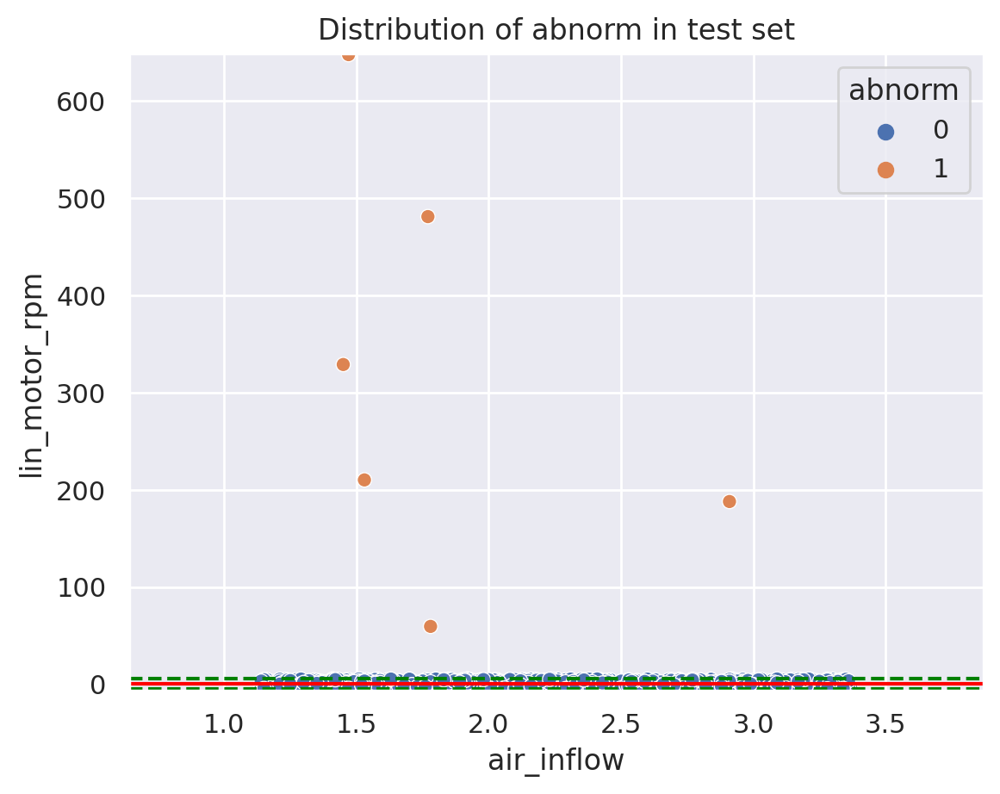

In [ ]:
# motor_rpm
n_type = 4
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=10)
df_pred_4['motor_rpm'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


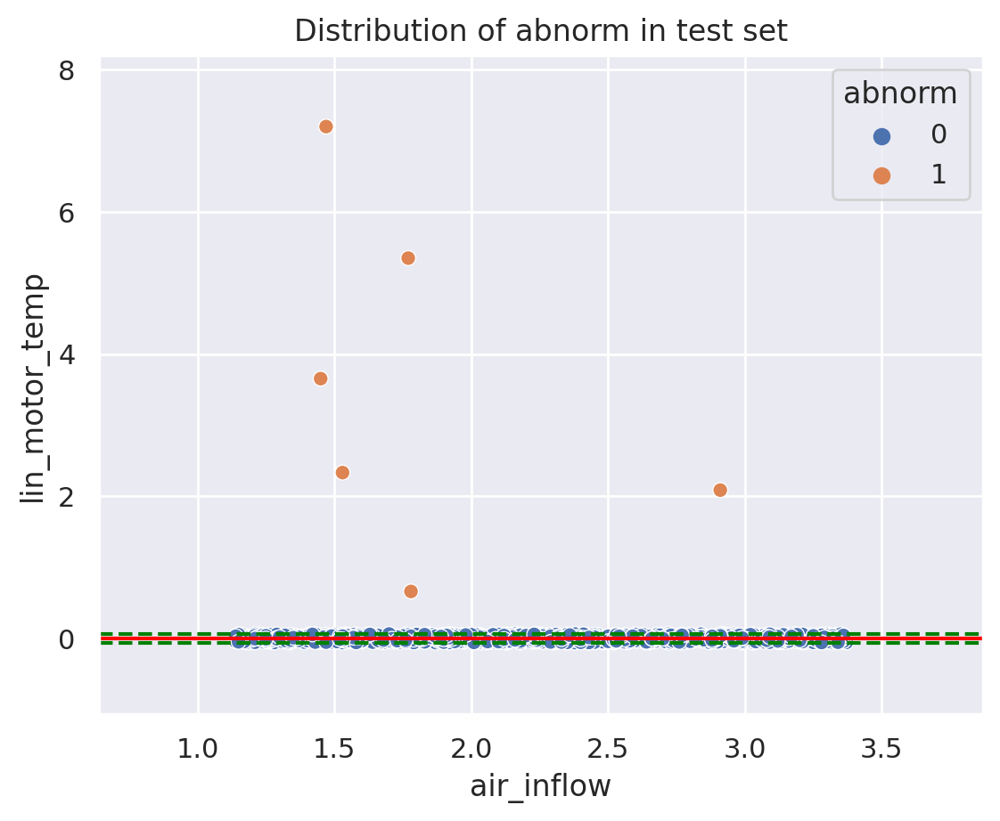

In [ ]:
# motor_temp
n_type = 4
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_4['motor_temp'] = pred_tmp

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


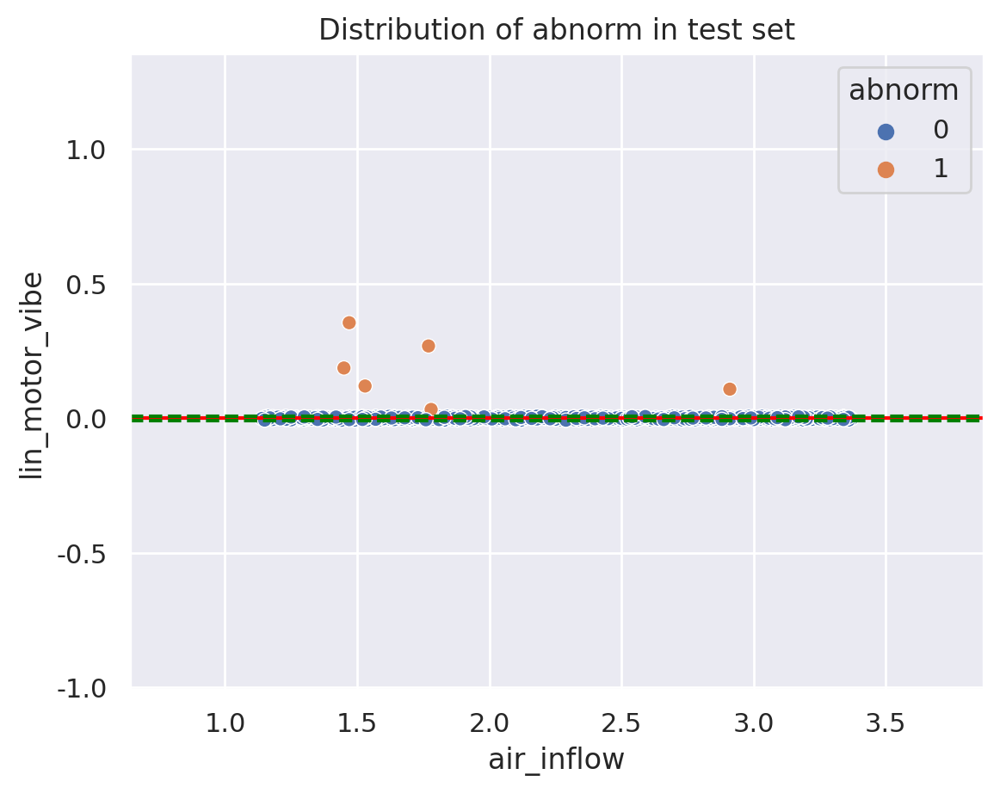

In [ ]:
# motor_vibe
n_type = 4
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.03)
df_pred_4['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_4['pred'] = df_pred_4.sum(axis=1)
pred_4 = df_pred_4['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_4))
print('고장 데이터 수: ', sum(pred_4))
print('고장 데이터 비율: ', round(sum(pred_4)/len(pred_4),4))

전체 데이터 수: 918
고장 데이터 수:  6
고장 데이터 비율:  0.0065


In [ ]:
x_test_4['pred'] = pred_4

In [ ]:
df_pred_4['pred'].value_counts()

0    912
5      6
Name: pred, dtype: int64

#### type == 5

In [ ]:
df_pred_5 = pd.DataFrame()

전체 데이터 수: 747
고장 데이터 수:  0
고장 데이터 비율:  0.0


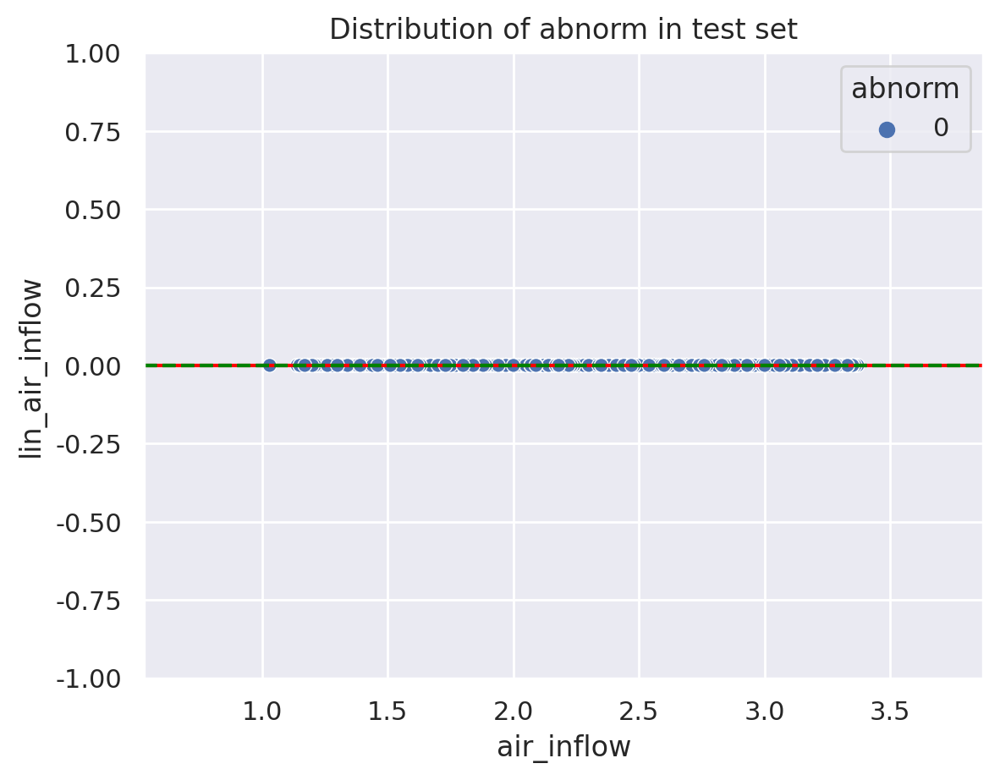

In [ ]:
# air_inflow
n_type = 5
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.05)
df_pred_5['air_inflow'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


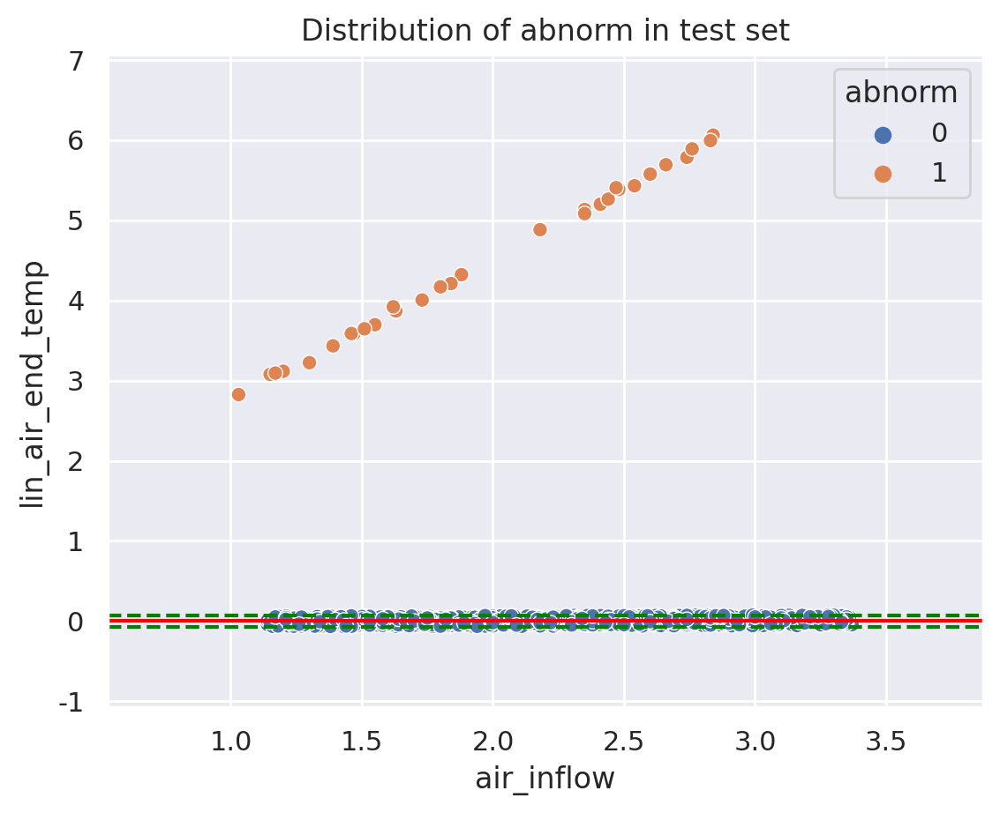

In [ ]:
# air_end_temp
n_type = 5
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_5['air_end_temp'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


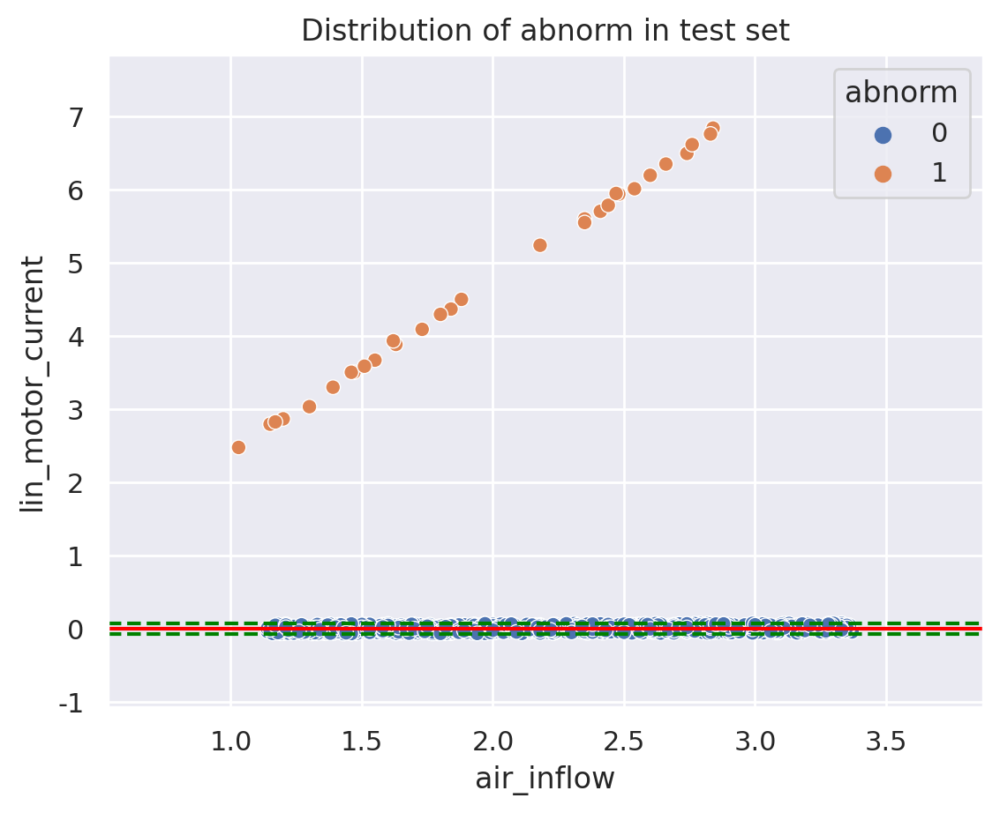

In [ ]:
# motor_current
n_type = 5
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_5['motor_current'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


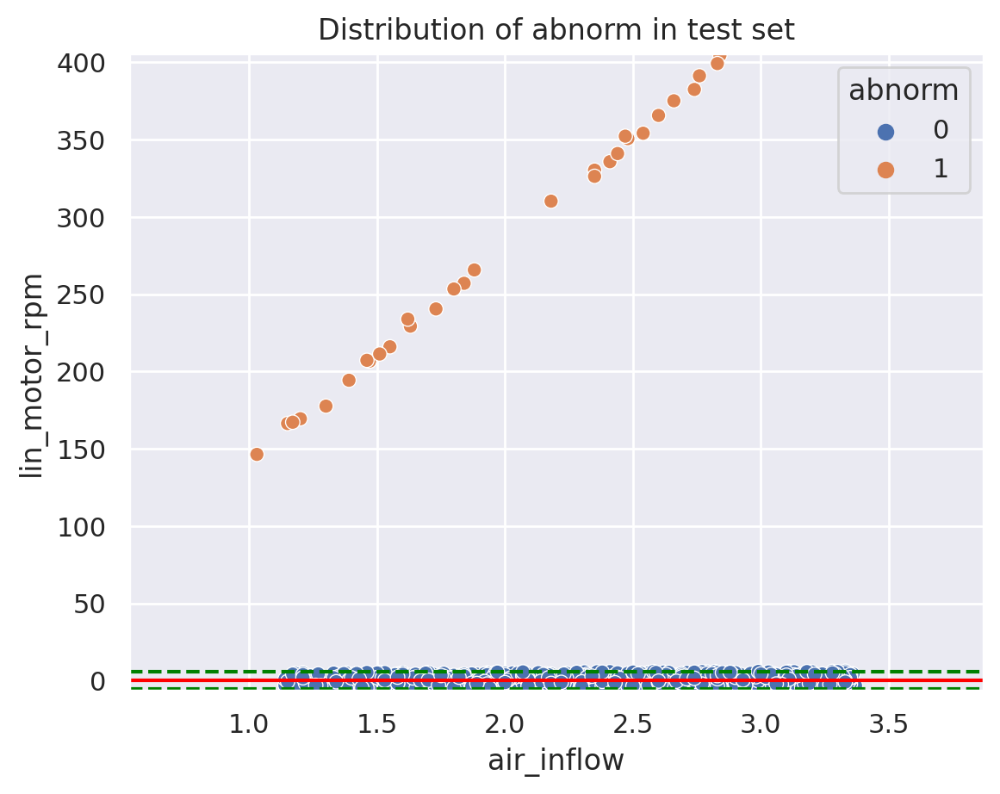

In [ ]:
# motor_rpm
n_type = 5
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=100)
df_pred_5['motor_rpm'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


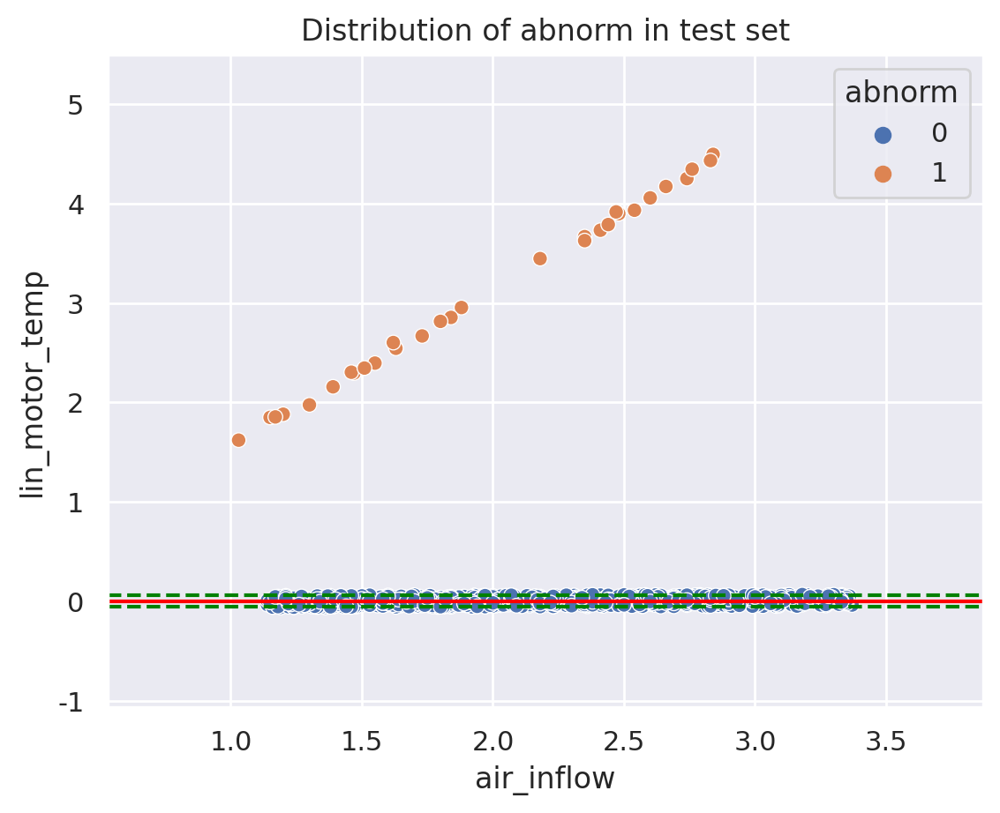

In [ ]:
# motor_temp
n_type = 5
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_5['motor_temp'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


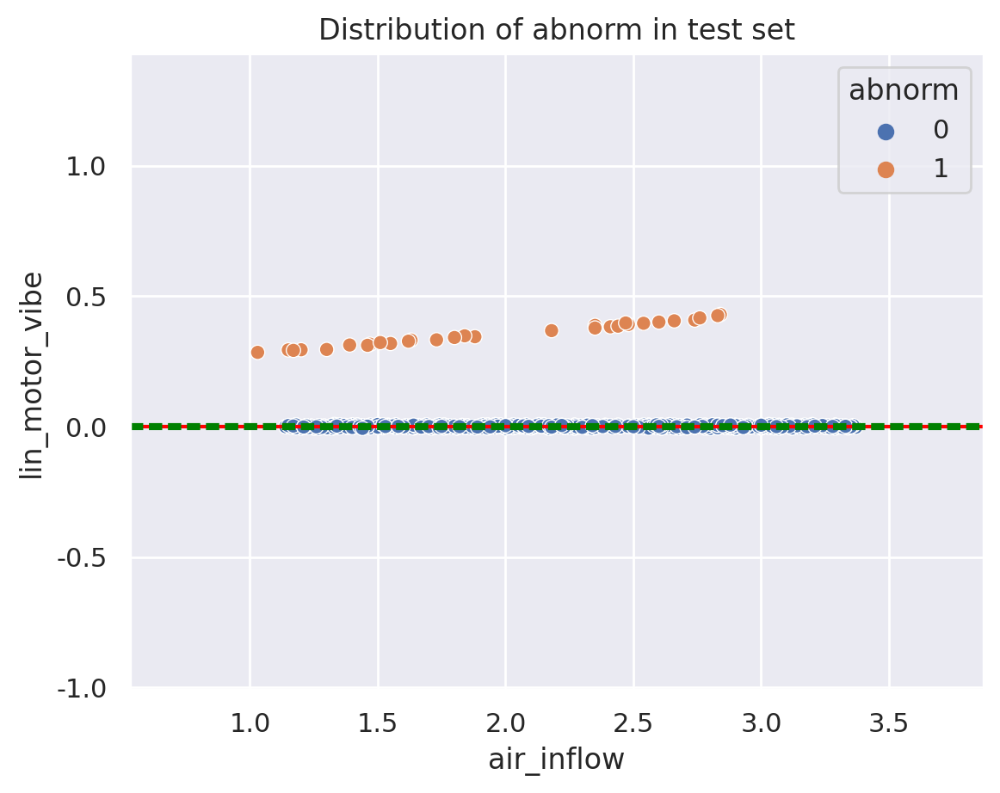

In [ ]:
# motor_vibe
n_type = 5
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_5['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_5['pred'] = df_pred_5.sum(axis=1)
pred_5 = df_pred_5['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_5))
print('고장 데이터 수: ', sum(pred_5))
print('고장 데이터 비율: ', round(sum(pred_5)/len(pred_5),4))

전체 데이터 수: 747
고장 데이터 수:  30
고장 데이터 비율:  0.0402


In [ ]:
x_test_5['pred'] = pred_5

In [ ]:
df_pred_5['pred'].value_counts()

0    717
5     30
Name: pred, dtype: int64

#### type == 6

In [ ]:
df_pred_6 = pd.DataFrame()

전체 데이터 수: 747
고장 데이터 수:  0
고장 데이터 비율:  0.0


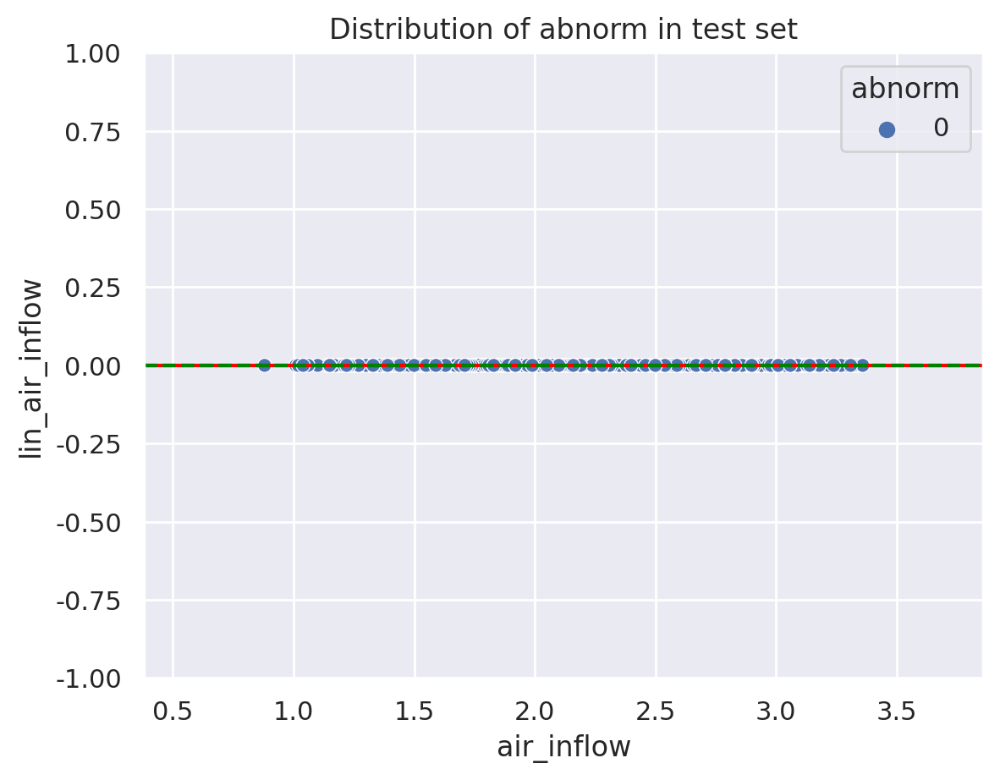

In [ ]:
# air_inflow
n_type = 6
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.05)
df_pred_6['air_inflow'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


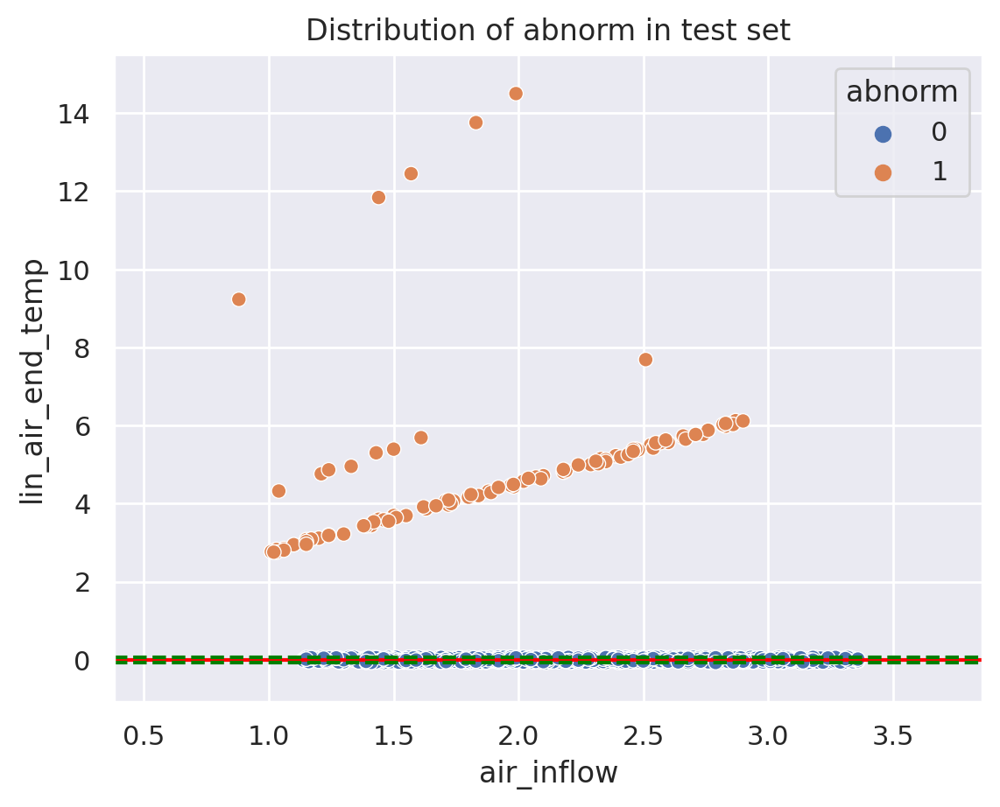

In [ ]:
# air_end_temp
n_type = 6
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=2)
df_pred_6['air_end_temp'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


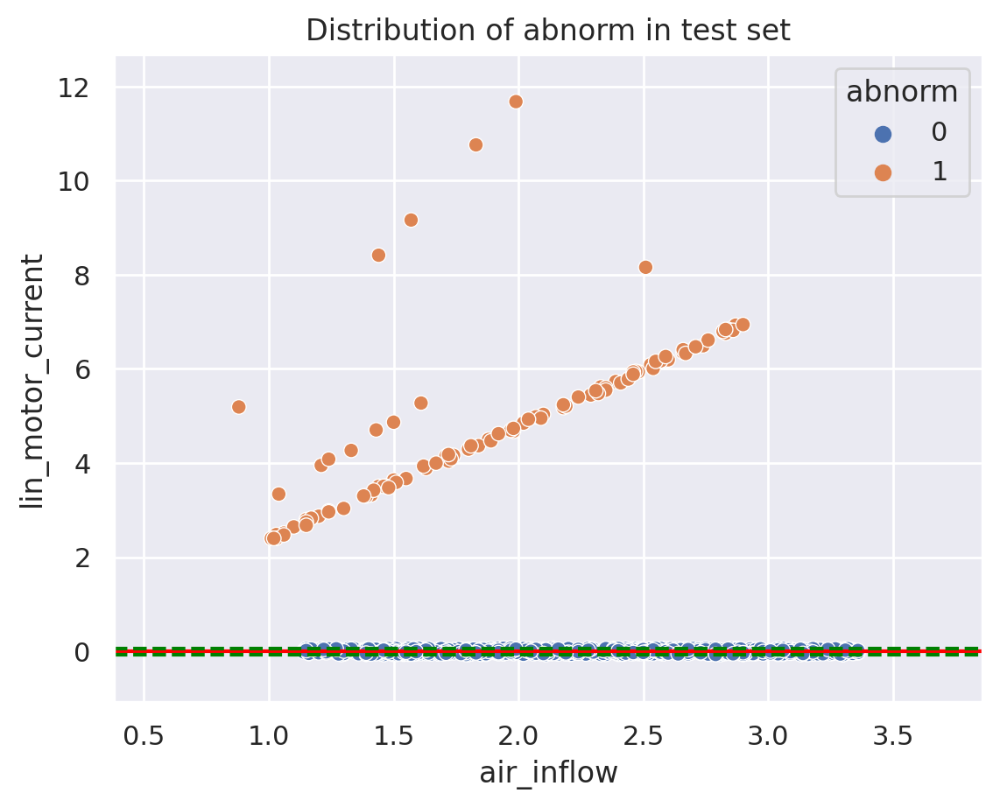

In [ ]:
# motor_current
n_type = 6
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_6['motor_current'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


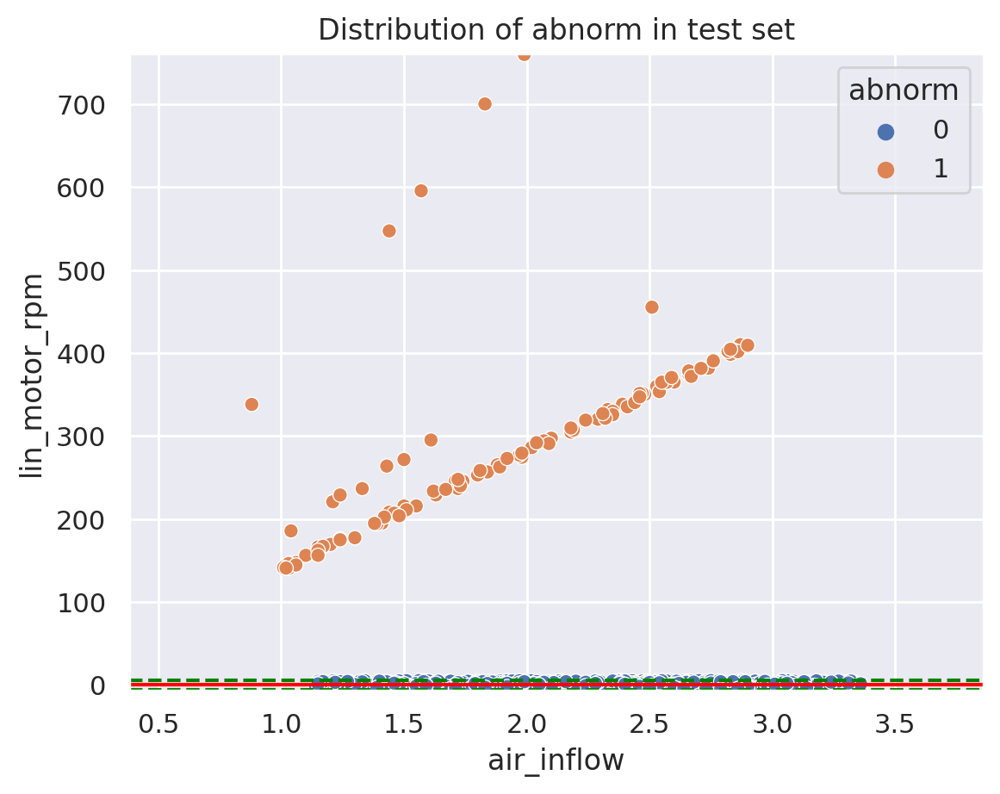

In [ ]:
# motor_rpm
n_type = 6
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=100)
df_pred_6['motor_rpm'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


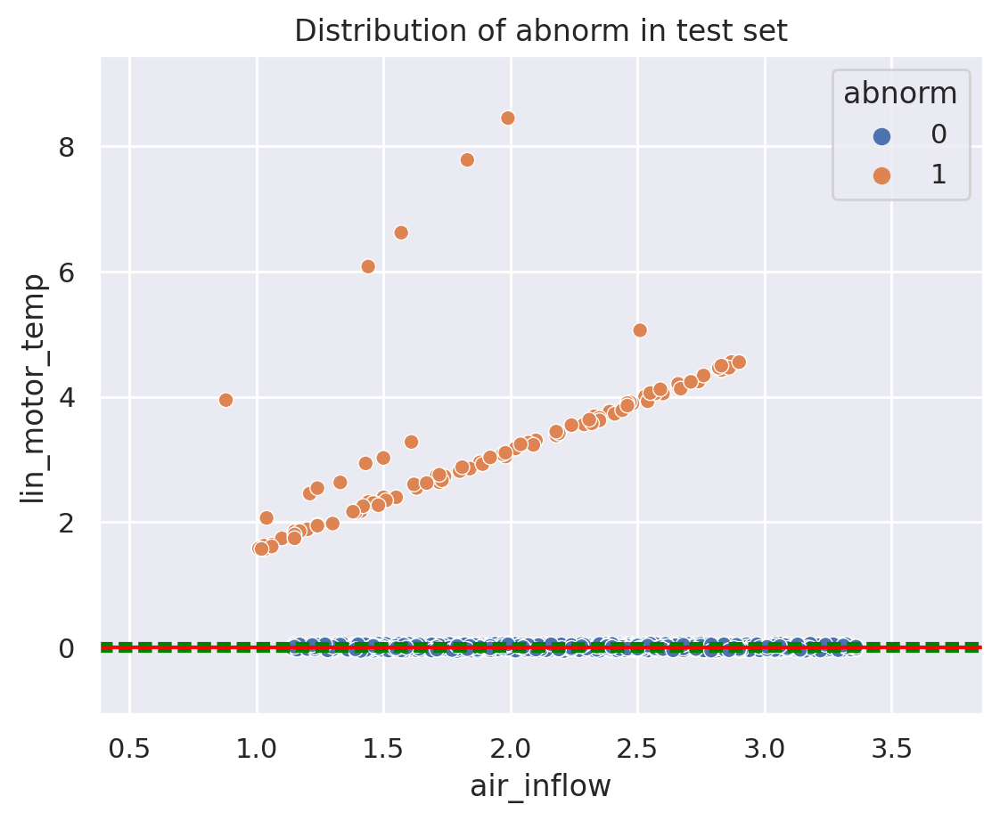

In [ ]:
# motor_temp
n_type = 6
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_6['motor_temp'] = pred_tmp

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


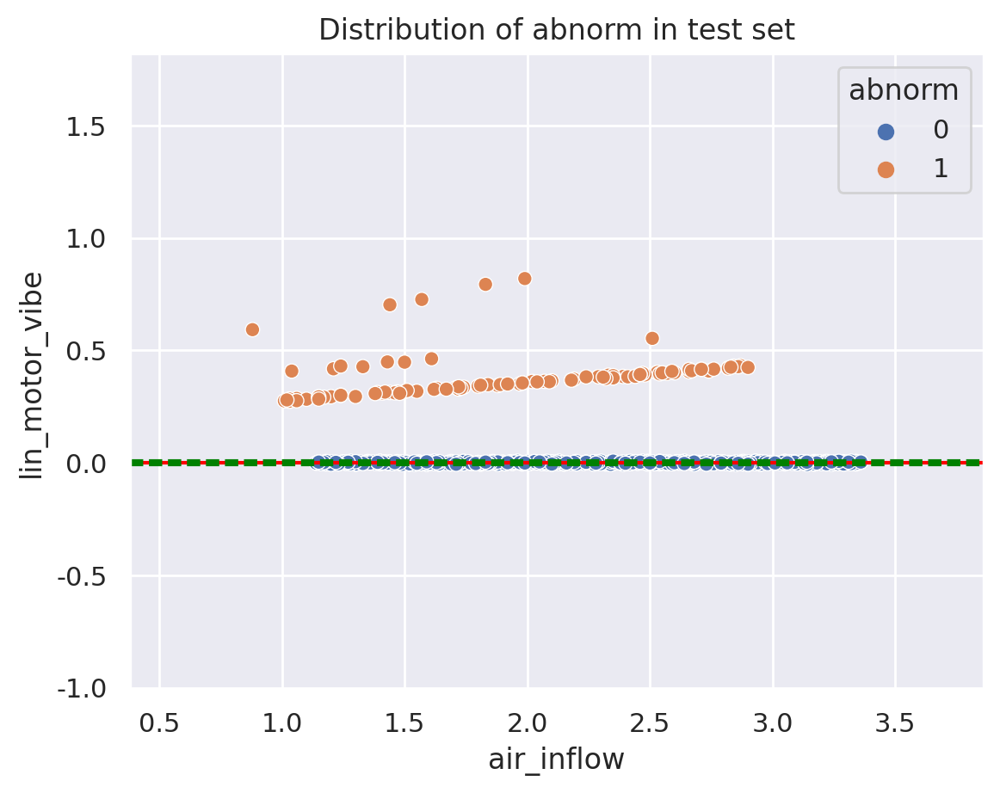

In [ ]:
# motor_vibe
n_type = 6
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_6['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_6['pred'] = df_pred_6.sum(axis=1)
pred_6 = df_pred_6['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_6))
print('고장 데이터 수: ', sum(pred_6))
print('고장 데이터 비율: ', round(sum(pred_6)/len(pred_6),4))

전체 데이터 수: 747
고장 데이터 수:  101
고장 데이터 비율:  0.1352


In [ ]:
x_test_6['pred'] = pred_6

In [ ]:
df_pred_6['pred'].value_counts()

0    646
5    101
Name: pred, dtype: int64

#### type == 7

In [ ]:
df_pred_7 = pd.DataFrame()

전체 데이터 수: 558
고장 데이터 수:  0
고장 데이터 비율:  0.0


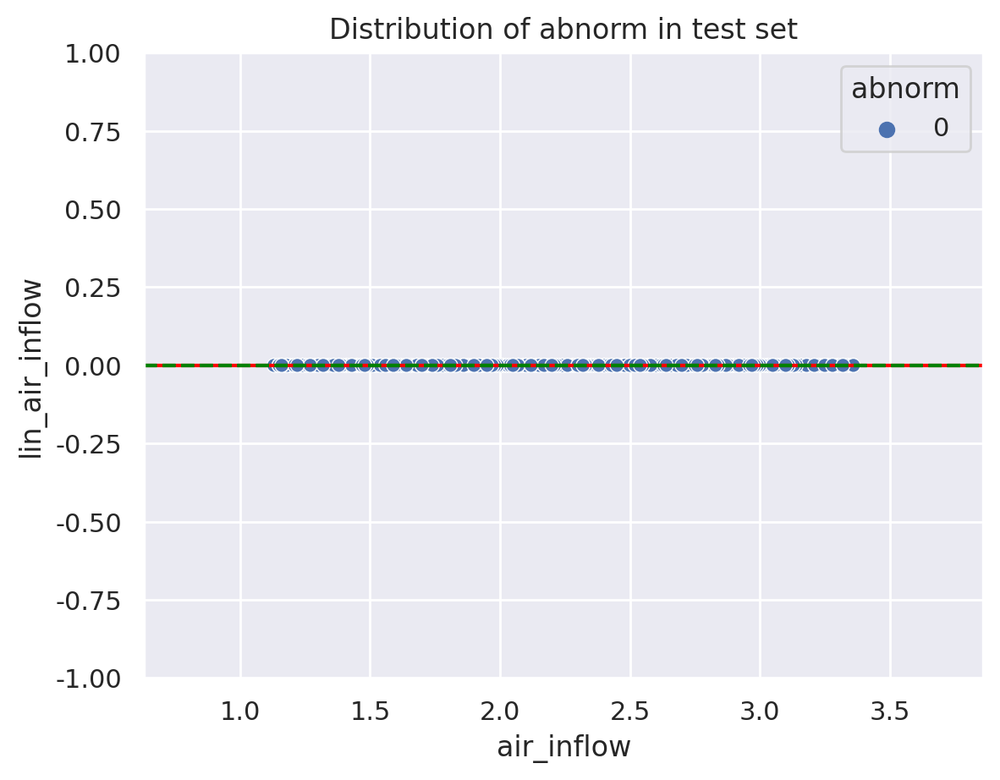

In [ ]:
# air_inflow
n_type = 7
col = 'air_inflow'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.05)
df_pred_7['air_inflow'] = pred_tmp

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


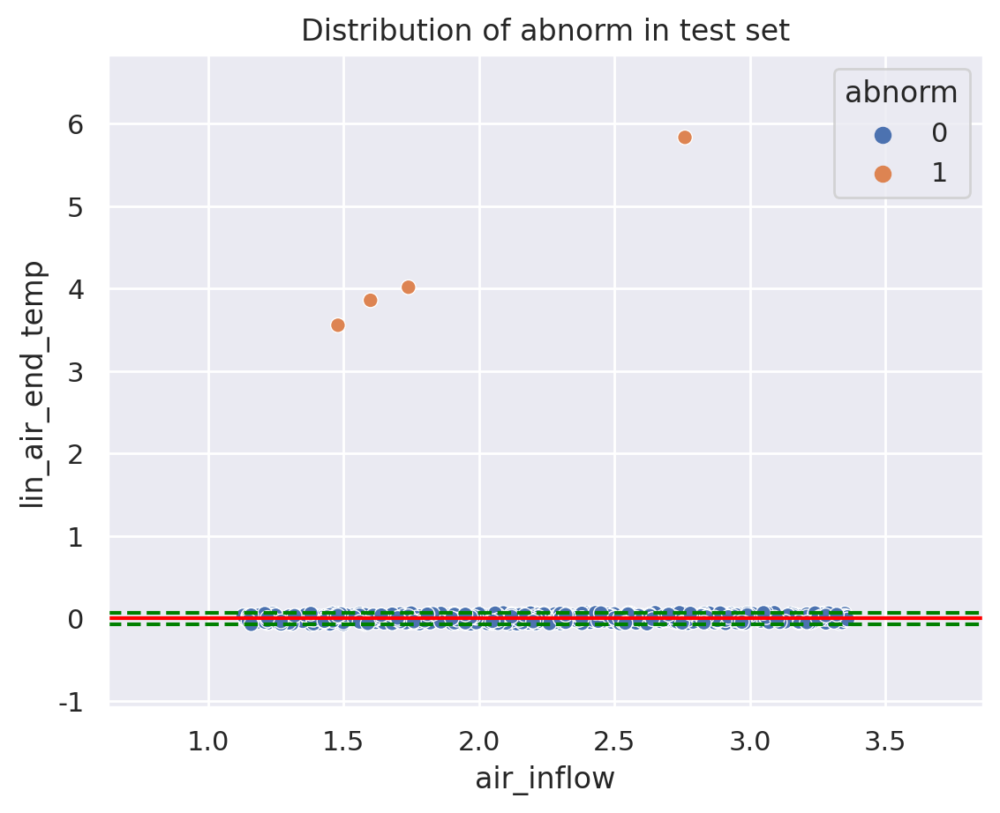

In [ ]:
# air_end_temp
n_type = 7
col = 'air_end_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.4)
df_pred_7['air_end_temp'] = pred_tmp

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


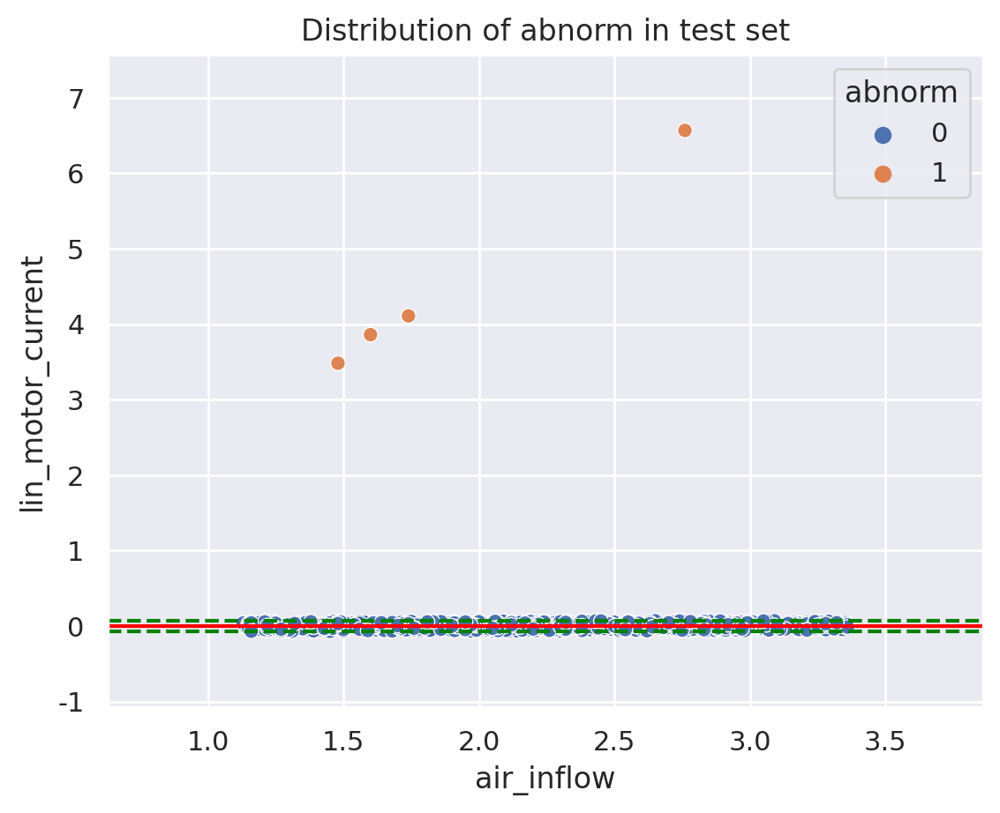

In [ ]:
# motor_current
n_type = 7
col = 'motor_current'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_7['motor_current'] = pred_tmp

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


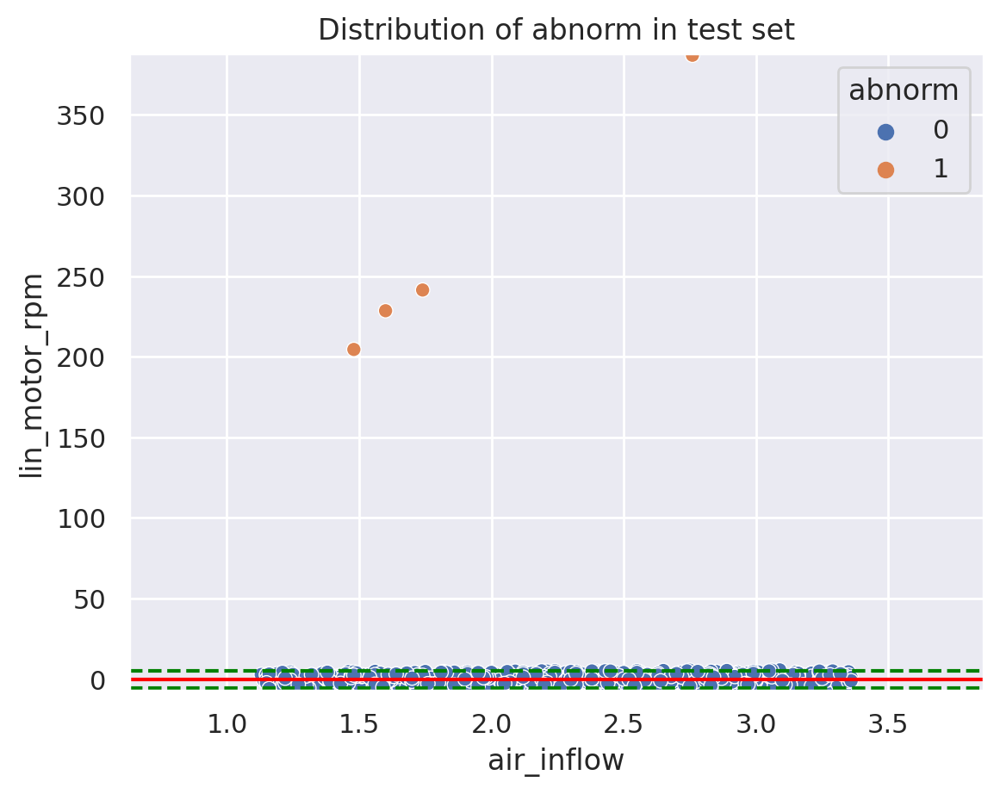

In [ ]:
# motor_rpm
n_type = 7
col = 'motor_rpm'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=100)
df_pred_7['motor_rpm'] = pred_tmp

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


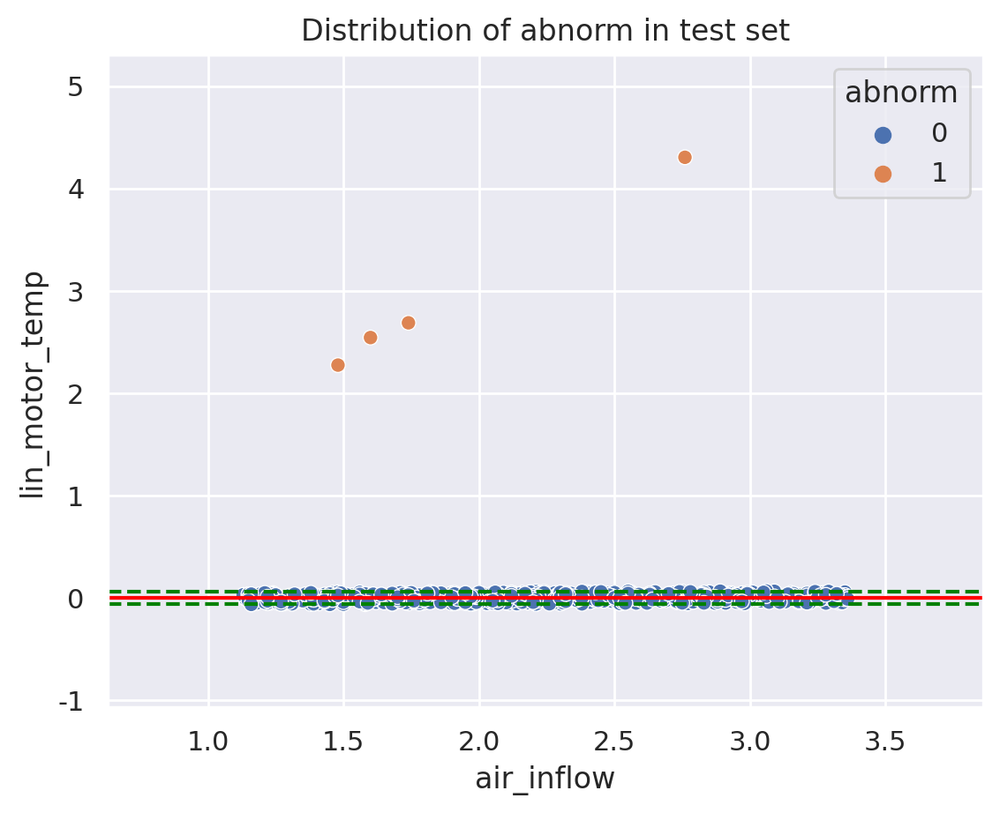

In [ ]:
# motor_temp
n_type = 7
col = 'motor_temp'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=1)
df_pred_7['motor_temp'] = pred_tmp

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


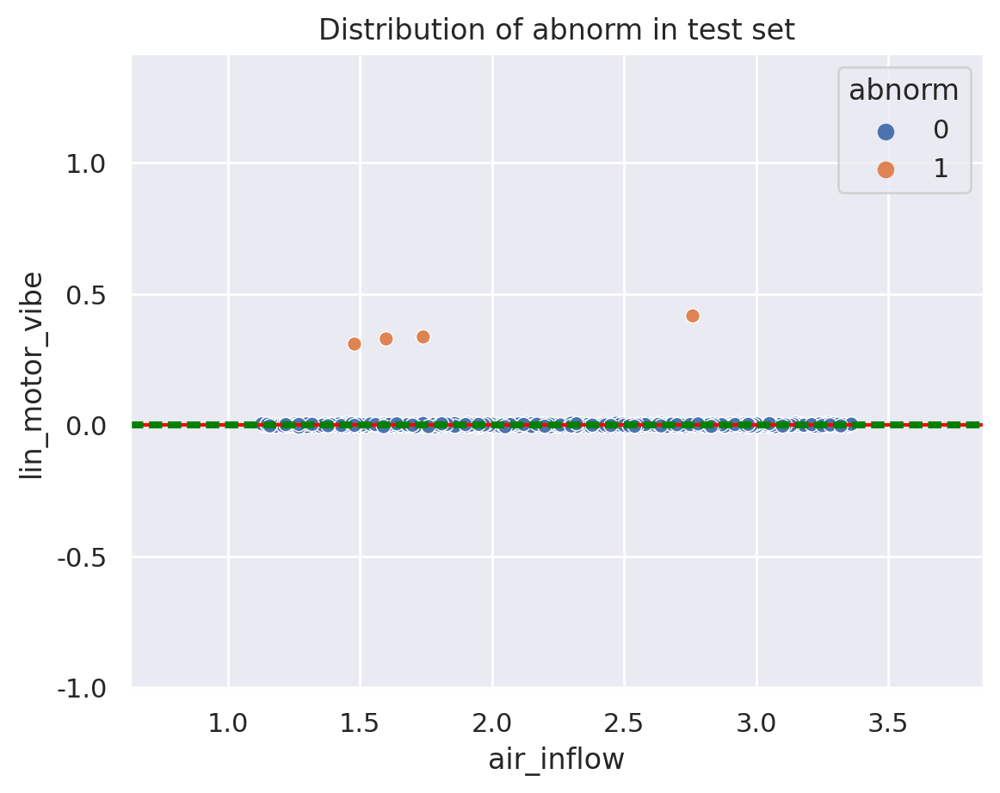

In [ ]:
# motor_vibe
n_type = 7
col = 'motor_vibe'
pred_tmp = isabnormal(n_type,col,only_abnormal=False,threshold=0.1)
df_pred_7['motor_vibe'] = pred_tmp

In [ ]:
# 최종 예측치 만들기
df_pred_7['pred'] = df_pred_7.sum(axis=1)
pred_7 = df_pred_7['pred'].apply(lambda x : 1 if x else 0).tolist()
print('전체 데이터 수:', len(pred_7))
print('고장 데이터 수: ', sum(pred_7))
print('고장 데이터 비율: ', round(sum(pred_7)/len(pred_7),4))

전체 데이터 수: 558
고장 데이터 수:  4
고장 데이터 비율:  0.0072


In [ ]:
x_test_7['pred'] = pred_7

In [ ]:
df_pred_7['pred'].value_counts()

0    554
5      4
Name: pred, dtype: int64

# Predict by type

In [ ]:
df_pred0 = df_pred.copy()

In [ ]:
df_pred_air = pd.concat([x_test_0,x_test_1,x_test_2,x_test_3,x_test_4,x_test_5,x_test_6,x_test_7],axis=0).sort_index()

In [ ]:
df_pred1 = pd.concat([x_test_0,x_test_1,x_test_2,x_test_3,x_test_4,x_test_5,x_test_6,x_test_7],axis=0).sort_index()
df_pred1

,air_inflow,air_end_temp,motor_current,motor_rpm,motor_temp,motor_vibe,type,out_pressure,lin_air_inflow,lin_air_end_temp,lin_motor_current,lin_motor_rpm,lin_motor_temp,lin_motor_vibe,pred
0,2.51,53.28,32.54,2662.0,69.58,3.48,0,0.7,-0.006233,-0.023112,-0.022305,-2.167766,-0.021927,7.018582e-16,0
1,2.66,55.24,34.45,2819.0,71.32,3.57,0,0.7,-0.009262,-0.088088,-0.092346,-7.170058,-0.081946,7.018582e-16,0
2,1.72,42.74,22.23,1819.0,60.21,3.01,0,0.7,0.002919,0.011762,0.007905,0.844203,0.008174,7.018582e-16,0
3,2.20,49.15,28.50,2332.0,65.91,3.30,0,0.7,-0.010175,-0.103160,-0.102225,-8.163182,-0.091888,7.018582e-16,0
4,2.06,47.28,26.67,2182.0,64.24,3.21,0,0.7,0.002854,0.051815,0.047815,3.839110,0.038131,7.018582e-16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7384,2.12,48.08,27.45,2246.0,64.96,3.25,7,0.7,-0.004616,-0.041594,-0.045382,-3.618615,-0.035703,-1.368737e-15,0
7385,1.48,39.63,19.19,1570.0,57.44,2.87,7,0.7,0.001606,0.056652,0.052876,4.242936,0.042564,-1.368737e-15,0
7386,1.56,40.61,20.15,1649.0,58.32,2.92,7,0.7,-0.003423,-0.088117,-0.086895,-6.738847,-0.077208,-1.368737e-15,0
7387,1.59,40.99,20.52,1679.0,58.66,2.93,7,0.7,0.009571,0.066929,0.063151,5.264797,0.062838,-1.368737e-15,0


In [ ]:
# out_pressure 고장 처리
display(df_pred_air.loc[[4917, 4918, 4919, 4920, 4921, 4922, 4923],'pred'])
df_pred_air.loc[[4917, 4918, 4919, 4920, 4921, 4922, 4923],'pred']=1
display(df_pred_air.loc[[4917, 4918, 4919, 4920, 4921, 4922, 4923],'pred'])

4917    0
4918    0
4919    0
4920    0
4921    0
4922    0
4923    0
Name: pred, dtype: int64

4917    1
4918    1
4919    1
4920    1
4921    1
4922    1
4923    1
Name: pred, dtype: int64

In [ ]:
df_pred_air_inflow = df_pred_air.copy()
cnt_tot, cnt_ab = 0,0
for i in range(8):
    tmp_pred = df_pred_air_inflow.loc[df_pred_air_inflow['type']==i,'pred']
    print(f'type=={i} 표본 개수: {len(tmp_pred)}, 이상치 개수: {sum(tmp_pred)}')
    cnt_tot += len(tmp_pred)
    cnt_ab += sum(tmp_pred)
print('-'*70)
print(f'전체 표본 개수: {cnt_tot}, 이상치 개수: {cnt_ab}')

type==0 표본 개수: 1296, 이상치 개수: 143
type==1 표본 개수: 1107, 이상치 개수: 2
type==2 표본 개수: 1098, 이상치 개수: 27
type==3 표본 개수: 918, 이상치 개수: 26
type==4 표본 개수: 918, 이상치 개수: 13
type==5 표본 개수: 747, 이상치 개수: 30
type==6 표본 개수: 747, 이상치 개수: 101
type==7 표본 개수: 558, 이상치 개수: 4
----------------------------------------------------------------------
전체 표본 개수: 7389, 이상치 개수: 346


# submit

In [ ]:
def make_sub(filename, pred) :
    df_sub = pd.read_csv('/content/drive/MyDrive/collab/기임/공기압축기이상판단/answer_sample.csv')
    df_sub['label'] = pred
    df_sub.to_csv(f'/content/drive/MyDrive/collab/기임/공기압축기이상판단/김영빈/submission/{filename}.csv', index=False)
    print('제출 파일 작성 완료!')

In [ ]:
make_sub('submit',df_pred_air_inflow['pred'])

제출 파일 작성 완료!
